# Norman

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import rapids_singlecell as rsc
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [3]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_Norman2019_prep_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    gc.collect()
adata

AnnData object with n_obs × n_vars = 108497 × 5000
    obs: 'cov_drug_dose_name', 'dose_val', 'control', 'condition', 'guide_identity', 'drug_dose_name', 'cell_type', 'split', 'split1', 'split2', 'split3', 'split4', 'split5', 'split6', 'split7', 'split8', 'split9', 'split10', 'split11', 'split12', 'split13', 'split14', 'split15', 'split16', 'split17', 'split18', 'split19', 'split20', 'split21', 'split22', 'split23', 'split24', 'split25'
    var: 'gene_symbols', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'rank_genes_groups_cov'

## Train

In [5]:
warmup_epoch_range = [12, 48]
dtc_w1 = 1000
dtc_w2 = 100

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [6]:
n_epochs_kl_warmup = 400

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 12 * len(disentenglement_targets_configurations)), 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True,
    deeply_inject_disentengled_latents = False,
    encode_covariates=False
)

train_params = dict(
    max_epochs=1000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_conference
ID: cfkz6c1v
Name: grateful-lion-625
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_conference/runs/cfkz6c1v
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240507_121106-cfkz6c1v/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100 80GB PCIe') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/1000 [00:00<?, ?it/s]

Epoch 1/1000:   0%|          | 0/1000 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 226,378,460,188,399,298,534,139,468,372,423,375,236,294,42,220,446,302,272,529,241,269,158,54,330,137,106,281,106,90,179,200,49,322,227,173,258,133,88,199,368,466,325,979,149,367,174,190,295,320,225,142,371,247,266,373,309,638,312,301,222,591,246,154,256,335,273,751,362,350,263,364,354,342,130,226,218,160,53,109,196,513,305,283,333,212,154,246,373,168,149,109,267,367,153,151,447,75,159,294,178,364,108,230,194,209,324,132,145,302,270,114,114,341,352,353,260,44,47,213,218,261,77,198,334,255,192,241,290,214,972,263,202,515,290,155,521,349,510,465,209,453,468,279,350,236,362,242,287,307,279,243,256,403,402,252,240,193,151,596,255,237,136,155,166,158,540,255,378,201,272,418,616,419,296,254,238,229,180,173,209,185,211,252,626,335,340,363,376,7165,415,269,188,165,359,182,260,258,168,3

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `condition` for `validation` set. Number of elements in each group: 50,103,98,44,96,81,153,36,114,91,110,89,65,64,17,44,116,63,76,134,65,66,30,10,80,47,28,83,20,17,51,45,15,90,59,38,73,47,26,38,100,100,90,240,30,108,41,51,60,78,60,36,99,81,63,105,78,149,70,65,68,140,51,29,66,90,81,154,79,95,61,95,97,103,29,58,59,31,18,42,51,117,77,62,93,60,38,49,106,48,26,21,62,127,39,49,105,21,34,74,37,99,18,73,43,65,86,35,38,66,79,26,27,104,75,91,67,10,12,53,60,68,19,56,61,56,45,57,71,49,225,74,39,132,85,37,102,83,116,116,52,118,111,59,101,64,82,60,76,59,60,59,63,97,95,61,58,44,41,174,55,56,40,31,49,44,127,60,102,68,73,94,134,94,76,68,46,62,38,49,55,51,44,53,137,99,72,83,87,1742,115,80,57,46,87,35,71,74,32,76,31,75,71,72,85,123,68,58,92,27,12,55,67,80,21,53,60,84,45,55,69,82,57,58,67,64,58,70,51,66,73,120,53,69,19,46,35,120,123,140,120,68,65,50,211,119,29,5

Epoch 1/1000:   0%|          | 1/1000 [00:13<3:45:32, 13.55s/it]

Epoch 1/1000:   0%|          | 1/1000 [00:13<3:45:32, 13.55s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=118]

Epoch 2/1000:   0%|          | 1/1000 [00:13<3:45:32, 13.55s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=118]

Epoch 2/1000:   0%|          | 2/1000 [00:20<2:38:42,  9.54s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=118]

Epoch 2/1000:   0%|          | 2/1000 [00:20<2:38:42,  9.54s/it, v_num=1v_1, total_loss_train=1.31e+3, kl_local_train=59.3]

Epoch 3/1000:   0%|          | 2/1000 [00:20<2:38:42,  9.54s/it, v_num=1v_1, total_loss_train=1.31e+3, kl_local_train=59.3]

Epoch 3/1000:   0%|          | 3/1000 [00:27<2:17:20,  8.27s/it, v_num=1v_1, total_loss_train=1.31e+3, kl_local_train=59.3]

Epoch 3/1000:   0%|          | 3/1000 [00:27<2:17:20,  8.27s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=6.14] 

Epoch 4/1000:   0%|          | 3/1000 [00:27<2:17:20,  8.27s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=6.14]

Epoch 4/1000:   0%|          | 4/1000 [00:33<2:06:59,  7.65s/it, v_num=1v_1, total_loss_train=1.3e+3, kl_local_train=6.14]

Epoch 4/1000:   0%|          | 4/1000 [00:33<2:06:59,  7.65s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=2.28]

Epoch 5/1000:   0%|          | 4/1000 [00:33<2:06:59,  7.65s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=2.28]

Epoch 5/1000:   0%|          | 5/1000 [00:40<2:01:28,  7.33s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=2.28]

Epoch 5/1000:   0%|          | 5/1000 [00:40<2:01:28,  7.33s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=1.13]

Epoch 6/1000:   0%|          | 5/1000 [00:40<2:01:28,  7.33s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=1.13]

Epoch 6/1000:   1%|          | 6/1000 [00:47<1:58:17,  7.14s/it, v_num=1v_1, total_loss_train=1.28e+3, kl_local_train=1.13]

Epoch 6/1000:   1%|          | 6/1000 [00:47<1:58:17,  7.14s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=0.791]

Epoch 7/1000:   1%|          | 6/1000 [00:47<1:58:17,  7.14s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=0.791]

Epoch 7/1000:   1%|          | 7/1000 [00:53<1:55:55,  7.00s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=0.791]

Epoch 7/1000:   1%|          | 7/1000 [00:53<1:55:55,  7.00s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=0.668]

Epoch 8/1000:   1%|          | 7/1000 [00:54<1:55:55,  7.00s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=0.668]

Epoch 8/1000:   1%|          | 8/1000 [01:00<1:54:26,  6.92s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=0.668]

Epoch 8/1000:   1%|          | 8/1000 [01:00<1:54:26,  6.92s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=0.584]

Epoch 9/1000:   1%|          | 8/1000 [01:00<1:54:26,  6.92s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=0.584]

Epoch 9/1000:   1%|          | 9/1000 [01:07<1:53:20,  6.86s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=0.584]

Epoch 9/1000:   1%|          | 9/1000 [01:07<1:53:20,  6.86s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=0.54] 

Epoch 10/1000:   1%|          | 9/1000 [01:07<1:53:20,  6.86s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=0.54]

Epoch 10/1000:   1%|          | 10/1000 [01:14<1:52:41,  6.83s/it, v_num=1v_1, total_loss_train=1.26e+3, kl_local_train=0.54]

Epoch 10/1000:   1%|          | 10/1000 [01:14<1:52:41,  6.83s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=14.7]

Epoch 11/1000:   1%|          | 10/1000 [01:14<1:52:41,  6.83s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=14.7]

Epoch 11/1000:   1%|          | 11/1000 [01:20<1:52:08,  6.80s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=14.7]

Epoch 11/1000:   1%|          | 11/1000 [01:20<1:52:08,  6.80s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=18.3]

Epoch 12/1000:   1%|          | 11/1000 [01:20<1:52:08,  6.80s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=18.3]

Epoch 12/1000:   1%|          | 12/1000 [01:27<1:51:51,  6.79s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=18.3]

Epoch 12/1000:   1%|          | 12/1000 [01:27<1:51:51,  6.79s/it, v_num=1v_1, total_loss_train=1.22e+3, kl_local_train=22.5]

Epoch 13/1000:   1%|          | 12/1000 [01:27<1:51:51,  6.79s/it, v_num=1v_1, total_loss_train=1.22e+3, kl_local_train=22.5]

Epoch 13/1000:   1%|▏         | 13/1000 [01:34<1:51:38,  6.79s/it, v_num=1v_1, total_loss_train=1.22e+3, kl_local_train=22.5]

Epoch 13/1000:   1%|▏         | 13/1000 [01:34<1:51:38,  6.79s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=26.4]

Epoch 14/1000:   1%|▏         | 13/1000 [01:34<1:51:38,  6.79s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=26.4]

Epoch 14/1000:   1%|▏         | 14/1000 [01:41<1:51:28,  6.78s/it, v_num=1v_1, total_loss_train=1.21e+3, kl_local_train=26.4]

Epoch 14/1000:   1%|▏         | 14/1000 [01:41<1:51:28,  6.78s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=29.9]

Epoch 15/1000:   1%|▏         | 14/1000 [01:41<1:51:28,  6.78s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=29.9]

Epoch 15/1000:   2%|▏         | 15/1000 [01:48<1:51:21,  6.78s/it, v_num=1v_1, total_loss_train=1.23e+3, kl_local_train=29.9]

Epoch 15/1000:   2%|▏         | 15/1000 [01:48<1:51:21,  6.78s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=39.5]

Epoch 16/1000:   2%|▏         | 15/1000 [01:48<1:51:21,  6.78s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=39.5]

Epoch 16/1000:   2%|▏         | 16/1000 [01:54<1:51:04,  6.77s/it, v_num=1v_1, total_loss_train=1.25e+3, kl_local_train=39.5]

Epoch 16/1000:   2%|▏         | 16/1000 [01:54<1:51:04,  6.77s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=56.1]

Epoch 17/1000:   2%|▏         | 16/1000 [01:54<1:51:04,  6.77s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=56.1]

Epoch 17/1000:   2%|▏         | 17/1000 [02:01<1:50:53,  6.77s/it, v_num=1v_1, total_loss_train=1.27e+3, kl_local_train=56.1]

Epoch 17/1000:   2%|▏         | 17/1000 [02:01<1:50:53,  6.77s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=71.1]

Epoch 18/1000:   2%|▏         | 17/1000 [02:01<1:50:53,  6.77s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=71.1]

Epoch 18/1000:   2%|▏         | 18/1000 [02:08<1:50:39,  6.76s/it, v_num=1v_1, total_loss_train=1.29e+3, kl_local_train=71.1]

Epoch 18/1000:   2%|▏         | 18/1000 [02:08<1:50:39,  6.76s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=91.5]

Epoch 19/1000:   2%|▏         | 18/1000 [02:08<1:50:39,  6.76s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=91.5]

Epoch 19/1000:   2%|▏         | 19/1000 [02:15<1:50:32,  6.76s/it, v_num=1v_1, total_loss_train=1.32e+3, kl_local_train=91.5]

Epoch 19/1000:   2%|▏         | 19/1000 [02:15<1:50:32,  6.76s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=115] 

Epoch 20/1000:   2%|▏         | 19/1000 [02:15<1:50:32,  6.76s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=115]

Epoch 20/1000:   2%|▏         | 20/1000 [02:21<1:50:19,  6.75s/it, v_num=1v_1, total_loss_train=1.34e+3, kl_local_train=115]

Epoch 20/1000:   2%|▏         | 20/1000 [02:21<1:50:19,  6.75s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=136]

Epoch 21/1000:   2%|▏         | 20/1000 [02:21<1:50:19,  6.75s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=136]

Epoch 21/1000:   2%|▏         | 21/1000 [02:28<1:50:09,  6.75s/it, v_num=1v_1, total_loss_train=1.36e+3, kl_local_train=136]

Epoch 21/1000:   2%|▏         | 21/1000 [02:28<1:50:09,  6.75s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=152]

Epoch 22/1000:   2%|▏         | 21/1000 [02:28<1:50:09,  6.75s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=152]

Epoch 22/1000:   2%|▏         | 22/1000 [02:35<1:50:04,  6.75s/it, v_num=1v_1, total_loss_train=1.39e+3, kl_local_train=152]

Epoch 22/1000:   2%|▏         | 22/1000 [02:35<1:50:04,  6.75s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=179]

Epoch 23/1000:   2%|▏         | 22/1000 [02:35<1:50:04,  6.75s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=179]

Epoch 23/1000:   2%|▏         | 23/1000 [02:42<1:49:59,  6.76s/it, v_num=1v_1, total_loss_train=1.41e+3, kl_local_train=179]

Epoch 23/1000:   2%|▏         | 23/1000 [02:42<1:49:59,  6.76s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=161]

Epoch 24/1000:   2%|▏         | 23/1000 [02:42<1:49:59,  6.76s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=161]

Epoch 24/1000:   2%|▏         | 24/1000 [02:48<1:49:56,  6.76s/it, v_num=1v_1, total_loss_train=1.44e+3, kl_local_train=161]

Epoch 24/1000:   2%|▏         | 24/1000 [02:48<1:49:56,  6.76s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=191]

Epoch 25/1000:   2%|▏         | 24/1000 [02:48<1:49:56,  6.76s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=191]

Epoch 25/1000:   2%|▎         | 25/1000 [02:55<1:49:46,  6.75s/it, v_num=1v_1, total_loss_train=1.46e+3, kl_local_train=191]

Epoch 25/1000:   2%|▎         | 25/1000 [02:55<1:49:46,  6.75s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 26/1000:   2%|▎         | 25/1000 [02:55<1:49:46,  6.75s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 26/1000:   3%|▎         | 26/1000 [03:02<1:49:45,  6.76s/it, v_num=1v_1, total_loss_train=1.48e+3, kl_local_train=183]

Epoch 26/1000:   3%|▎         | 26/1000 [03:02<1:49:45,  6.76s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=211]

Epoch 27/1000:   3%|▎         | 26/1000 [03:02<1:49:45,  6.76s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=211]

Epoch 27/1000:   3%|▎         | 27/1000 [03:09<1:49:30,  6.75s/it, v_num=1v_1, total_loss_train=1.51e+3, kl_local_train=211]

Epoch 27/1000:   3%|▎         | 27/1000 [03:09<1:49:30,  6.75s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=196]

Epoch 28/1000:   3%|▎         | 27/1000 [03:09<1:49:30,  6.75s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=196]

Epoch 28/1000:   3%|▎         | 28/1000 [03:15<1:49:24,  6.75s/it, v_num=1v_1, total_loss_train=1.54e+3, kl_local_train=196]

Epoch 28/1000:   3%|▎         | 28/1000 [03:15<1:49:24,  6.75s/it, v_num=1v_1, total_loss_train=1.56e+3, kl_local_train=192]

Epoch 29/1000:   3%|▎         | 28/1000 [03:15<1:49:24,  6.75s/it, v_num=1v_1, total_loss_train=1.56e+3, kl_local_train=192]

Epoch 29/1000:   3%|▎         | 29/1000 [03:22<1:49:13,  6.75s/it, v_num=1v_1, total_loss_train=1.56e+3, kl_local_train=192]

Epoch 29/1000:   3%|▎         | 29/1000 [03:22<1:49:13,  6.75s/it, v_num=1v_1, total_loss_train=1.58e+3, kl_local_train=190]

Epoch 30/1000:   3%|▎         | 29/1000 [03:22<1:49:13,  6.75s/it, v_num=1v_1, total_loss_train=1.58e+3, kl_local_train=190]

Epoch 30/1000:   3%|▎         | 30/1000 [03:29<1:49:04,  6.75s/it, v_num=1v_1, total_loss_train=1.58e+3, kl_local_train=190]

Epoch 30/1000:   3%|▎         | 30/1000 [03:29<1:49:04,  6.75s/it, v_num=1v_1, total_loss_train=1.61e+3, kl_local_train=203]

Epoch 31/1000:   3%|▎         | 30/1000 [03:29<1:49:04,  6.75s/it, v_num=1v_1, total_loss_train=1.61e+3, kl_local_train=203]

Epoch 31/1000:   3%|▎         | 31/1000 [03:36<1:48:59,  6.75s/it, v_num=1v_1, total_loss_train=1.61e+3, kl_local_train=203]

Epoch 31/1000:   3%|▎         | 31/1000 [03:36<1:48:59,  6.75s/it, v_num=1v_1, total_loss_train=1.64e+3, kl_local_train=214]

Epoch 32/1000:   3%|▎         | 31/1000 [03:36<1:48:59,  6.75s/it, v_num=1v_1, total_loss_train=1.64e+3, kl_local_train=214]

Epoch 32/1000:   3%|▎         | 32/1000 [03:42<1:48:49,  6.75s/it, v_num=1v_1, total_loss_train=1.64e+3, kl_local_train=214]

Epoch 32/1000:   3%|▎         | 32/1000 [03:42<1:48:49,  6.75s/it, v_num=1v_1, total_loss_train=1.66e+3, kl_local_train=234]

Epoch 33/1000:   3%|▎         | 32/1000 [03:42<1:48:49,  6.75s/it, v_num=1v_1, total_loss_train=1.66e+3, kl_local_train=234]

Epoch 33/1000:   3%|▎         | 33/1000 [03:49<1:48:47,  6.75s/it, v_num=1v_1, total_loss_train=1.66e+3, kl_local_train=234]

Epoch 33/1000:   3%|▎         | 33/1000 [03:49<1:48:47,  6.75s/it, v_num=1v_1, total_loss_train=1.69e+3, kl_local_train=233]

Epoch 34/1000:   3%|▎         | 33/1000 [03:49<1:48:47,  6.75s/it, v_num=1v_1, total_loss_train=1.69e+3, kl_local_train=233]

Epoch 34/1000:   3%|▎         | 34/1000 [03:56<1:48:45,  6.75s/it, v_num=1v_1, total_loss_train=1.69e+3, kl_local_train=233]

Epoch 34/1000:   3%|▎         | 34/1000 [03:56<1:48:45,  6.75s/it, v_num=1v_1, total_loss_train=1.71e+3, kl_local_train=224]

Epoch 35/1000:   3%|▎         | 34/1000 [03:56<1:48:45,  6.75s/it, v_num=1v_1, total_loss_train=1.71e+3, kl_local_train=224]

Epoch 35/1000:   4%|▎         | 35/1000 [04:03<1:48:45,  6.76s/it, v_num=1v_1, total_loss_train=1.71e+3, kl_local_train=224]

Epoch 35/1000:   4%|▎         | 35/1000 [04:03<1:48:45,  6.76s/it, v_num=1v_1, total_loss_train=1.74e+3, kl_local_train=211]

Epoch 36/1000:   4%|▎         | 35/1000 [04:03<1:48:45,  6.76s/it, v_num=1v_1, total_loss_train=1.74e+3, kl_local_train=211]

Epoch 36/1000:   4%|▎         | 36/1000 [04:09<1:48:39,  6.76s/it, v_num=1v_1, total_loss_train=1.74e+3, kl_local_train=211]

Epoch 36/1000:   4%|▎         | 36/1000 [04:09<1:48:39,  6.76s/it, v_num=1v_1, total_loss_train=1.77e+3, kl_local_train=243]

Epoch 37/1000:   4%|▎         | 36/1000 [04:09<1:48:39,  6.76s/it, v_num=1v_1, total_loss_train=1.77e+3, kl_local_train=243]

Epoch 37/1000:   4%|▎         | 37/1000 [04:16<1:48:40,  6.77s/it, v_num=1v_1, total_loss_train=1.77e+3, kl_local_train=243]

Epoch 37/1000:   4%|▎         | 37/1000 [04:16<1:48:40,  6.77s/it, v_num=1v_1, total_loss_train=1.79e+3, kl_local_train=262]

Epoch 38/1000:   4%|▎         | 37/1000 [04:16<1:48:40,  6.77s/it, v_num=1v_1, total_loss_train=1.79e+3, kl_local_train=262]

Epoch 38/1000:   4%|▍         | 38/1000 [04:23<1:48:29,  6.77s/it, v_num=1v_1, total_loss_train=1.79e+3, kl_local_train=262]

Epoch 38/1000:   4%|▍         | 38/1000 [04:23<1:48:29,  6.77s/it, v_num=1v_1, total_loss_train=1.82e+3, kl_local_train=240]

Epoch 39/1000:   4%|▍         | 38/1000 [04:23<1:48:29,  6.77s/it, v_num=1v_1, total_loss_train=1.82e+3, kl_local_train=240]

Epoch 39/1000:   4%|▍         | 39/1000 [04:30<1:48:19,  6.76s/it, v_num=1v_1, total_loss_train=1.82e+3, kl_local_train=240]

Epoch 39/1000:   4%|▍         | 39/1000 [04:30<1:48:19,  6.76s/it, v_num=1v_1, total_loss_train=1.84e+3, kl_local_train=257]

Epoch 40/1000:   4%|▍         | 39/1000 [04:30<1:48:19,  6.76s/it, v_num=1v_1, total_loss_train=1.84e+3, kl_local_train=257]

Epoch 40/1000:   4%|▍         | 40/1000 [04:36<1:48:13,  6.76s/it, v_num=1v_1, total_loss_train=1.84e+3, kl_local_train=257]

Epoch 40/1000:   4%|▍         | 40/1000 [04:36<1:48:13,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=261]

Epoch 41/1000:   4%|▍         | 40/1000 [04:36<1:48:13,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=261]

Epoch 41/1000:   4%|▍         | 41/1000 [04:43<1:47:59,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=261]

Epoch 41/1000:   4%|▍         | 41/1000 [04:43<1:47:59,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=233]

Epoch 42/1000:   4%|▍         | 41/1000 [04:43<1:47:59,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=233]

Epoch 42/1000:   4%|▍         | 42/1000 [04:50<1:48:06,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=233]

Epoch 42/1000:   4%|▍         | 42/1000 [04:50<1:48:06,  6.77s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=239]

Epoch 43/1000:   4%|▍         | 42/1000 [04:50<1:48:06,  6.77s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=239]

Epoch 43/1000:   4%|▍         | 43/1000 [04:57<1:48:02,  6.77s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=239]

Epoch 43/1000:   4%|▍         | 43/1000 [04:57<1:48:02,  6.77s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=245]

Epoch 44/1000:   4%|▍         | 43/1000 [04:57<1:48:02,  6.77s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=245]

Epoch 44/1000:   4%|▍         | 44/1000 [05:04<1:48:02,  6.78s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=245]

Epoch 44/1000:   4%|▍         | 44/1000 [05:04<1:48:02,  6.78s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=234]

Epoch 45/1000:   4%|▍         | 44/1000 [05:04<1:48:02,  6.78s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=234]

Epoch 45/1000:   4%|▍         | 45/1000 [05:10<1:47:47,  6.77s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=234]

Epoch 45/1000:   4%|▍         | 45/1000 [05:10<1:47:47,  6.77s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=273]   

Epoch 46/1000:   4%|▍         | 45/1000 [05:10<1:47:47,  6.77s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=273]

Epoch 46/1000:   5%|▍         | 46/1000 [05:17<1:47:38,  6.77s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=273]

Epoch 46/1000:   5%|▍         | 46/1000 [05:17<1:47:38,  6.77s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=279]

Epoch 47/1000:   5%|▍         | 46/1000 [05:17<1:47:38,  6.77s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=279]

Epoch 47/1000:   5%|▍         | 47/1000 [05:24<1:47:25,  6.76s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=279]

Epoch 47/1000:   5%|▍         | 47/1000 [05:24<1:47:25,  6.76s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=272]

Epoch 48/1000:   5%|▍         | 47/1000 [05:24<1:47:25,  6.76s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=272]

Epoch 48/1000:   5%|▍         | 48/1000 [05:31<1:47:13,  6.76s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=272]

Epoch 48/1000:   5%|▍         | 48/1000 [05:31<1:47:13,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=256]

Epoch 49/1000:   5%|▍         | 48/1000 [05:31<1:47:13,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=256]

Epoch 49/1000:   5%|▍         | 49/1000 [05:37<1:46:59,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=256]

Epoch 49/1000:   5%|▍         | 49/1000 [05:37<1:46:59,  6.75s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=276] 

Epoch 50/1000:   5%|▍         | 49/1000 [05:37<1:46:59,  6.75s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=276]

Epoch 50/1000:   5%|▌         | 50/1000 [05:44<1:46:57,  6.76s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=276]

Epoch 50/1000:   5%|▌         | 50/1000 [05:44<1:46:57,  6.76s/it, v_num=1v_1, total_loss_train=2.13e+3, kl_local_train=279]

Epoch 51/1000:   5%|▌         | 50/1000 [05:44<1:46:57,  6.76s/it, v_num=1v_1, total_loss_train=2.13e+3, kl_local_train=279]

Epoch 51/1000:   5%|▌         | 51/1000 [05:51<1:47:04,  6.77s/it, v_num=1v_1, total_loss_train=2.13e+3, kl_local_train=279]

Epoch 51/1000:   5%|▌         | 51/1000 [05:51<1:47:04,  6.77s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=284]

Epoch 52/1000:   5%|▌         | 51/1000 [05:51<1:47:04,  6.77s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=284]

Epoch 52/1000:   5%|▌         | 52/1000 [05:58<1:46:49,  6.76s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=284]

Epoch 52/1000:   5%|▌         | 52/1000 [05:58<1:46:49,  6.76s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=272]

Epoch 53/1000:   5%|▌         | 52/1000 [05:58<1:46:49,  6.76s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=272]

Epoch 53/1000:   5%|▌         | 53/1000 [06:04<1:46:47,  6.77s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=272]

Epoch 53/1000:   5%|▌         | 53/1000 [06:04<1:46:47,  6.77s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=267]

Epoch 54/1000:   5%|▌         | 53/1000 [06:04<1:46:47,  6.77s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=267]

Epoch 54/1000:   5%|▌         | 54/1000 [06:11<1:46:32,  6.76s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=267]

Epoch 54/1000:   5%|▌         | 54/1000 [06:11<1:46:32,  6.76s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=262]

Epoch 55/1000:   5%|▌         | 54/1000 [06:11<1:46:32,  6.76s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=262]

Epoch 55/1000:   6%|▌         | 55/1000 [06:18<1:46:32,  6.77s/it, v_num=1v_1, total_loss_train=2.12e+3, kl_local_train=262]

Epoch 55/1000:   6%|▌         | 55/1000 [06:18<1:46:32,  6.77s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=217]

Epoch 56/1000:   6%|▌         | 55/1000 [06:18<1:46:32,  6.77s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=217]

Epoch 56/1000:   6%|▌         | 56/1000 [06:25<1:46:18,  6.76s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=217]

Epoch 56/1000:   6%|▌         | 56/1000 [06:25<1:46:18,  6.76s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=238]

Epoch 57/1000:   6%|▌         | 56/1000 [06:25<1:46:18,  6.76s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=238]

Epoch 57/1000:   6%|▌         | 57/1000 [06:31<1:45:55,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=238]

Epoch 57/1000:   6%|▌         | 57/1000 [06:31<1:45:55,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=218]

Epoch 58/1000:   6%|▌         | 57/1000 [06:31<1:45:55,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=218]

Epoch 58/1000:   6%|▌         | 58/1000 [06:38<1:45:44,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=218]

Epoch 58/1000:   6%|▌         | 58/1000 [06:38<1:45:44,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=207]

Epoch 59/1000:   6%|▌         | 58/1000 [06:38<1:45:44,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=207]

Epoch 59/1000:   6%|▌         | 59/1000 [06:45<1:45:42,  6.74s/it, v_num=1v_1, total_loss_train=2.11e+3, kl_local_train=207]

Epoch 59/1000:   6%|▌         | 59/1000 [06:45<1:45:42,  6.74s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=202] 

Epoch 60/1000:   6%|▌         | 59/1000 [06:45<1:45:42,  6.74s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=202]

Epoch 60/1000:   6%|▌         | 60/1000 [06:52<1:45:37,  6.74s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=202]

Epoch 60/1000:   6%|▌         | 60/1000 [06:52<1:45:37,  6.74s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=190]

Epoch 61/1000:   6%|▌         | 60/1000 [06:52<1:45:37,  6.74s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=190]

Epoch 61/1000:   6%|▌         | 61/1000 [06:58<1:45:41,  6.75s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=190]

Epoch 61/1000:   6%|▌         | 61/1000 [06:58<1:45:41,  6.75s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=197]

Epoch 62/1000:   6%|▌         | 61/1000 [06:58<1:45:41,  6.75s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=197]

Epoch 62/1000:   6%|▌         | 62/1000 [07:05<1:45:14,  6.73s/it, v_num=1v_1, total_loss_train=2.1e+3, kl_local_train=197]

Epoch 62/1000:   6%|▌         | 62/1000 [07:05<1:45:14,  6.73s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=175]

Epoch 63/1000:   6%|▌         | 62/1000 [07:05<1:45:14,  6.73s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=175]

Epoch 63/1000:   6%|▋         | 63/1000 [07:12<1:45:17,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=175]

Epoch 63/1000:   6%|▋         | 63/1000 [07:12<1:45:17,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=192]

Epoch 64/1000:   6%|▋         | 63/1000 [07:12<1:45:17,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=192]

Epoch 64/1000:   6%|▋         | 64/1000 [07:19<1:45:15,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=192]

Epoch 64/1000:   6%|▋         | 64/1000 [07:19<1:45:15,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=193]

Epoch 65/1000:   6%|▋         | 64/1000 [07:19<1:45:15,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=193]

Epoch 65/1000:   6%|▋         | 65/1000 [07:25<1:45:10,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=193]

Epoch 65/1000:   6%|▋         | 65/1000 [07:25<1:45:10,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=160]

Epoch 66/1000:   6%|▋         | 65/1000 [07:25<1:45:10,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=160]

Epoch 66/1000:   7%|▋         | 66/1000 [07:32<1:44:56,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=160]

Epoch 66/1000:   7%|▋         | 66/1000 [07:32<1:44:56,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=183]

Epoch 67/1000:   7%|▋         | 66/1000 [07:32<1:44:56,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=183]

Epoch 67/1000:   7%|▋         | 67/1000 [07:39<1:44:48,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=183]

Epoch 67/1000:   7%|▋         | 67/1000 [07:39<1:44:48,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=171]

Epoch 68/1000:   7%|▋         | 67/1000 [07:39<1:44:48,  6.74s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=171]

Epoch 68/1000:   7%|▋         | 68/1000 [07:46<1:44:53,  6.75s/it, v_num=1v_1, total_loss_train=2.09e+3, kl_local_train=171]

Epoch 68/1000:   7%|▋         | 68/1000 [07:46<1:44:53,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=167]

Epoch 69/1000:   7%|▋         | 68/1000 [07:46<1:44:53,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=167]

Epoch 69/1000:   7%|▋         | 69/1000 [07:52<1:44:47,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=167]

Epoch 69/1000:   7%|▋         | 69/1000 [07:52<1:44:47,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=169]

Epoch 70/1000:   7%|▋         | 69/1000 [07:52<1:44:47,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=169]

Epoch 70/1000:   7%|▋         | 70/1000 [07:59<1:44:43,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=169]

Epoch 70/1000:   7%|▋         | 70/1000 [07:59<1:44:43,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=161]

Epoch 71/1000:   7%|▋         | 70/1000 [07:59<1:44:43,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=161]

Epoch 71/1000:   7%|▋         | 71/1000 [08:06<1:44:41,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=161]

Epoch 71/1000:   7%|▋         | 71/1000 [08:06<1:44:41,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=174]

Epoch 72/1000:   7%|▋         | 71/1000 [08:06<1:44:41,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=174]

Epoch 72/1000:   7%|▋         | 72/1000 [08:13<1:44:28,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=174]

Epoch 72/1000:   7%|▋         | 72/1000 [08:13<1:44:28,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=156]

Epoch 73/1000:   7%|▋         | 72/1000 [08:13<1:44:28,  6.75s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=156]

Epoch 73/1000:   7%|▋         | 73/1000 [08:19<1:44:23,  6.76s/it, v_num=1v_1, total_loss_train=2.08e+3, kl_local_train=156]

Epoch 73/1000:   7%|▋         | 73/1000 [08:19<1:44:23,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=154]

Epoch 74/1000:   7%|▋         | 73/1000 [08:19<1:44:23,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=154]

Epoch 74/1000:   7%|▋         | 74/1000 [08:26<1:44:14,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=154]

Epoch 74/1000:   7%|▋         | 74/1000 [08:26<1:44:14,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=138]

Epoch 75/1000:   7%|▋         | 74/1000 [08:26<1:44:14,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=138]

Epoch 75/1000:   8%|▊         | 75/1000 [08:33<1:44:07,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=138]

Epoch 75/1000:   8%|▊         | 75/1000 [08:33<1:44:07,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=138]

Epoch 76/1000:   8%|▊         | 75/1000 [08:33<1:44:07,  6.75s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=138]

Epoch 76/1000:   8%|▊         | 76/1000 [08:40<1:44:07,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=138]

Epoch 76/1000:   8%|▊         | 76/1000 [08:40<1:44:07,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=148]

Epoch 77/1000:   8%|▊         | 76/1000 [08:40<1:44:07,  6.76s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=148]

Epoch 77/1000:   8%|▊         | 77/1000 [08:46<1:44:11,  6.77s/it, v_num=1v_1, total_loss_train=2.07e+3, kl_local_train=148]

Epoch 77/1000:   8%|▊         | 77/1000 [08:46<1:44:11,  6.77s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=138]

Epoch 78/1000:   8%|▊         | 77/1000 [08:46<1:44:11,  6.77s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=138]

Epoch 78/1000:   8%|▊         | 78/1000 [08:53<1:44:03,  6.77s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=138]

Epoch 78/1000:   8%|▊         | 78/1000 [08:53<1:44:03,  6.77s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=134]

Epoch 79/1000:   8%|▊         | 78/1000 [08:53<1:44:03,  6.77s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=134]

Epoch 79/1000:   8%|▊         | 79/1000 [09:00<1:44:42,  6.82s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=134]

Epoch 79/1000:   8%|▊         | 79/1000 [09:00<1:44:42,  6.82s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=133]

Epoch 80/1000:   8%|▊         | 79/1000 [09:00<1:44:42,  6.82s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=133]

Epoch 80/1000:   8%|▊         | 80/1000 [09:07<1:44:28,  6.81s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=133]

Epoch 80/1000:   8%|▊         | 80/1000 [09:07<1:44:28,  6.81s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=145]

Epoch 81/1000:   8%|▊         | 80/1000 [09:07<1:44:28,  6.81s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=145]

Epoch 81/1000:   8%|▊         | 81/1000 [09:14<1:44:13,  6.81s/it, v_num=1v_1, total_loss_train=2.06e+3, kl_local_train=145]

Epoch 81/1000:   8%|▊         | 81/1000 [09:14<1:44:13,  6.81s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=118]

Epoch 82/1000:   8%|▊         | 81/1000 [09:14<1:44:13,  6.81s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=118]

Epoch 82/1000:   8%|▊         | 82/1000 [09:21<1:44:02,  6.80s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=118]

Epoch 82/1000:   8%|▊         | 82/1000 [09:21<1:44:02,  6.80s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=125]

Epoch 83/1000:   8%|▊         | 82/1000 [09:21<1:44:02,  6.80s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=125]

Epoch 83/1000:   8%|▊         | 83/1000 [09:27<1:43:44,  6.79s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=125]

Epoch 83/1000:   8%|▊         | 83/1000 [09:27<1:43:44,  6.79s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=116]

Epoch 84/1000:   8%|▊         | 83/1000 [09:27<1:43:44,  6.79s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=116]

Epoch 84/1000:   8%|▊         | 84/1000 [09:34<1:43:39,  6.79s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=116]

Epoch 84/1000:   8%|▊         | 84/1000 [09:34<1:43:39,  6.79s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=116]

Epoch 85/1000:   8%|▊         | 84/1000 [09:34<1:43:39,  6.79s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=116]

Epoch 85/1000:   8%|▊         | 85/1000 [09:41<1:43:24,  6.78s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=116]

Epoch 85/1000:   8%|▊         | 85/1000 [09:41<1:43:24,  6.78s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=122]

Epoch 86/1000:   8%|▊         | 85/1000 [09:41<1:43:24,  6.78s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=122]

Epoch 86/1000:   9%|▊         | 86/1000 [09:48<1:44:32,  6.86s/it, v_num=1v_1, total_loss_train=2.05e+3, kl_local_train=122]

Epoch 86/1000:   9%|▊         | 86/1000 [09:48<1:44:32,  6.86s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=109]

Epoch 87/1000:   9%|▊         | 86/1000 [09:48<1:44:32,  6.86s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=109]

Epoch 87/1000:   9%|▊         | 87/1000 [09:55<1:43:59,  6.83s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=109]

Epoch 87/1000:   9%|▊         | 87/1000 [09:55<1:43:59,  6.83s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=124]

Epoch 88/1000:   9%|▊         | 87/1000 [09:55<1:43:59,  6.83s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=124]

Epoch 88/1000:   9%|▉         | 88/1000 [10:01<1:43:43,  6.82s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=124]

Epoch 88/1000:   9%|▉         | 88/1000 [10:01<1:43:43,  6.82s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=115]

Epoch 89/1000:   9%|▉         | 88/1000 [10:01<1:43:43,  6.82s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=115]

Epoch 89/1000:   9%|▉         | 89/1000 [10:08<1:43:28,  6.82s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=115]

Epoch 89/1000:   9%|▉         | 89/1000 [10:08<1:43:28,  6.82s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=106]

Epoch 90/1000:   9%|▉         | 89/1000 [10:08<1:43:28,  6.82s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=106]

Epoch 90/1000:   9%|▉         | 90/1000 [10:15<1:43:12,  6.80s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=106]

Epoch 90/1000:   9%|▉         | 90/1000 [10:15<1:43:12,  6.80s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=105]

Epoch 91/1000:   9%|▉         | 90/1000 [10:15<1:43:12,  6.80s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=105]

Epoch 91/1000:   9%|▉         | 91/1000 [10:22<1:42:52,  6.79s/it, v_num=1v_1, total_loss_train=2.04e+3, kl_local_train=105]

Epoch 91/1000:   9%|▉         | 91/1000 [10:22<1:42:52,  6.79s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=114]

Epoch 92/1000:   9%|▉         | 91/1000 [10:22<1:42:52,  6.79s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=114]

Epoch 92/1000:   9%|▉         | 92/1000 [10:29<1:42:53,  6.80s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=114]

Epoch 92/1000:   9%|▉         | 92/1000 [10:29<1:42:53,  6.80s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=112]

Epoch 93/1000:   9%|▉         | 92/1000 [10:29<1:42:53,  6.80s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=112]

Epoch 93/1000:   9%|▉         | 93/1000 [10:35<1:42:34,  6.79s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=112]

Epoch 93/1000:   9%|▉         | 93/1000 [10:35<1:42:34,  6.79s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=112]

Epoch 94/1000:   9%|▉         | 93/1000 [10:35<1:42:34,  6.79s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=112]

Epoch 94/1000:   9%|▉         | 94/1000 [10:42<1:42:45,  6.80s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=112]

Epoch 94/1000:   9%|▉         | 94/1000 [10:42<1:42:45,  6.80s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=104]

Epoch 95/1000:   9%|▉         | 94/1000 [10:42<1:42:45,  6.80s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=104]

Epoch 95/1000:  10%|▉         | 95/1000 [10:49<1:42:43,  6.81s/it, v_num=1v_1, total_loss_train=2.03e+3, kl_local_train=104]

Epoch 95/1000:  10%|▉         | 95/1000 [10:49<1:42:43,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=103]

Epoch 96/1000:  10%|▉         | 95/1000 [10:49<1:42:43,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=103]

Epoch 96/1000:  10%|▉         | 96/1000 [10:56<1:42:33,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=103]

Epoch 96/1000:  10%|▉         | 96/1000 [10:56<1:42:33,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=101]

Epoch 97/1000:  10%|▉         | 96/1000 [10:56<1:42:33,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=101]

Epoch 97/1000:  10%|▉         | 97/1000 [11:03<1:42:26,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=101]

Epoch 97/1000:  10%|▉         | 97/1000 [11:03<1:42:26,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=97.3]

Epoch 98/1000:  10%|▉         | 97/1000 [11:03<1:42:26,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=97.3]

Epoch 98/1000:  10%|▉         | 98/1000 [11:09<1:42:22,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=97.3]

Epoch 98/1000:  10%|▉         | 98/1000 [11:09<1:42:22,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=100] 

Epoch 99/1000:  10%|▉         | 98/1000 [11:09<1:42:22,  6.81s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=100]

Epoch 99/1000:  10%|▉         | 99/1000 [11:16<1:42:26,  6.82s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=100]

Epoch 99/1000:  10%|▉         | 99/1000 [11:16<1:42:26,  6.82s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=109]

Epoch 100/1000:  10%|▉         | 99/1000 [11:16<1:42:26,  6.82s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=109]

Epoch 100/1000:  10%|█         | 100/1000 [11:23<1:42:13,  6.82s/it, v_num=1v_1, total_loss_train=2.02e+3, kl_local_train=109]

Epoch 100/1000:  10%|█         | 100/1000 [11:23<1:42:13,  6.82s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=101]

Epoch 101/1000:  10%|█         | 100/1000 [11:23<1:42:13,  6.82s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=101]

Epoch 101/1000:  10%|█         | 101/1000 [11:30<1:42:14,  6.82s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=101]

Epoch 101/1000:  10%|█         | 101/1000 [11:30<1:42:14,  6.82s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=101]

Epoch 102/1000:  10%|█         | 101/1000 [11:30<1:42:14,  6.82s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=101]

Epoch 102/1000:  10%|█         | 102/1000 [11:37<1:42:15,  6.83s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=101]

Epoch 102/1000:  10%|█         | 102/1000 [11:37<1:42:15,  6.83s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=96.3]

Epoch 103/1000:  10%|█         | 102/1000 [11:37<1:42:15,  6.83s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=96.3]

Epoch 103/1000:  10%|█         | 103/1000 [11:44<1:42:14,  6.84s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=96.3]

Epoch 103/1000:  10%|█         | 103/1000 [11:44<1:42:14,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=91.9]   

Epoch 104/1000:  10%|█         | 103/1000 [11:44<1:42:14,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=91.9]

Epoch 104/1000:  10%|█         | 104/1000 [11:50<1:41:55,  6.83s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=91.9]

Epoch 104/1000:  10%|█         | 104/1000 [11:50<1:41:55,  6.83s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=95.2]

Epoch 105/1000:  10%|█         | 104/1000 [11:50<1:41:55,  6.83s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=95.2]

Epoch 105/1000:  10%|█         | 105/1000 [11:57<1:41:51,  6.83s/it, v_num=1v_1, total_loss_train=2.01e+3, kl_local_train=95.2]

Epoch 105/1000:  10%|█         | 105/1000 [11:57<1:41:51,  6.83s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=99.6]   

Epoch 106/1000:  10%|█         | 105/1000 [11:57<1:41:51,  6.83s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=99.6]

Epoch 106/1000:  11%|█         | 106/1000 [12:04<1:41:50,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=99.6]

Epoch 106/1000:  11%|█         | 106/1000 [12:04<1:41:50,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=88.6]

Epoch 107/1000:  11%|█         | 106/1000 [12:04<1:41:50,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=88.6]

Epoch 107/1000:  11%|█         | 107/1000 [12:11<1:41:45,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=88.6]

Epoch 107/1000:  11%|█         | 107/1000 [12:11<1:41:45,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=86.4]

Epoch 108/1000:  11%|█         | 107/1000 [12:11<1:41:45,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=86.4]

Epoch 108/1000:  11%|█         | 108/1000 [12:18<1:41:50,  6.85s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=86.4]

Epoch 108/1000:  11%|█         | 108/1000 [12:18<1:41:50,  6.85s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=93.3]

Epoch 109/1000:  11%|█         | 108/1000 [12:18<1:41:50,  6.85s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=93.3]

Epoch 109/1000:  11%|█         | 109/1000 [12:25<1:41:36,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=93.3]

Epoch 109/1000:  11%|█         | 109/1000 [12:25<1:41:36,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=90.4]

Epoch 110/1000:  11%|█         | 109/1000 [12:25<1:41:36,  6.84s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=90.4]

Epoch 110/1000:  11%|█         | 110/1000 [12:31<1:41:13,  6.82s/it, v_num=1v_1, total_loss_train=2e+3, kl_local_train=90.4]

Epoch 110/1000:  11%|█         | 110/1000 [12:31<1:41:13,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=87.1]

Epoch 111/1000:  11%|█         | 110/1000 [12:31<1:41:13,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=87.1]

Epoch 111/1000:  11%|█         | 111/1000 [12:38<1:41:03,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=87.1]

Epoch 111/1000:  11%|█         | 111/1000 [12:38<1:41:03,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=86.8]

Epoch 112/1000:  11%|█         | 111/1000 [12:38<1:41:03,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=86.8]

Epoch 112/1000:  11%|█         | 112/1000 [12:45<1:41:02,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=86.8]

Epoch 112/1000:  11%|█         | 112/1000 [12:45<1:41:02,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=91.4]

Epoch 113/1000:  11%|█         | 112/1000 [12:45<1:41:02,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=91.4]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:52<1:40:54,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=91.4]

Epoch 113/1000:  11%|█▏        | 113/1000 [12:52<1:40:54,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=85.7]

Epoch 114/1000:  11%|█▏        | 113/1000 [12:52<1:40:54,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=85.7]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:59<1:40:35,  6.81s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=85.7]

Epoch 114/1000:  11%|█▏        | 114/1000 [12:59<1:40:35,  6.81s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=84.9]

Epoch 115/1000:  11%|█▏        | 114/1000 [12:59<1:40:35,  6.81s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=84.9]

Epoch 115/1000:  12%|█▏        | 115/1000 [13:06<1:40:20,  6.80s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=84.9]

Epoch 115/1000:  12%|█▏        | 115/1000 [13:06<1:40:20,  6.80s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=88.5]

Epoch 116/1000:  12%|█▏        | 115/1000 [13:06<1:40:20,  6.80s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=88.5]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:12<1:40:27,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=88.5]

Epoch 116/1000:  12%|█▏        | 116/1000 [13:12<1:40:27,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=84.9]

Epoch 117/1000:  12%|█▏        | 116/1000 [13:12<1:40:27,  6.82s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=84.9]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:19<1:40:34,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=84.9]

Epoch 117/1000:  12%|█▏        | 117/1000 [13:19<1:40:34,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=87.2]

Epoch 118/1000:  12%|█▏        | 117/1000 [13:19<1:40:34,  6.83s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=87.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:26<1:40:34,  6.84s/it, v_num=1v_1, total_loss_train=1.99e+3, kl_local_train=87.2]

Epoch 118/1000:  12%|█▏        | 118/1000 [13:26<1:40:34,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.3]

Epoch 119/1000:  12%|█▏        | 118/1000 [13:26<1:40:34,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.3]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:33<1:40:05,  6.82s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.3]

Epoch 119/1000:  12%|█▏        | 119/1000 [13:33<1:40:05,  6.82s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.1]

Epoch 120/1000:  12%|█▏        | 119/1000 [13:33<1:40:05,  6.82s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.1]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:40<1:40:05,  6.82s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.1]

Epoch 120/1000:  12%|█▏        | 120/1000 [13:40<1:40:05,  6.82s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.1]

Epoch 121/1000:  12%|█▏        | 120/1000 [13:40<1:40:05,  6.82s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.1]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:46<1:39:47,  6.81s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.1]

Epoch 121/1000:  12%|█▏        | 121/1000 [13:46<1:39:47,  6.81s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.3]

Epoch 122/1000:  12%|█▏        | 121/1000 [13:46<1:39:47,  6.81s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.3]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:53<1:40:01,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.3]

Epoch 122/1000:  12%|█▏        | 122/1000 [13:53<1:40:01,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.4]

Epoch 123/1000:  12%|█▏        | 122/1000 [13:53<1:40:01,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.4]

Epoch 123/1000:  12%|█▏        | 123/1000 [14:00<1:40:02,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=82.4]

Epoch 123/1000:  12%|█▏        | 123/1000 [14:00<1:40:02,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=87.6]

Epoch 124/1000:  12%|█▏        | 123/1000 [14:00<1:40:02,  6.84s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=87.6]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:07<1:40:30,  6.88s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=87.6]

Epoch 124/1000:  12%|█▏        | 124/1000 [14:07<1:40:30,  6.88s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.5]

Epoch 125/1000:  12%|█▏        | 124/1000 [14:07<1:40:30,  6.88s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.5]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:14<1:40:03,  6.86s/it, v_num=1v_1, total_loss_train=1.98e+3, kl_local_train=83.5]

Epoch 125/1000:  12%|█▎        | 125/1000 [14:14<1:40:03,  6.86s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=82.3]

Epoch 126/1000:  12%|█▎        | 125/1000 [14:14<1:40:03,  6.86s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=82.3]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:21<1:39:43,  6.85s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=82.3]

Epoch 126/1000:  13%|█▎        | 126/1000 [14:21<1:39:43,  6.85s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=80.4]

Epoch 127/1000:  13%|█▎        | 126/1000 [14:21<1:39:43,  6.85s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=80.4]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:28<1:39:06,  6.81s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=80.4]

Epoch 127/1000:  13%|█▎        | 127/1000 [14:28<1:39:06,  6.81s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=75.4]

Epoch 128/1000:  13%|█▎        | 127/1000 [14:28<1:39:06,  6.81s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=75.4]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:34<1:38:55,  6.81s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=75.4]

Epoch 128/1000:  13%|█▎        | 128/1000 [14:34<1:38:55,  6.81s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=79.8]

Epoch 129/1000:  13%|█▎        | 128/1000 [14:34<1:38:55,  6.81s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=79.8]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:41<1:39:31,  6.86s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=79.8]

Epoch 129/1000:  13%|█▎        | 129/1000 [14:41<1:39:31,  6.86s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=81.9]

Epoch 130/1000:  13%|█▎        | 129/1000 [14:41<1:39:31,  6.86s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=81.9]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:48<1:39:21,  6.85s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=81.9]

Epoch 130/1000:  13%|█▎        | 130/1000 [14:48<1:39:21,  6.85s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=75.6]

Epoch 131/1000:  13%|█▎        | 130/1000 [14:48<1:39:21,  6.85s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=75.6]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:55<1:39:45,  6.89s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=75.6]

Epoch 131/1000:  13%|█▎        | 131/1000 [14:55<1:39:45,  6.89s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=79.7]

Epoch 132/1000:  13%|█▎        | 131/1000 [14:55<1:39:45,  6.89s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=79.7]

Epoch 132/1000:  13%|█▎        | 132/1000 [15:02<1:39:30,  6.88s/it, v_num=1v_1, total_loss_train=1.97e+3, kl_local_train=79.7]

Epoch 132/1000:  13%|█▎        | 132/1000 [15:02<1:39:30,  6.88s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.5]

Epoch 133/1000:  13%|█▎        | 132/1000 [15:02<1:39:30,  6.88s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.5]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:09<1:39:02,  6.85s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.5]

Epoch 133/1000:  13%|█▎        | 133/1000 [15:09<1:39:02,  6.85s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.9]

Epoch 134/1000:  13%|█▎        | 133/1000 [15:09<1:39:02,  6.85s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.9]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:16<1:38:44,  6.84s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.9]

Epoch 134/1000:  13%|█▎        | 134/1000 [15:16<1:38:44,  6.84s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.1]

Epoch 135/1000:  13%|█▎        | 134/1000 [15:16<1:38:44,  6.84s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:22<1:38:35,  6.84s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.1]

Epoch 135/1000:  14%|█▎        | 135/1000 [15:22<1:38:35,  6.84s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.9]

Epoch 136/1000:  14%|█▎        | 135/1000 [15:22<1:38:35,  6.84s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.9]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:29<1:38:19,  6.83s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=75.9]

Epoch 136/1000:  14%|█▎        | 136/1000 [15:29<1:38:19,  6.83s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.4]

Epoch 137/1000:  14%|█▎        | 136/1000 [15:29<1:38:19,  6.83s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.4]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:36<1:38:09,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.4]

Epoch 137/1000:  14%|█▎        | 137/1000 [15:36<1:38:09,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=72.2]

Epoch 138/1000:  14%|█▎        | 137/1000 [15:36<1:38:09,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=72.2]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:43<1:37:56,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=72.2]

Epoch 138/1000:  14%|█▍        | 138/1000 [15:43<1:37:56,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=74.8]

Epoch 139/1000:  14%|█▍        | 138/1000 [15:43<1:37:56,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=74.8]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:50<1:37:53,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=74.8]

Epoch 139/1000:  14%|█▍        | 139/1000 [15:50<1:37:53,  6.82s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=72]  

Epoch 140/1000:  14%|█▍        | 139/1000 [15:50<1:37:53,  6.82s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=72]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:57<1:37:46,  6.82s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=72]

Epoch 140/1000:  14%|█▍        | 140/1000 [15:57<1:37:46,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=74]

Epoch 141/1000:  14%|█▍        | 140/1000 [15:57<1:37:46,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=74]

Epoch 141/1000:  14%|█▍        | 141/1000 [16:03<1:37:45,  6.83s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=74]

Epoch 141/1000:  14%|█▍        | 141/1000 [16:03<1:37:45,  6.83s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76]

Epoch 142/1000:  14%|█▍        | 141/1000 [16:03<1:37:45,  6.83s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:10<1:37:28,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76]

Epoch 142/1000:  14%|█▍        | 142/1000 [16:10<1:37:28,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=77]

Epoch 143/1000:  14%|█▍        | 142/1000 [16:10<1:37:28,  6.82s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=77]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:17<1:37:15,  6.81s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=77]

Epoch 143/1000:  14%|█▍        | 143/1000 [16:17<1:37:15,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=75.7]

Epoch 144/1000:  14%|█▍        | 143/1000 [16:17<1:37:15,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=75.7]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:24<1:37:10,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=75.7]

Epoch 144/1000:  14%|█▍        | 144/1000 [16:24<1:37:10,  6.81s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.1]

Epoch 145/1000:  14%|█▍        | 144/1000 [16:24<1:37:10,  6.81s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.1]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:31<1:37:03,  6.81s/it, v_num=1v_1, total_loss_train=1.96e+3, kl_local_train=76.1]

Epoch 145/1000:  14%|█▍        | 145/1000 [16:31<1:37:03,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=70.9]

Epoch 146/1000:  14%|█▍        | 145/1000 [16:31<1:37:03,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=70.9]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:37<1:36:55,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=70.9]

Epoch 146/1000:  15%|█▍        | 146/1000 [16:37<1:36:55,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=69.3]

Epoch 147/1000:  15%|█▍        | 146/1000 [16:37<1:36:55,  6.81s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=69.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:44<1:36:41,  6.80s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=69.3]

Epoch 147/1000:  15%|█▍        | 147/1000 [16:44<1:36:41,  6.80s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=73.9]

Epoch 148/1000:  15%|█▍        | 147/1000 [16:44<1:36:41,  6.80s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=73.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:51<1:36:29,  6.80s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=73.9]

Epoch 148/1000:  15%|█▍        | 148/1000 [16:51<1:36:29,  6.80s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=73.1]

Epoch 149/1000:  15%|█▍        | 148/1000 [16:51<1:36:29,  6.80s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=73.1]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:58<1:36:20,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=73.1]

Epoch 149/1000:  15%|█▍        | 149/1000 [16:58<1:36:20,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=70.9]

Epoch 150/1000:  15%|█▍        | 149/1000 [16:58<1:36:20,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=70.9]

Epoch 150/1000:  15%|█▌        | 150/1000 [17:05<1:36:13,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=70.9]

Epoch 150/1000:  15%|█▌        | 150/1000 [17:05<1:36:13,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=68.3]

Epoch 151/1000:  15%|█▌        | 150/1000 [17:05<1:36:13,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=68.3]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:11<1:36:03,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=68.3]

Epoch 151/1000:  15%|█▌        | 151/1000 [17:11<1:36:03,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=68.8]

Epoch 152/1000:  15%|█▌        | 151/1000 [17:11<1:36:03,  6.79s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=68.8]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:18<1:35:53,  6.78s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=68.8]

Epoch 152/1000:  15%|█▌        | 152/1000 [17:18<1:35:53,  6.78s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=71]  

Epoch 153/1000:  15%|█▌        | 152/1000 [17:18<1:35:53,  6.78s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=71]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:25<1:35:43,  6.78s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=71]

Epoch 153/1000:  15%|█▌        | 153/1000 [17:25<1:35:43,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.6]

Epoch 154/1000:  15%|█▌        | 153/1000 [17:25<1:35:43,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.6]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:32<1:35:30,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.6]

Epoch 154/1000:  15%|█▌        | 154/1000 [17:32<1:35:30,  6.77s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=71.5]

Epoch 155/1000:  15%|█▌        | 154/1000 [17:32<1:35:30,  6.77s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=71.5]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:38<1:35:22,  6.77s/it, v_num=1v_1, total_loss_train=1.95e+3, kl_local_train=71.5]

Epoch 155/1000:  16%|█▌        | 155/1000 [17:38<1:35:22,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=70.5]

Epoch 156/1000:  16%|█▌        | 155/1000 [17:38<1:35:22,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=70.5]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:45<1:35:13,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=70.5]

Epoch 156/1000:  16%|█▌        | 156/1000 [17:45<1:35:13,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=71.4]

Epoch 157/1000:  16%|█▌        | 156/1000 [17:45<1:35:13,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=71.4]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:52<1:34:53,  6.75s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=71.4]

Epoch 157/1000:  16%|█▌        | 157/1000 [17:52<1:34:53,  6.75s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=71.9]

Epoch 158/1000:  16%|█▌        | 157/1000 [17:52<1:34:53,  6.75s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=71.9]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:59<1:34:57,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=71.9]

Epoch 158/1000:  16%|█▌        | 158/1000 [17:59<1:34:57,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.3]

Epoch 159/1000:  16%|█▌        | 158/1000 [17:59<1:34:57,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.3]

Epoch 159/1000:  16%|█▌        | 159/1000 [18:05<1:34:59,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.3]

Epoch 159/1000:  16%|█▌        | 159/1000 [18:05<1:34:59,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 160/1000:  16%|█▌        | 159/1000 [18:05<1:34:59,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:12<1:34:49,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.8]

Epoch 160/1000:  16%|█▌        | 160/1000 [18:12<1:34:49,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=68.4]

Epoch 161/1000:  16%|█▌        | 160/1000 [18:12<1:34:49,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=68.4]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:19<1:34:46,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=68.4]

Epoch 161/1000:  16%|█▌        | 161/1000 [18:19<1:34:46,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.1]

Epoch 162/1000:  16%|█▌        | 161/1000 [18:19<1:34:46,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.1]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:26<1:34:35,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.1]

Epoch 162/1000:  16%|█▌        | 162/1000 [18:26<1:34:35,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.9]

Epoch 163/1000:  16%|█▌        | 162/1000 [18:26<1:34:35,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.9]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:33<1:34:31,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.9]

Epoch 163/1000:  16%|█▋        | 163/1000 [18:33<1:34:31,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.8]

Epoch 164/1000:  16%|█▋        | 163/1000 [18:33<1:34:31,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:39<1:34:16,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.8]

Epoch 164/1000:  16%|█▋        | 164/1000 [18:39<1:34:16,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.7]

Epoch 165/1000:  16%|█▋        | 164/1000 [18:39<1:34:16,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.7]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:46<1:34:19,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=66.7]

Epoch 165/1000:  16%|█▋        | 165/1000 [18:46<1:34:19,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67]  

Epoch 166/1000:  16%|█▋        | 165/1000 [18:46<1:34:19,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:53<1:34:06,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67]

Epoch 166/1000:  17%|█▋        | 166/1000 [18:53<1:34:06,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.3]

Epoch 167/1000:  17%|█▋        | 166/1000 [18:53<1:34:06,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.3]

Epoch 167/1000:  17%|█▋        | 167/1000 [19:00<1:33:57,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.3]

Epoch 167/1000:  17%|█▋        | 167/1000 [19:00<1:33:57,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.1]

Epoch 168/1000:  17%|█▋        | 167/1000 [19:00<1:33:57,  6.77s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.1]

Epoch 168/1000:  17%|█▋        | 168/1000 [19:06<1:34:14,  6.80s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=69.1]

Epoch 168/1000:  17%|█▋        | 168/1000 [19:06<1:34:14,  6.80s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=64.9]

Epoch 169/1000:  17%|█▋        | 168/1000 [19:06<1:34:14,  6.80s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=64.9]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:13<1:34:06,  6.79s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=64.9]

Epoch 169/1000:  17%|█▋        | 169/1000 [19:13<1:34:06,  6.79s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 170/1000:  17%|█▋        | 169/1000 [19:13<1:34:06,  6.79s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:20<1:33:43,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.1]

Epoch 170/1000:  17%|█▋        | 170/1000 [19:20<1:33:43,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.9]

Epoch 171/1000:  17%|█▋        | 170/1000 [19:20<1:33:43,  6.78s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.9]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:27<1:33:28,  6.76s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.9]

Epoch 171/1000:  17%|█▋        | 171/1000 [19:27<1:33:28,  6.76s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=68.9]

Epoch 172/1000:  17%|█▋        | 171/1000 [19:27<1:33:28,  6.76s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=68.9]

Epoch 172/1000:  17%|█▋        | 172/1000 [19:33<1:33:09,  6.75s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=68.9]

Epoch 172/1000:  17%|█▋        | 172/1000 [19:33<1:33:09,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.6]

Epoch 173/1000:  17%|█▋        | 172/1000 [19:33<1:33:09,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:40<1:32:53,  6.74s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.6]

Epoch 173/1000:  17%|█▋        | 173/1000 [19:40<1:32:53,  6.74s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.3]

Epoch 174/1000:  17%|█▋        | 173/1000 [19:40<1:32:53,  6.74s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.3]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:47<1:32:50,  6.74s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.3]

Epoch 174/1000:  17%|█▋        | 174/1000 [19:47<1:32:50,  6.74s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.8]

Epoch 175/1000:  17%|█▋        | 174/1000 [19:47<1:32:50,  6.74s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.8]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:54<1:32:45,  6.75s/it, v_num=1v_1, total_loss_train=1.94e+3, kl_local_train=67.8]

Epoch 175/1000:  18%|█▊        | 175/1000 [19:54<1:32:45,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.6]

Epoch 176/1000:  18%|█▊        | 175/1000 [19:54<1:32:45,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.6]

Epoch 176/1000:  18%|█▊        | 176/1000 [20:01<1:33:10,  6.78s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.6]

Epoch 176/1000:  18%|█▊        | 176/1000 [20:01<1:33:10,  6.78s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.8]

Epoch 177/1000:  18%|█▊        | 176/1000 [20:01<1:33:10,  6.78s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.8]

Epoch 177/1000:  18%|█▊        | 177/1000 [20:07<1:32:56,  6.78s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.8]

Epoch 177/1000:  18%|█▊        | 177/1000 [20:07<1:32:56,  6.78s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.8]

Epoch 178/1000:  18%|█▊        | 177/1000 [20:07<1:32:56,  6.78s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:14<1:32:43,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.8]

Epoch 178/1000:  18%|█▊        | 178/1000 [20:14<1:32:43,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.1]

Epoch 179/1000:  18%|█▊        | 178/1000 [20:14<1:32:43,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.1]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:21<1:32:37,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.1]

Epoch 179/1000:  18%|█▊        | 179/1000 [20:21<1:32:37,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.6]

Epoch 180/1000:  18%|█▊        | 179/1000 [20:21<1:32:37,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.6]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:28<1:32:26,  6.76s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.6]

Epoch 180/1000:  18%|█▊        | 180/1000 [20:28<1:32:26,  6.76s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.6]

Epoch 181/1000:  18%|█▊        | 180/1000 [20:28<1:32:26,  6.76s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.6]

Epoch 181/1000:  18%|█▊        | 181/1000 [20:34<1:32:20,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=66.6]

Epoch 181/1000:  18%|█▊        | 181/1000 [20:34<1:32:20,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.2]

Epoch 182/1000:  18%|█▊        | 181/1000 [20:34<1:32:20,  6.77s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.2]

Epoch 182/1000:  18%|█▊        | 182/1000 [20:41<1:32:04,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.2]

Epoch 182/1000:  18%|█▊        | 182/1000 [20:41<1:32:04,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 183/1000:  18%|█▊        | 182/1000 [20:41<1:32:04,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:48<1:31:53,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=65.8]

Epoch 183/1000:  18%|█▊        | 183/1000 [20:48<1:31:53,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.7]

Epoch 184/1000:  18%|█▊        | 183/1000 [20:48<1:31:53,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.7]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:55<1:31:58,  6.76s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.7]

Epoch 184/1000:  18%|█▊        | 184/1000 [20:55<1:31:58,  6.76s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 185/1000:  18%|█▊        | 184/1000 [20:55<1:31:58,  6.76s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 185/1000:  18%|█▊        | 185/1000 [21:01<1:31:44,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.5]

Epoch 185/1000:  18%|█▊        | 185/1000 [21:01<1:31:44,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.1]

Epoch 186/1000:  18%|█▊        | 185/1000 [21:01<1:31:44,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.1]

Epoch 186/1000:  19%|█▊        | 186/1000 [21:08<1:31:34,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=64.1]

Epoch 186/1000:  19%|█▊        | 186/1000 [21:08<1:31:34,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.9]

Epoch 187/1000:  19%|█▊        | 186/1000 [21:08<1:31:34,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.9]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:15<1:31:25,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.9]

Epoch 187/1000:  19%|█▊        | 187/1000 [21:15<1:31:25,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]  

Epoch 188/1000:  19%|█▊        | 187/1000 [21:15<1:31:25,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:22<1:31:22,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 188/1000:  19%|█▉        | 188/1000 [21:22<1:31:22,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.2]

Epoch 189/1000:  19%|█▉        | 188/1000 [21:22<1:31:22,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.2]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:28<1:31:14,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.2]

Epoch 189/1000:  19%|█▉        | 189/1000 [21:28<1:31:14,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]  

Epoch 190/1000:  19%|█▉        | 189/1000 [21:28<1:31:14,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 190/1000:  19%|█▉        | 190/1000 [21:35<1:31:05,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 190/1000:  19%|█▉        | 190/1000 [21:35<1:31:05,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.3]

Epoch 191/1000:  19%|█▉        | 190/1000 [21:35<1:31:05,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.3]

Epoch 191/1000:  19%|█▉        | 191/1000 [21:42<1:30:58,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.3]

Epoch 191/1000:  19%|█▉        | 191/1000 [21:42<1:30:58,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.5]

Epoch 192/1000:  19%|█▉        | 191/1000 [21:42<1:30:58,  6.75s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.5]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:49<1:30:45,  6.74s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=63.5]

Epoch 192/1000:  19%|█▉        | 192/1000 [21:49<1:30:45,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 193/1000:  19%|█▉        | 192/1000 [21:49<1:30:45,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:55<1:30:37,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.1]

Epoch 193/1000:  19%|█▉        | 193/1000 [21:55<1:30:37,  6.74s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=62.3]

Epoch 194/1000:  19%|█▉        | 193/1000 [21:55<1:30:37,  6.74s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=62.3]

Epoch 194/1000:  19%|█▉        | 194/1000 [22:02<1:30:26,  6.73s/it, v_num=1v_1, total_loss_train=1.93e+3, kl_local_train=62.3]

Epoch 194/1000:  19%|█▉        | 194/1000 [22:02<1:30:26,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 195/1000:  19%|█▉        | 194/1000 [22:02<1:30:26,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 195/1000:  20%|█▉        | 195/1000 [22:09<1:30:19,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 195/1000:  20%|█▉        | 195/1000 [22:09<1:30:19,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.9]

Epoch 196/1000:  20%|█▉        | 195/1000 [22:09<1:30:19,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.9]

Epoch 196/1000:  20%|█▉        | 196/1000 [22:15<1:30:08,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.9]

Epoch 196/1000:  20%|█▉        | 196/1000 [22:15<1:30:08,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 197/1000:  20%|█▉        | 196/1000 [22:15<1:30:08,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:22<1:29:59,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 197/1000:  20%|█▉        | 197/1000 [22:22<1:29:59,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62]  

Epoch 198/1000:  20%|█▉        | 197/1000 [22:22<1:29:59,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62]

Epoch 198/1000:  20%|█▉        | 198/1000 [22:29<1:29:59,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62]

Epoch 198/1000:  20%|█▉        | 198/1000 [22:29<1:29:59,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 199/1000:  20%|█▉        | 198/1000 [22:29<1:29:59,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 199/1000:  20%|█▉        | 199/1000 [22:36<1:29:48,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 199/1000:  20%|█▉        | 199/1000 [22:36<1:29:48,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.9]

Epoch 200/1000:  20%|█▉        | 199/1000 [22:36<1:29:48,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.9]

Epoch 200/1000:  20%|██        | 200/1000 [22:42<1:29:42,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.9]

Epoch 200/1000:  20%|██        | 200/1000 [22:42<1:29:42,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.6]

Epoch 201/1000:  20%|██        | 200/1000 [22:42<1:29:42,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.6]

Epoch 201/1000:  20%|██        | 201/1000 [22:49<1:29:26,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.6]

Epoch 201/1000:  20%|██        | 201/1000 [22:49<1:29:26,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.2]

Epoch 202/1000:  20%|██        | 201/1000 [22:49<1:29:26,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.2]

Epoch 202/1000:  20%|██        | 202/1000 [22:56<1:29:22,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.2]

Epoch 202/1000:  20%|██        | 202/1000 [22:56<1:29:22,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 203/1000:  20%|██        | 202/1000 [22:56<1:29:22,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 203/1000:  20%|██        | 203/1000 [23:02<1:29:12,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.4]

Epoch 203/1000:  20%|██        | 203/1000 [23:02<1:29:12,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 204/1000:  20%|██        | 203/1000 [23:02<1:29:12,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 204/1000:  20%|██        | 204/1000 [23:09<1:29:10,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.4]

Epoch 204/1000:  20%|██        | 204/1000 [23:09<1:29:10,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.1]

Epoch 205/1000:  20%|██        | 204/1000 [23:09<1:29:10,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.1]

Epoch 205/1000:  20%|██        | 205/1000 [23:16<1:29:04,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.1]

Epoch 205/1000:  20%|██        | 205/1000 [23:16<1:29:04,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]  

Epoch 206/1000:  20%|██        | 205/1000 [23:16<1:29:04,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 206/1000:  21%|██        | 206/1000 [23:23<1:28:59,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63]

Epoch 206/1000:  21%|██        | 206/1000 [23:23<1:28:59,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 207/1000:  21%|██        | 206/1000 [23:23<1:28:59,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 207/1000:  21%|██        | 207/1000 [23:29<1:29:00,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.9]

Epoch 207/1000:  21%|██        | 207/1000 [23:29<1:29:00,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.1]

Epoch 208/1000:  21%|██        | 207/1000 [23:29<1:29:00,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.1]

Epoch 208/1000:  21%|██        | 208/1000 [23:36<1:28:50,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=63.1]

Epoch 208/1000:  21%|██        | 208/1000 [23:36<1:28:50,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.6]

Epoch 209/1000:  21%|██        | 208/1000 [23:36<1:28:50,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.6]

Epoch 209/1000:  21%|██        | 209/1000 [23:43<1:28:36,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.6]

Epoch 209/1000:  21%|██        | 209/1000 [23:43<1:28:36,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 210/1000:  21%|██        | 209/1000 [23:43<1:28:36,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 210/1000:  21%|██        | 210/1000 [23:50<1:28:42,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 210/1000:  21%|██        | 210/1000 [23:50<1:28:42,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 211/1000:  21%|██        | 210/1000 [23:50<1:28:42,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 211/1000:  21%|██        | 211/1000 [23:56<1:28:33,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.1]

Epoch 211/1000:  21%|██        | 211/1000 [23:56<1:28:33,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.5]

Epoch 212/1000:  21%|██        | 211/1000 [23:56<1:28:33,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.5]

Epoch 212/1000:  21%|██        | 212/1000 [24:03<1:28:27,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.5]

Epoch 212/1000:  21%|██        | 212/1000 [24:03<1:28:27,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 213/1000:  21%|██        | 212/1000 [24:03<1:28:27,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 213/1000:  21%|██▏       | 213/1000 [24:10<1:28:35,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 213/1000:  21%|██▏       | 213/1000 [24:10<1:28:35,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.2]

Epoch 214/1000:  21%|██▏       | 213/1000 [24:10<1:28:35,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.2]

Epoch 214/1000:  21%|██▏       | 214/1000 [24:17<1:28:23,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.2]

Epoch 214/1000:  21%|██▏       | 214/1000 [24:17<1:28:23,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.7]

Epoch 215/1000:  21%|██▏       | 214/1000 [24:17<1:28:23,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.7]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:23<1:28:09,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.7]

Epoch 215/1000:  22%|██▏       | 215/1000 [24:23<1:28:09,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.8]

Epoch 216/1000:  22%|██▏       | 215/1000 [24:23<1:28:09,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.8]

Epoch 216/1000:  22%|██▏       | 216/1000 [24:30<1:28:08,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.8]

Epoch 216/1000:  22%|██▏       | 216/1000 [24:30<1:28:08,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.8]

Epoch 217/1000:  22%|██▏       | 216/1000 [24:30<1:28:08,  6.75s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [24:37<1:27:53,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=61.8]

Epoch 217/1000:  22%|██▏       | 217/1000 [24:37<1:27:53,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 218/1000:  22%|██▏       | 217/1000 [24:37<1:27:53,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 218/1000:  22%|██▏       | 218/1000 [24:43<1:27:36,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 218/1000:  22%|██▏       | 218/1000 [24:43<1:27:36,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 219/1000:  22%|██▏       | 218/1000 [24:43<1:27:36,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 219/1000:  22%|██▏       | 219/1000 [24:50<1:27:35,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.3]

Epoch 219/1000:  22%|██▏       | 219/1000 [24:50<1:27:35,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.2]

Epoch 220/1000:  22%|██▏       | 219/1000 [24:50<1:27:35,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.2]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:57<1:27:33,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.2]

Epoch 220/1000:  22%|██▏       | 220/1000 [24:57<1:27:33,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.1]

Epoch 221/1000:  22%|██▏       | 220/1000 [24:57<1:27:33,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.1]

Epoch 221/1000:  22%|██▏       | 221/1000 [25:04<1:27:46,  6.76s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.1]

Epoch 221/1000:  22%|██▏       | 221/1000 [25:04<1:27:46,  6.76s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.1]

Epoch 222/1000:  22%|██▏       | 221/1000 [25:04<1:27:46,  6.76s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [25:10<1:27:24,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.1]

Epoch 222/1000:  22%|██▏       | 222/1000 [25:11<1:27:24,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 223/1000:  22%|██▏       | 222/1000 [25:11<1:27:24,  6.74s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 223/1000:  22%|██▏       | 223/1000 [25:17<1:27:12,  6.73s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=60.4]

Epoch 223/1000:  22%|██▏       | 223/1000 [25:17<1:27:12,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.4]

Epoch 224/1000:  22%|██▏       | 223/1000 [25:17<1:27:12,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.4]

Epoch 224/1000:  22%|██▏       | 224/1000 [25:24<1:26:56,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.4]

Epoch 224/1000:  22%|██▏       | 224/1000 [25:24<1:26:56,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.2]

Epoch 225/1000:  22%|██▏       | 224/1000 [25:24<1:26:56,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.2]

Epoch 225/1000:  22%|██▎       | 225/1000 [25:31<1:26:49,  6.72s/it, v_num=1v_1, total_loss_train=1.92e+3, kl_local_train=62.2]

Epoch 225/1000:  22%|██▎       | 225/1000 [25:31<1:26:49,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.9]

Epoch 226/1000:  22%|██▎       | 225/1000 [25:31<1:26:49,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.9]

Epoch 226/1000:  23%|██▎       | 226/1000 [25:37<1:26:37,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.9]

Epoch 226/1000:  23%|██▎       | 226/1000 [25:37<1:26:37,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.4]

Epoch 227/1000:  23%|██▎       | 226/1000 [25:37<1:26:37,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.4]

Epoch 227/1000:  23%|██▎       | 227/1000 [25:44<1:26:15,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.4]

Epoch 227/1000:  23%|██▎       | 227/1000 [25:44<1:26:15,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 228/1000:  23%|██▎       | 227/1000 [25:44<1:26:15,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 228/1000:  23%|██▎       | 228/1000 [25:51<1:26:06,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.8]

Epoch 228/1000:  23%|██▎       | 228/1000 [25:51<1:26:06,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 229/1000:  23%|██▎       | 228/1000 [25:51<1:26:06,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:57<1:26:02,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 229/1000:  23%|██▎       | 229/1000 [25:57<1:26:02,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.3]

Epoch 230/1000:  23%|██▎       | 229/1000 [25:57<1:26:02,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.3]

Epoch 230/1000:  23%|██▎       | 230/1000 [26:04<1:26:02,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.3]

Epoch 230/1000:  23%|██▎       | 230/1000 [26:04<1:26:02,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.4]

Epoch 231/1000:  23%|██▎       | 230/1000 [26:04<1:26:02,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [26:11<1:25:50,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.4]

Epoch 231/1000:  23%|██▎       | 231/1000 [26:11<1:25:50,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.2]

Epoch 232/1000:  23%|██▎       | 231/1000 [26:11<1:25:50,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.2]

Epoch 232/1000:  23%|██▎       | 232/1000 [26:17<1:25:41,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.2]

Epoch 232/1000:  23%|██▎       | 232/1000 [26:17<1:25:41,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.8]

Epoch 233/1000:  23%|██▎       | 232/1000 [26:17<1:25:41,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.8]

Epoch 233/1000:  23%|██▎       | 233/1000 [26:24<1:25:31,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=60.8]

Epoch 233/1000:  23%|██▎       | 233/1000 [26:24<1:25:31,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 234/1000:  23%|██▎       | 233/1000 [26:24<1:25:31,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 234/1000:  23%|██▎       | 234/1000 [26:31<1:25:34,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.5]

Epoch 234/1000:  23%|██▎       | 234/1000 [26:31<1:25:34,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 235/1000:  23%|██▎       | 234/1000 [26:31<1:25:34,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 235/1000:  24%|██▎       | 235/1000 [26:38<1:25:34,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 235/1000:  24%|██▎       | 235/1000 [26:38<1:25:34,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 236/1000:  24%|██▎       | 235/1000 [26:38<1:25:34,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 236/1000:  24%|██▎       | 236/1000 [26:44<1:25:17,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.9]

Epoch 236/1000:  24%|██▎       | 236/1000 [26:44<1:25:17,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 237/1000:  24%|██▎       | 236/1000 [26:44<1:25:17,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 237/1000:  24%|██▎       | 237/1000 [26:51<1:25:10,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.6]

Epoch 237/1000:  24%|██▎       | 237/1000 [26:51<1:25:10,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 238/1000:  24%|██▎       | 237/1000 [26:51<1:25:10,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:58<1:25:04,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 238/1000:  24%|██▍       | 238/1000 [26:58<1:25:04,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 239/1000:  24%|██▍       | 238/1000 [26:58<1:25:04,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [27:04<1:24:57,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.3]

Epoch 239/1000:  24%|██▍       | 239/1000 [27:04<1:24:57,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 240/1000:  24%|██▍       | 239/1000 [27:04<1:24:57,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 240/1000:  24%|██▍       | 240/1000 [27:11<1:24:55,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 240/1000:  24%|██▍       | 240/1000 [27:11<1:24:55,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 241/1000:  24%|██▍       | 240/1000 [27:11<1:24:55,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 241/1000:  24%|██▍       | 241/1000 [27:18<1:24:44,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59.2]

Epoch 241/1000:  24%|██▍       | 241/1000 [27:18<1:24:44,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59]  

Epoch 242/1000:  24%|██▍       | 241/1000 [27:18<1:24:44,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59]

Epoch 242/1000:  24%|██▍       | 242/1000 [27:24<1:24:37,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=59]

Epoch 242/1000:  24%|██▍       | 242/1000 [27:24<1:24:37,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 243/1000:  24%|██▍       | 242/1000 [27:24<1:24:37,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 243/1000:  24%|██▍       | 243/1000 [27:31<1:24:33,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.9]

Epoch 243/1000:  24%|██▍       | 243/1000 [27:31<1:24:33,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 244/1000:  24%|██▍       | 243/1000 [27:31<1:24:33,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 244/1000:  24%|██▍       | 244/1000 [27:38<1:24:24,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 244/1000:  24%|██▍       | 244/1000 [27:38<1:24:24,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.7]

Epoch 245/1000:  24%|██▍       | 244/1000 [27:38<1:24:24,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.7]

Epoch 245/1000:  24%|██▍       | 245/1000 [27:45<1:24:17,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.7]

Epoch 245/1000:  24%|██▍       | 245/1000 [27:45<1:24:17,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 246/1000:  24%|██▍       | 245/1000 [27:45<1:24:17,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 246/1000:  25%|██▍       | 246/1000 [27:51<1:24:04,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 246/1000:  25%|██▍       | 246/1000 [27:51<1:24:04,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 247/1000:  25%|██▍       | 246/1000 [27:51<1:24:04,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:58<1:24:01,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.5]

Epoch 247/1000:  25%|██▍       | 247/1000 [27:58<1:24:01,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.6]

Epoch 248/1000:  25%|██▍       | 247/1000 [27:58<1:24:01,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [28:05<1:23:56,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.6]

Epoch 248/1000:  25%|██▍       | 248/1000 [28:05<1:23:56,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 249/1000:  25%|██▍       | 248/1000 [28:05<1:23:56,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 249/1000:  25%|██▍       | 249/1000 [28:11<1:23:44,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.8]

Epoch 249/1000:  25%|██▍       | 249/1000 [28:11<1:23:44,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.2]

Epoch 250/1000:  25%|██▍       | 249/1000 [28:11<1:23:44,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.2]

Epoch 250/1000:  25%|██▌       | 250/1000 [28:18<1:23:42,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.2]

Epoch 250/1000:  25%|██▌       | 250/1000 [28:18<1:23:42,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57]  

Epoch 251/1000:  25%|██▌       | 250/1000 [28:18<1:23:42,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57]

Epoch 251/1000:  25%|██▌       | 251/1000 [28:25<1:23:31,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57]

Epoch 251/1000:  25%|██▌       | 251/1000 [28:25<1:23:31,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 252/1000:  25%|██▌       | 251/1000 [28:25<1:23:31,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 252/1000:  25%|██▌       | 252/1000 [28:31<1:23:23,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.1]

Epoch 252/1000:  25%|██▌       | 252/1000 [28:31<1:23:23,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 253/1000:  25%|██▌       | 252/1000 [28:31<1:23:23,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 253/1000:  25%|██▌       | 253/1000 [28:38<1:23:15,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.4]

Epoch 253/1000:  25%|██▌       | 253/1000 [28:38<1:23:15,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 254/1000:  25%|██▌       | 253/1000 [28:38<1:23:15,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 254/1000:  25%|██▌       | 254/1000 [28:45<1:23:07,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=58.1]

Epoch 254/1000:  25%|██▌       | 254/1000 [28:45<1:23:07,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 255/1000:  25%|██▌       | 254/1000 [28:45<1:23:07,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 255/1000:  26%|██▌       | 255/1000 [28:51<1:22:59,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.2]

Epoch 255/1000:  26%|██▌       | 255/1000 [28:51<1:22:59,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.8]

Epoch 256/1000:  26%|██▌       | 255/1000 [28:51<1:22:59,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [28:58<1:22:50,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.8]

Epoch 256/1000:  26%|██▌       | 256/1000 [28:58<1:22:50,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57]  

Epoch 257/1000:  26%|██▌       | 256/1000 [28:58<1:22:50,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57]

Epoch 257/1000:  26%|██▌       | 257/1000 [29:05<1:22:45,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57]

Epoch 257/1000:  26%|██▌       | 257/1000 [29:05<1:22:45,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.7]

Epoch 258/1000:  26%|██▌       | 257/1000 [29:05<1:22:45,  6.68s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.7]

Epoch 258/1000:  26%|██▌       | 258/1000 [29:12<1:22:41,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.7]

Epoch 258/1000:  26%|██▌       | 258/1000 [29:12<1:22:41,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.6]

Epoch 259/1000:  26%|██▌       | 258/1000 [29:12<1:22:41,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.6]

Epoch 259/1000:  26%|██▌       | 259/1000 [29:18<1:23:13,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=57.6]

Epoch 259/1000:  26%|██▌       | 259/1000 [29:18<1:23:13,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 260/1000:  26%|██▌       | 259/1000 [29:18<1:23:13,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [29:25<1:23:06,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 260/1000:  26%|██▌       | 260/1000 [29:25<1:23:06,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 261/1000:  26%|██▌       | 260/1000 [29:25<1:23:06,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 261/1000:  26%|██▌       | 261/1000 [29:32<1:23:05,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 261/1000:  26%|██▌       | 261/1000 [29:32<1:23:05,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 262/1000:  26%|██▌       | 261/1000 [29:32<1:23:05,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [29:39<1:23:01,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 262/1000:  26%|██▌       | 262/1000 [29:39<1:23:01,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 263/1000:  26%|██▌       | 262/1000 [29:39<1:23:01,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [29:45<1:22:41,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 263/1000:  26%|██▋       | 263/1000 [29:45<1:22:41,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 264/1000:  26%|██▋       | 263/1000 [29:45<1:22:41,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 264/1000:  26%|██▋       | 264/1000 [29:52<1:22:40,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.4]

Epoch 264/1000:  26%|██▋       | 264/1000 [29:52<1:22:40,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 265/1000:  26%|██▋       | 264/1000 [29:52<1:22:40,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 265/1000:  26%|██▋       | 265/1000 [29:59<1:22:36,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.8]

Epoch 265/1000:  26%|██▋       | 265/1000 [29:59<1:22:36,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 266/1000:  26%|██▋       | 265/1000 [29:59<1:22:36,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 266/1000:  27%|██▋       | 266/1000 [30:06<1:22:50,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.9]

Epoch 266/1000:  27%|██▋       | 266/1000 [30:06<1:22:50,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56]  

Epoch 267/1000:  27%|██▋       | 266/1000 [30:06<1:22:50,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 267/1000:  27%|██▋       | 267/1000 [30:12<1:22:30,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 267/1000:  27%|██▋       | 267/1000 [30:12<1:22:30,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 268/1000:  27%|██▋       | 267/1000 [30:12<1:22:30,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 268/1000:  27%|██▋       | 268/1000 [30:19<1:22:17,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 268/1000:  27%|██▋       | 268/1000 [30:19<1:22:17,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.4]

Epoch 269/1000:  27%|██▋       | 268/1000 [30:19<1:22:17,  6.75s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.4]

Epoch 269/1000:  27%|██▋       | 269/1000 [30:26<1:22:01,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.4]

Epoch 269/1000:  27%|██▋       | 269/1000 [30:26<1:22:01,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 270/1000:  27%|██▋       | 269/1000 [30:26<1:22:01,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 270/1000:  27%|██▋       | 270/1000 [30:33<1:21:51,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.5]

Epoch 270/1000:  27%|██▋       | 270/1000 [30:33<1:21:51,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56]  

Epoch 271/1000:  27%|██▋       | 270/1000 [30:33<1:21:51,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 271/1000:  27%|██▋       | 271/1000 [30:39<1:21:28,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56]

Epoch 271/1000:  27%|██▋       | 271/1000 [30:39<1:21:28,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 272/1000:  27%|██▋       | 271/1000 [30:39<1:21:28,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [30:46<1:21:22,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.5]

Epoch 272/1000:  27%|██▋       | 272/1000 [30:46<1:21:22,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 273/1000:  27%|██▋       | 272/1000 [30:46<1:21:22,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 273/1000:  27%|██▋       | 273/1000 [30:53<1:21:10,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.6]

Epoch 273/1000:  27%|██▋       | 273/1000 [30:53<1:21:10,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.6]

Epoch 274/1000:  27%|██▋       | 273/1000 [30:53<1:21:10,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.6]

Epoch 274/1000:  27%|██▋       | 274/1000 [30:59<1:21:08,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.6]

Epoch 274/1000:  27%|██▋       | 274/1000 [30:59<1:21:08,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.3]

Epoch 275/1000:  27%|██▋       | 274/1000 [30:59<1:21:08,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.3]

Epoch 275/1000:  28%|██▊       | 275/1000 [31:06<1:20:59,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.3]

Epoch 275/1000:  28%|██▊       | 275/1000 [31:06<1:20:59,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 276/1000:  28%|██▊       | 275/1000 [31:06<1:20:59,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 276/1000:  28%|██▊       | 276/1000 [31:13<1:20:52,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=56.3]

Epoch 276/1000:  28%|██▊       | 276/1000 [31:13<1:20:52,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 277/1000:  28%|██▊       | 276/1000 [31:13<1:20:52,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 277/1000:  28%|██▊       | 277/1000 [31:19<1:20:45,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 277/1000:  28%|██▊       | 277/1000 [31:19<1:20:45,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 278/1000:  28%|██▊       | 277/1000 [31:19<1:20:45,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 278/1000:  28%|██▊       | 278/1000 [31:26<1:20:35,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 278/1000:  28%|██▊       | 278/1000 [31:26<1:20:35,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 279/1000:  28%|██▊       | 278/1000 [31:26<1:20:35,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 279/1000:  28%|██▊       | 279/1000 [31:33<1:20:27,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.9]

Epoch 279/1000:  28%|██▊       | 279/1000 [31:33<1:20:27,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.5] 

Epoch 280/1000:  28%|██▊       | 279/1000 [31:33<1:20:27,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 280/1000:  28%|██▊       | 280/1000 [31:39<1:20:14,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.5]

Epoch 280/1000:  28%|██▊       | 280/1000 [31:39<1:20:14,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 281/1000:  28%|██▊       | 280/1000 [31:39<1:20:14,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 281/1000:  28%|██▊       | 281/1000 [31:46<1:20:11,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 281/1000:  28%|██▊       | 281/1000 [31:46<1:20:11,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 282/1000:  28%|██▊       | 281/1000 [31:46<1:20:11,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 282/1000:  28%|██▊       | 282/1000 [31:53<1:20:06,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 282/1000:  28%|██▊       | 282/1000 [31:53<1:20:06,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 283/1000:  28%|██▊       | 282/1000 [31:53<1:20:06,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 283/1000:  28%|██▊       | 283/1000 [32:00<1:19:58,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 283/1000:  28%|██▊       | 283/1000 [32:00<1:19:58,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 284/1000:  28%|██▊       | 283/1000 [32:00<1:19:58,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 284/1000:  28%|██▊       | 284/1000 [32:06<1:19:55,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=55.2]

Epoch 284/1000:  28%|██▊       | 284/1000 [32:06<1:19:55,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.3] 

Epoch 285/1000:  28%|██▊       | 284/1000 [32:06<1:19:55,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 285/1000:  28%|██▊       | 285/1000 [32:13<1:19:47,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.3]

Epoch 285/1000:  28%|██▊       | 285/1000 [32:13<1:19:47,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.8]

Epoch 286/1000:  28%|██▊       | 285/1000 [32:13<1:19:47,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.8]

Epoch 286/1000:  29%|██▊       | 286/1000 [32:20<1:19:37,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.8]

Epoch 286/1000:  29%|██▊       | 286/1000 [32:20<1:19:37,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 287/1000:  29%|██▊       | 286/1000 [32:20<1:19:37,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 287/1000:  29%|██▊       | 287/1000 [32:26<1:19:36,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 287/1000:  29%|██▊       | 287/1000 [32:26<1:19:36,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 288/1000:  29%|██▊       | 287/1000 [32:26<1:19:36,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [32:33<1:19:30,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 288/1000:  29%|██▉       | 288/1000 [32:33<1:19:30,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 289/1000:  29%|██▉       | 288/1000 [32:33<1:19:30,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 289/1000:  29%|██▉       | 289/1000 [32:40<1:19:18,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.5]

Epoch 289/1000:  29%|██▉       | 289/1000 [32:40<1:19:18,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.4] 

Epoch 290/1000:  29%|██▉       | 289/1000 [32:40<1:19:18,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 290/1000:  29%|██▉       | 290/1000 [32:46<1:19:11,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.4]

Epoch 290/1000:  29%|██▉       | 290/1000 [32:46<1:19:11,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 291/1000:  29%|██▉       | 290/1000 [32:46<1:19:11,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 291/1000:  29%|██▉       | 291/1000 [32:53<1:19:11,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.6]

Epoch 291/1000:  29%|██▉       | 291/1000 [32:53<1:19:11,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 292/1000:  29%|██▉       | 291/1000 [32:53<1:19:11,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 292/1000:  29%|██▉       | 292/1000 [33:00<1:19:06,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.8]

Epoch 292/1000:  29%|██▉       | 292/1000 [33:00<1:19:06,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 293/1000:  29%|██▉       | 292/1000 [33:00<1:19:06,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 293/1000:  29%|██▉       | 293/1000 [33:07<1:18:57,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.2]

Epoch 293/1000:  29%|██▉       | 293/1000 [33:07<1:18:57,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 294/1000:  29%|██▉       | 293/1000 [33:07<1:18:57,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 294/1000:  29%|██▉       | 294/1000 [33:13<1:18:43,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=54.6]

Epoch 294/1000:  29%|██▉       | 294/1000 [33:13<1:18:43,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6] 

Epoch 295/1000:  29%|██▉       | 294/1000 [33:13<1:18:43,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 295/1000:  30%|██▉       | 295/1000 [33:20<1:18:41,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 295/1000:  30%|██▉       | 295/1000 [33:20<1:18:41,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 296/1000:  30%|██▉       | 295/1000 [33:20<1:18:41,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 296/1000:  30%|██▉       | 296/1000 [33:27<1:18:24,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.2]

Epoch 296/1000:  30%|██▉       | 296/1000 [33:27<1:18:24,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 297/1000:  30%|██▉       | 296/1000 [33:27<1:18:24,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 297/1000:  30%|██▉       | 297/1000 [33:33<1:18:08,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.1]

Epoch 297/1000:  30%|██▉       | 297/1000 [33:33<1:18:08,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 298/1000:  30%|██▉       | 297/1000 [33:33<1:18:08,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 298/1000:  30%|██▉       | 298/1000 [33:40<1:17:53,  6.66s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 298/1000:  30%|██▉       | 298/1000 [33:40<1:17:53,  6.66s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 299/1000:  30%|██▉       | 298/1000 [33:40<1:17:53,  6.66s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 299/1000:  30%|██▉       | 299/1000 [33:47<1:17:54,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=54.1]

Epoch 299/1000:  30%|██▉       | 299/1000 [33:47<1:17:54,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 300/1000:  30%|██▉       | 299/1000 [33:47<1:17:54,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 300/1000:  30%|███       | 300/1000 [33:53<1:17:55,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 300/1000:  30%|███       | 300/1000 [33:53<1:17:55,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 301/1000:  30%|███       | 300/1000 [33:53<1:17:55,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 301/1000:  30%|███       | 301/1000 [34:00<1:17:50,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.7]

Epoch 301/1000:  30%|███       | 301/1000 [34:00<1:17:50,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 302/1000:  30%|███       | 301/1000 [34:00<1:17:50,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 302/1000:  30%|███       | 302/1000 [34:07<1:17:47,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 302/1000:  30%|███       | 302/1000 [34:07<1:17:47,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 303/1000:  30%|███       | 302/1000 [34:07<1:17:47,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 303/1000:  30%|███       | 303/1000 [34:13<1:17:43,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=52.7]

Epoch 303/1000:  30%|███       | 303/1000 [34:13<1:17:43,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.8] 

Epoch 304/1000:  30%|███       | 303/1000 [34:13<1:17:43,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 304/1000:  30%|███       | 304/1000 [34:20<1:17:49,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 304/1000:  30%|███       | 304/1000 [34:20<1:17:49,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 305/1000:  30%|███       | 304/1000 [34:20<1:17:49,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 305/1000:  30%|███       | 305/1000 [34:27<1:17:41,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.6]

Epoch 305/1000:  30%|███       | 305/1000 [34:27<1:17:41,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 306/1000:  30%|███       | 305/1000 [34:27<1:17:41,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 306/1000:  31%|███       | 306/1000 [34:34<1:17:51,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.3]

Epoch 306/1000:  31%|███       | 306/1000 [34:34<1:17:51,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 307/1000:  31%|███       | 306/1000 [34:34<1:17:51,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 307/1000:  31%|███       | 307/1000 [34:40<1:17:51,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.9]

Epoch 307/1000:  31%|███       | 307/1000 [34:40<1:17:51,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53]  

Epoch 308/1000:  31%|███       | 307/1000 [34:40<1:17:51,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53]

Epoch 308/1000:  31%|███       | 308/1000 [34:47<1:17:44,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53]

Epoch 308/1000:  31%|███       | 308/1000 [34:47<1:17:44,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=52.9]

Epoch 309/1000:  31%|███       | 308/1000 [34:47<1:17:44,  6.74s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=52.9]

Epoch 309/1000:  31%|███       | 309/1000 [34:54<1:17:49,  6.76s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=52.9]

Epoch 309/1000:  31%|███       | 309/1000 [34:54<1:17:49,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.5] 

Epoch 310/1000:  31%|███       | 309/1000 [34:54<1:17:49,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 310/1000:  31%|███       | 310/1000 [35:01<1:17:40,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=53.5]

Epoch 310/1000:  31%|███       | 310/1000 [35:01<1:17:40,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 311/1000:  31%|███       | 310/1000 [35:01<1:17:40,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 311/1000:  31%|███       | 311/1000 [35:07<1:17:45,  6.77s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.6]

Epoch 311/1000:  31%|███       | 311/1000 [35:07<1:17:45,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 312/1000:  31%|███       | 311/1000 [35:07<1:17:45,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 312/1000:  31%|███       | 312/1000 [35:14<1:18:06,  6.81s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.9]

Epoch 312/1000:  31%|███       | 312/1000 [35:14<1:18:06,  6.81s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.8] 

Epoch 313/1000:  31%|███       | 312/1000 [35:14<1:18:06,  6.81s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 313/1000:  31%|███▏      | 313/1000 [35:21<1:17:43,  6.79s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.8]

Epoch 313/1000:  31%|███▏      | 313/1000 [35:21<1:17:43,  6.79s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 314/1000:  31%|███▏      | 313/1000 [35:21<1:17:43,  6.79s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 314/1000:  31%|███▏      | 314/1000 [35:28<1:17:22,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.3]

Epoch 314/1000:  31%|███▏      | 314/1000 [35:28<1:17:22,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 315/1000:  31%|███▏      | 314/1000 [35:28<1:17:22,  6.77s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 315/1000:  32%|███▏      | 315/1000 [35:35<1:17:12,  6.76s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.7]

Epoch 315/1000:  32%|███▏      | 315/1000 [35:35<1:17:12,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.6] 

Epoch 316/1000:  32%|███▏      | 315/1000 [35:35<1:17:12,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 316/1000:  32%|███▏      | 316/1000 [35:41<1:16:58,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.6]

Epoch 316/1000:  32%|███▏      | 316/1000 [35:41<1:16:58,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52]  

Epoch 317/1000:  32%|███▏      | 316/1000 [35:41<1:16:58,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 317/1000:  32%|███▏      | 317/1000 [35:48<1:16:40,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 317/1000:  32%|███▏      | 317/1000 [35:48<1:16:40,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 318/1000:  32%|███▏      | 317/1000 [35:48<1:16:40,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 318/1000:  32%|███▏      | 318/1000 [35:55<1:16:24,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.3]

Epoch 318/1000:  32%|███▏      | 318/1000 [35:55<1:16:24,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 319/1000:  32%|███▏      | 318/1000 [35:55<1:16:24,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 319/1000:  32%|███▏      | 319/1000 [36:01<1:16:17,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 319/1000:  32%|███▏      | 319/1000 [36:01<1:16:17,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 320/1000:  32%|███▏      | 319/1000 [36:01<1:16:17,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 320/1000:  32%|███▏      | 320/1000 [36:08<1:16:12,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.2]

Epoch 320/1000:  32%|███▏      | 320/1000 [36:08<1:16:12,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.4]

Epoch 321/1000:  32%|███▏      | 320/1000 [36:08<1:16:12,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.4]

Epoch 321/1000:  32%|███▏      | 321/1000 [36:15<1:16:07,  6.73s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=51.4]

Epoch 321/1000:  32%|███▏      | 321/1000 [36:15<1:16:07,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]   

Epoch 322/1000:  32%|███▏      | 321/1000 [36:15<1:16:07,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 322/1000:  32%|███▏      | 322/1000 [36:21<1:15:49,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 322/1000:  32%|███▏      | 322/1000 [36:21<1:15:49,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 323/1000:  32%|███▏      | 322/1000 [36:21<1:15:49,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [36:28<1:15:37,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52.1]

Epoch 323/1000:  32%|███▏      | 323/1000 [36:28<1:15:37,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 324/1000:  32%|███▏      | 323/1000 [36:28<1:15:37,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 324/1000:  32%|███▏      | 324/1000 [36:35<1:15:35,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 324/1000:  32%|███▏      | 324/1000 [36:35<1:15:35,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 325/1000:  32%|███▏      | 324/1000 [36:35<1:15:35,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [36:42<1:15:27,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 325/1000:  32%|███▎      | 325/1000 [36:42<1:15:27,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 326/1000:  32%|███▎      | 325/1000 [36:42<1:15:27,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 326/1000:  33%|███▎      | 326/1000 [36:48<1:15:17,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 326/1000:  33%|███▎      | 326/1000 [36:48<1:15:17,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 327/1000:  33%|███▎      | 326/1000 [36:48<1:15:17,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 327/1000:  33%|███▎      | 327/1000 [36:55<1:15:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 327/1000:  33%|███▎      | 327/1000 [36:55<1:15:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 328/1000:  33%|███▎      | 327/1000 [36:55<1:15:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 328/1000:  33%|███▎      | 328/1000 [37:02<1:15:05,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.4]

Epoch 328/1000:  33%|███▎      | 328/1000 [37:02<1:15:05,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52]  

Epoch 329/1000:  33%|███▎      | 328/1000 [37:02<1:15:05,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 329/1000:  33%|███▎      | 329/1000 [37:08<1:15:02,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=52]

Epoch 329/1000:  33%|███▎      | 329/1000 [37:08<1:15:02,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 330/1000:  33%|███▎      | 329/1000 [37:08<1:15:02,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 330/1000:  33%|███▎      | 330/1000 [37:15<1:14:51,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 330/1000:  33%|███▎      | 330/1000 [37:15<1:14:51,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 331/1000:  33%|███▎      | 330/1000 [37:15<1:14:51,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [37:22<1:14:40,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 331/1000:  33%|███▎      | 331/1000 [37:22<1:14:40,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 332/1000:  33%|███▎      | 331/1000 [37:22<1:14:40,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 332/1000:  33%|███▎      | 332/1000 [37:28<1:14:29,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 332/1000:  33%|███▎      | 332/1000 [37:28<1:14:29,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 333/1000:  33%|███▎      | 332/1000 [37:28<1:14:29,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 333/1000:  33%|███▎      | 333/1000 [37:35<1:14:21,  6.69s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=50.9]

Epoch 333/1000:  33%|███▎      | 333/1000 [37:35<1:14:21,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.5] 

Epoch 334/1000:  33%|███▎      | 333/1000 [37:35<1:14:21,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [37:42<1:14:12,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 334/1000:  33%|███▎      | 334/1000 [37:42<1:14:12,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 335/1000:  33%|███▎      | 334/1000 [37:42<1:14:12,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 335/1000:  34%|███▎      | 335/1000 [37:49<1:14:11,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.1]

Epoch 335/1000:  34%|███▎      | 335/1000 [37:49<1:14:11,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 336/1000:  34%|███▎      | 335/1000 [37:49<1:14:11,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 336/1000:  34%|███▎      | 336/1000 [37:55<1:14:02,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 336/1000:  34%|███▎      | 336/1000 [37:55<1:14:02,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 337/1000:  34%|███▎      | 336/1000 [37:55<1:14:02,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 337/1000:  34%|███▎      | 337/1000 [38:02<1:14:00,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.5]

Epoch 337/1000:  34%|███▎      | 337/1000 [38:02<1:14:00,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 338/1000:  34%|███▎      | 337/1000 [38:02<1:14:00,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 338/1000:  34%|███▍      | 338/1000 [38:09<1:13:59,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.7]

Epoch 338/1000:  34%|███▍      | 338/1000 [38:09<1:13:59,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 339/1000:  34%|███▍      | 338/1000 [38:09<1:13:59,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [38:15<1:14:00,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.9]

Epoch 339/1000:  34%|███▍      | 339/1000 [38:15<1:14:00,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 340/1000:  34%|███▍      | 339/1000 [38:15<1:14:00,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 340/1000:  34%|███▍      | 340/1000 [38:22<1:13:50,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51.3]

Epoch 340/1000:  34%|███▍      | 340/1000 [38:22<1:13:50,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]  

Epoch 341/1000:  34%|███▍      | 340/1000 [38:22<1:13:50,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 341/1000:  34%|███▍      | 341/1000 [38:29<1:13:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=51]

Epoch 341/1000:  34%|███▍      | 341/1000 [38:29<1:13:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 342/1000:  34%|███▍      | 341/1000 [38:29<1:13:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 342/1000:  34%|███▍      | 342/1000 [38:36<1:13:34,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.6]

Epoch 342/1000:  34%|███▍      | 342/1000 [38:36<1:13:34,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 343/1000:  34%|███▍      | 342/1000 [38:36<1:13:34,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 343/1000:  34%|███▍      | 343/1000 [38:42<1:13:25,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 343/1000:  34%|███▍      | 343/1000 [38:42<1:13:25,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 344/1000:  34%|███▍      | 343/1000 [38:42<1:13:25,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 344/1000:  34%|███▍      | 344/1000 [38:49<1:13:20,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 344/1000:  34%|███▍      | 344/1000 [38:49<1:13:20,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 345/1000:  34%|███▍      | 344/1000 [38:49<1:13:20,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 345/1000:  34%|███▍      | 345/1000 [38:56<1:13:20,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.1]

Epoch 345/1000:  34%|███▍      | 345/1000 [38:56<1:13:20,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 346/1000:  34%|███▍      | 345/1000 [38:56<1:13:20,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 346/1000:  35%|███▍      | 346/1000 [39:02<1:13:16,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 346/1000:  35%|███▍      | 346/1000 [39:02<1:13:16,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]  

Epoch 347/1000:  35%|███▍      | 346/1000 [39:02<1:13:16,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 347/1000:  35%|███▍      | 347/1000 [39:09<1:13:07,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50]

Epoch 347/1000:  35%|███▍      | 347/1000 [39:09<1:13:07,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 348/1000:  35%|███▍      | 347/1000 [39:09<1:13:07,  6.72s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 348/1000:  35%|███▍      | 348/1000 [39:16<1:12:56,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=50.3]

Epoch 348/1000:  35%|███▍      | 348/1000 [39:16<1:12:56,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.9] 

Epoch 349/1000:  35%|███▍      | 348/1000 [39:16<1:12:56,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [39:23<1:13:01,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 349/1000:  35%|███▍      | 349/1000 [39:23<1:13:01,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 350/1000:  35%|███▍      | 349/1000 [39:23<1:13:01,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 350/1000:  35%|███▌      | 350/1000 [39:29<1:12:45,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.5]

Epoch 350/1000:  35%|███▌      | 350/1000 [39:29<1:12:45,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 351/1000:  35%|███▌      | 350/1000 [39:29<1:12:45,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 351/1000:  35%|███▌      | 351/1000 [39:36<1:12:36,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.9]

Epoch 351/1000:  35%|███▌      | 351/1000 [39:36<1:12:36,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 352/1000:  35%|███▌      | 351/1000 [39:36<1:12:36,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 352/1000:  35%|███▌      | 352/1000 [39:43<1:12:29,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 352/1000:  35%|███▌      | 352/1000 [39:43<1:12:29,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 353/1000:  35%|███▌      | 352/1000 [39:43<1:12:29,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 353/1000:  35%|███▌      | 353/1000 [39:49<1:12:18,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=50.3]

Epoch 353/1000:  35%|███▌      | 353/1000 [39:49<1:12:18,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 354/1000:  35%|███▌      | 353/1000 [39:49<1:12:18,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 354/1000:  35%|███▌      | 354/1000 [39:56<1:12:12,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 354/1000:  35%|███▌      | 354/1000 [39:56<1:12:12,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 355/1000:  35%|███▌      | 354/1000 [39:56<1:12:12,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 355/1000:  36%|███▌      | 355/1000 [40:03<1:12:10,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.7]

Epoch 355/1000:  36%|███▌      | 355/1000 [40:03<1:12:10,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 356/1000:  36%|███▌      | 355/1000 [40:03<1:12:10,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [40:10<1:12:09,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 356/1000:  36%|███▌      | 356/1000 [40:10<1:12:09,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 357/1000:  36%|███▌      | 356/1000 [40:10<1:12:09,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [40:16<1:12:26,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 357/1000:  36%|███▌      | 357/1000 [40:16<1:12:26,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 358/1000:  36%|███▌      | 357/1000 [40:16<1:12:26,  6.76s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 358/1000:  36%|███▌      | 358/1000 [40:23<1:12:03,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.4]

Epoch 358/1000:  36%|███▌      | 358/1000 [40:23<1:12:03,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 359/1000:  36%|███▌      | 358/1000 [40:23<1:12:03,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 359/1000:  36%|███▌      | 359/1000 [40:30<1:11:50,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.8]

Epoch 359/1000:  36%|███▌      | 359/1000 [40:30<1:11:50,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 360/1000:  36%|███▌      | 359/1000 [40:30<1:11:50,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 360/1000:  36%|███▌      | 360/1000 [40:36<1:11:38,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 360/1000:  36%|███▌      | 360/1000 [40:36<1:11:38,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 361/1000:  36%|███▌      | 360/1000 [40:36<1:11:38,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 361/1000:  36%|███▌      | 361/1000 [40:43<1:11:27,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.2]

Epoch 361/1000:  36%|███▌      | 361/1000 [40:43<1:11:27,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 362/1000:  36%|███▌      | 361/1000 [40:43<1:11:27,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [40:50<1:11:10,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.5]

Epoch 362/1000:  36%|███▌      | 362/1000 [40:50<1:11:10,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 363/1000:  36%|███▌      | 362/1000 [40:50<1:11:10,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [40:56<1:10:54,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 363/1000:  36%|███▋      | 363/1000 [40:56<1:10:54,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 364/1000:  36%|███▋      | 363/1000 [40:56<1:10:54,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [41:03<1:10:44,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 364/1000:  36%|███▋      | 364/1000 [41:03<1:10:44,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 365/1000:  36%|███▋      | 364/1000 [41:03<1:10:44,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 365/1000:  36%|███▋      | 365/1000 [41:10<1:10:40,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 365/1000:  36%|███▋      | 365/1000 [41:10<1:10:40,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 366/1000:  36%|███▋      | 365/1000 [41:10<1:10:40,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 366/1000:  37%|███▋      | 366/1000 [41:16<1:10:31,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 366/1000:  37%|███▋      | 366/1000 [41:16<1:10:31,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49]  

Epoch 367/1000:  37%|███▋      | 366/1000 [41:16<1:10:31,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 367/1000:  37%|███▋      | 367/1000 [41:23<1:10:24,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49]

Epoch 367/1000:  37%|███▋      | 367/1000 [41:23<1:10:24,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 368/1000:  37%|███▋      | 367/1000 [41:23<1:10:24,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 368/1000:  37%|███▋      | 368/1000 [41:30<1:10:21,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.7]

Epoch 368/1000:  37%|███▋      | 368/1000 [41:30<1:10:21,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 369/1000:  37%|███▋      | 368/1000 [41:30<1:10:21,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 369/1000:  37%|███▋      | 369/1000 [41:37<1:10:30,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 369/1000:  37%|███▋      | 369/1000 [41:37<1:10:30,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 370/1000:  37%|███▋      | 369/1000 [41:37<1:10:30,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 370/1000:  37%|███▋      | 370/1000 [41:43<1:10:19,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 370/1000:  37%|███▋      | 370/1000 [41:43<1:10:19,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 371/1000:  37%|███▋      | 370/1000 [41:43<1:10:19,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 371/1000:  37%|███▋      | 371/1000 [41:50<1:10:10,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 371/1000:  37%|███▋      | 371/1000 [41:50<1:10:10,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 372/1000:  37%|███▋      | 371/1000 [41:50<1:10:10,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 372/1000:  37%|███▋      | 372/1000 [41:57<1:10:06,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=49.3]

Epoch 372/1000:  37%|███▋      | 372/1000 [41:57<1:10:06,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 373/1000:  37%|███▋      | 372/1000 [41:57<1:10:06,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 373/1000:  37%|███▋      | 373/1000 [42:03<1:10:01,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 373/1000:  37%|███▋      | 373/1000 [42:03<1:10:01,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 374/1000:  37%|███▋      | 373/1000 [42:03<1:10:01,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 374/1000:  37%|███▋      | 374/1000 [42:10<1:09:54,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.8]

Epoch 374/1000:  37%|███▋      | 374/1000 [42:10<1:09:54,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 375/1000:  37%|███▋      | 374/1000 [42:10<1:09:54,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 375/1000:  38%|███▊      | 375/1000 [42:17<1:09:44,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.5]

Epoch 375/1000:  38%|███▊      | 375/1000 [42:17<1:09:44,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 376/1000:  38%|███▊      | 375/1000 [42:17<1:09:44,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [42:23<1:09:37,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 376/1000:  38%|███▊      | 376/1000 [42:23<1:09:37,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 377/1000:  38%|███▊      | 376/1000 [42:23<1:09:37,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 377/1000:  38%|███▊      | 377/1000 [42:30<1:09:33,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 377/1000:  38%|███▊      | 377/1000 [42:30<1:09:33,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.9]

Epoch 378/1000:  38%|███▊      | 377/1000 [42:30<1:09:33,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.9]

Epoch 378/1000:  38%|███▊      | 378/1000 [42:37<1:09:23,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.9]

Epoch 378/1000:  38%|███▊      | 378/1000 [42:37<1:09:23,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 379/1000:  38%|███▊      | 378/1000 [42:37<1:09:23,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [42:44<1:09:20,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 379/1000:  38%|███▊      | 379/1000 [42:44<1:09:20,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 380/1000:  38%|███▊      | 379/1000 [42:44<1:09:20,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 380/1000:  38%|███▊      | 380/1000 [42:50<1:09:16,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.9]

Epoch 380/1000:  38%|███▊      | 380/1000 [42:50<1:09:16,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48]  

Epoch 381/1000:  38%|███▊      | 380/1000 [42:50<1:09:16,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48]

Epoch 381/1000:  38%|███▊      | 381/1000 [42:57<1:09:08,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48]

Epoch 381/1000:  38%|███▊      | 381/1000 [42:57<1:09:08,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 382/1000:  38%|███▊      | 381/1000 [42:57<1:09:08,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 382/1000:  38%|███▊      | 382/1000 [43:04<1:08:59,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.2]

Epoch 382/1000:  38%|███▊      | 382/1000 [43:04<1:08:59,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 383/1000:  38%|███▊      | 382/1000 [43:04<1:08:59,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 383/1000:  38%|███▊      | 383/1000 [43:10<1:08:52,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.3]

Epoch 383/1000:  38%|███▊      | 383/1000 [43:10<1:08:52,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 384/1000:  38%|███▊      | 383/1000 [43:10<1:08:52,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 384/1000:  38%|███▊      | 384/1000 [43:17<1:08:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.6]

Epoch 384/1000:  38%|███▊      | 384/1000 [43:17<1:08:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 385/1000:  38%|███▊      | 384/1000 [43:17<1:08:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 385/1000:  38%|███▊      | 385/1000 [43:24<1:08:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 385/1000:  38%|███▊      | 385/1000 [43:24<1:08:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 386/1000:  38%|███▊      | 385/1000 [43:24<1:08:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 386/1000:  39%|███▊      | 386/1000 [43:30<1:08:33,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 386/1000:  39%|███▊      | 386/1000 [43:30<1:08:33,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 387/1000:  39%|███▊      | 386/1000 [43:30<1:08:33,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 387/1000:  39%|███▊      | 387/1000 [43:37<1:08:20,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48.1]

Epoch 387/1000:  39%|███▊      | 387/1000 [43:37<1:08:20,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 388/1000:  39%|███▊      | 387/1000 [43:37<1:08:20,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 388/1000:  39%|███▉      | 388/1000 [43:44<1:08:09,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 388/1000:  39%|███▉      | 388/1000 [43:44<1:08:09,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 389/1000:  39%|███▉      | 388/1000 [43:44<1:08:09,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 389/1000:  39%|███▉      | 389/1000 [43:50<1:07:59,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 389/1000:  39%|███▉      | 389/1000 [43:50<1:07:59,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 390/1000:  39%|███▉      | 389/1000 [43:50<1:07:59,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 390/1000:  39%|███▉      | 390/1000 [43:57<1:07:53,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 390/1000:  39%|███▉      | 390/1000 [43:57<1:07:53,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 391/1000:  39%|███▉      | 390/1000 [43:57<1:07:53,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [44:04<1:07:47,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 391/1000:  39%|███▉      | 391/1000 [44:04<1:07:47,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 392/1000:  39%|███▉      | 391/1000 [44:04<1:07:47,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 392/1000:  39%|███▉      | 392/1000 [44:11<1:07:43,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 392/1000:  39%|███▉      | 392/1000 [44:11<1:07:43,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.9]

Epoch 393/1000:  39%|███▉      | 392/1000 [44:11<1:07:43,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.9]

Epoch 393/1000:  39%|███▉      | 393/1000 [44:17<1:07:37,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.9]

Epoch 393/1000:  39%|███▉      | 393/1000 [44:17<1:07:37,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 394/1000:  39%|███▉      | 393/1000 [44:17<1:07:37,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 394/1000:  39%|███▉      | 394/1000 [44:24<1:07:41,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 394/1000:  39%|███▉      | 394/1000 [44:24<1:07:41,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 395/1000:  39%|███▉      | 394/1000 [44:24<1:07:41,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 395/1000:  40%|███▉      | 395/1000 [44:31<1:07:35,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 395/1000:  40%|███▉      | 395/1000 [44:31<1:07:35,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=47.7]

Epoch 396/1000:  40%|███▉      | 395/1000 [44:31<1:07:35,  6.70s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=47.7]

Epoch 396/1000:  40%|███▉      | 396/1000 [44:37<1:07:34,  6.71s/it, v_num=1v_1, total_loss_train=1.91e+3, kl_local_train=47.7]

Epoch 396/1000:  40%|███▉      | 396/1000 [44:37<1:07:34,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1] 

Epoch 397/1000:  40%|███▉      | 396/1000 [44:37<1:07:34,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [44:44<1:07:31,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 397/1000:  40%|███▉      | 397/1000 [44:44<1:07:31,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 398/1000:  40%|███▉      | 397/1000 [44:44<1:07:31,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 398/1000:  40%|███▉      | 398/1000 [44:51<1:07:28,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 398/1000:  40%|███▉      | 398/1000 [44:51<1:07:28,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 399/1000:  40%|███▉      | 398/1000 [44:51<1:07:28,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 399/1000:  40%|███▉      | 399/1000 [44:58<1:07:25,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 399/1000:  40%|███▉      | 399/1000 [44:58<1:07:25,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 400/1000:  40%|███▉      | 399/1000 [44:58<1:07:25,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 400/1000:  40%|████      | 400/1000 [45:04<1:07:11,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 400/1000:  40%|████      | 400/1000 [45:04<1:07:11,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 401/1000:  40%|████      | 400/1000 [45:04<1:07:11,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 401/1000:  40%|████      | 401/1000 [45:11<1:06:55,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 401/1000:  40%|████      | 401/1000 [45:11<1:06:55,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 402/1000:  40%|████      | 401/1000 [45:11<1:06:55,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 402/1000:  40%|████      | 402/1000 [45:18<1:07:11,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 402/1000:  40%|████      | 402/1000 [45:18<1:07:11,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 403/1000:  40%|████      | 402/1000 [45:18<1:07:11,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 403/1000:  40%|████      | 403/1000 [45:25<1:06:57,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 403/1000:  40%|████      | 403/1000 [45:25<1:06:57,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 404/1000:  40%|████      | 403/1000 [45:25<1:06:57,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 404/1000:  40%|████      | 404/1000 [45:31<1:06:47,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 404/1000:  40%|████      | 404/1000 [45:31<1:06:47,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 405/1000:  40%|████      | 404/1000 [45:31<1:06:47,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 405/1000:  40%|████      | 405/1000 [45:38<1:06:39,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 405/1000:  40%|████      | 405/1000 [45:38<1:06:39,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.6]

Epoch 406/1000:  40%|████      | 405/1000 [45:38<1:06:39,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.6]

Epoch 406/1000:  41%|████      | 406/1000 [45:45<1:06:31,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.6]

Epoch 406/1000:  41%|████      | 406/1000 [45:45<1:06:31,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 407/1000:  41%|████      | 406/1000 [45:45<1:06:31,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 407/1000:  41%|████      | 407/1000 [45:51<1:06:20,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 407/1000:  41%|████      | 407/1000 [45:51<1:06:20,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 408/1000:  41%|████      | 407/1000 [45:51<1:06:20,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 408/1000:  41%|████      | 408/1000 [45:58<1:06:04,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 408/1000:  41%|████      | 408/1000 [45:58<1:06:04,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 409/1000:  41%|████      | 408/1000 [45:58<1:06:04,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 409/1000:  41%|████      | 409/1000 [46:05<1:05:56,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 409/1000:  41%|████      | 409/1000 [46:05<1:05:56,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 410/1000:  41%|████      | 409/1000 [46:05<1:05:56,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 410/1000:  41%|████      | 410/1000 [46:11<1:05:52,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 410/1000:  41%|████      | 410/1000 [46:11<1:05:52,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 411/1000:  41%|████      | 410/1000 [46:11<1:05:52,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 411/1000:  41%|████      | 411/1000 [46:18<1:05:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 411/1000:  41%|████      | 411/1000 [46:18<1:05:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 412/1000:  41%|████      | 411/1000 [46:18<1:05:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 412/1000:  41%|████      | 412/1000 [46:25<1:05:32,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 412/1000:  41%|████      | 412/1000 [46:25<1:05:32,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 413/1000:  41%|████      | 412/1000 [46:25<1:05:32,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 413/1000:  41%|████▏     | 413/1000 [46:31<1:05:29,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 413/1000:  41%|████▏     | 413/1000 [46:31<1:05:29,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 414/1000:  41%|████▏     | 413/1000 [46:31<1:05:29,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 414/1000:  41%|████▏     | 414/1000 [46:38<1:05:19,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 414/1000:  41%|████▏     | 414/1000 [46:38<1:05:19,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 415/1000:  41%|████▏     | 414/1000 [46:38<1:05:19,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 415/1000:  42%|████▏     | 415/1000 [46:45<1:05:05,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 415/1000:  42%|████▏     | 415/1000 [46:45<1:05:05,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 416/1000:  42%|████▏     | 415/1000 [46:45<1:05:05,  6.68s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 416/1000:  42%|████▏     | 416/1000 [46:51<1:04:57,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 416/1000:  42%|████▏     | 416/1000 [46:51<1:04:57,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48]  

Epoch 417/1000:  42%|████▏     | 416/1000 [46:51<1:04:57,  6.67s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48]

Epoch 417/1000:  42%|████▏     | 417/1000 [46:58<1:04:57,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=48]

Epoch 417/1000:  42%|████▏     | 417/1000 [46:58<1:04:57,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 418/1000:  42%|████▏     | 417/1000 [46:58<1:04:57,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 418/1000:  42%|████▏     | 418/1000 [47:05<1:04:55,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 418/1000:  42%|████▏     | 418/1000 [47:05<1:04:55,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 419/1000:  42%|████▏     | 418/1000 [47:05<1:04:55,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 419/1000:  42%|████▏     | 419/1000 [47:12<1:04:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 419/1000:  42%|████▏     | 419/1000 [47:12<1:04:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 420/1000:  42%|████▏     | 419/1000 [47:12<1:04:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 420/1000:  42%|████▏     | 420/1000 [47:18<1:04:47,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 420/1000:  42%|████▏     | 420/1000 [47:18<1:04:47,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 421/1000:  42%|████▏     | 420/1000 [47:18<1:04:47,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 421/1000:  42%|████▏     | 421/1000 [47:25<1:04:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 421/1000:  42%|████▏     | 421/1000 [47:25<1:04:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 422/1000:  42%|████▏     | 421/1000 [47:25<1:04:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 422/1000:  42%|████▏     | 422/1000 [47:32<1:04:37,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 422/1000:  42%|████▏     | 422/1000 [47:32<1:04:37,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 423/1000:  42%|████▏     | 422/1000 [47:32<1:04:37,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 423/1000:  42%|████▏     | 423/1000 [47:39<1:04:36,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 423/1000:  42%|████▏     | 423/1000 [47:39<1:04:36,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 424/1000:  42%|████▏     | 423/1000 [47:39<1:04:36,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 424/1000:  42%|████▏     | 424/1000 [47:45<1:04:26,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 424/1000:  42%|████▏     | 424/1000 [47:45<1:04:26,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 425/1000:  42%|████▏     | 424/1000 [47:45<1:04:26,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 425/1000:  42%|████▎     | 425/1000 [47:52<1:04:18,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 425/1000:  42%|████▎     | 425/1000 [47:52<1:04:18,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 426/1000:  42%|████▎     | 425/1000 [47:52<1:04:18,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 426/1000:  43%|████▎     | 426/1000 [47:59<1:04:03,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 426/1000:  43%|████▎     | 426/1000 [47:59<1:04:03,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 427/1000:  43%|████▎     | 426/1000 [47:59<1:04:03,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 427/1000:  43%|████▎     | 427/1000 [48:05<1:03:59,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 427/1000:  43%|████▎     | 427/1000 [48:05<1:03:59,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 428/1000:  43%|████▎     | 427/1000 [48:05<1:03:59,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 428/1000:  43%|████▎     | 428/1000 [48:12<1:03:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 428/1000:  43%|████▎     | 428/1000 [48:12<1:03:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 429/1000:  43%|████▎     | 428/1000 [48:12<1:03:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 429/1000:  43%|████▎     | 429/1000 [48:19<1:03:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 429/1000:  43%|████▎     | 429/1000 [48:19<1:03:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 430/1000:  43%|████▎     | 429/1000 [48:19<1:03:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 430/1000:  43%|████▎     | 430/1000 [48:25<1:03:37,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 430/1000:  43%|████▎     | 430/1000 [48:25<1:03:37,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 431/1000:  43%|████▎     | 430/1000 [48:25<1:03:37,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 431/1000:  43%|████▎     | 431/1000 [48:32<1:03:32,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 431/1000:  43%|████▎     | 431/1000 [48:32<1:03:32,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 432/1000:  43%|████▎     | 431/1000 [48:32<1:03:32,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 432/1000:  43%|████▎     | 432/1000 [48:39<1:03:26,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 432/1000:  43%|████▎     | 432/1000 [48:39<1:03:26,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 433/1000:  43%|████▎     | 432/1000 [48:39<1:03:26,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 433/1000:  43%|████▎     | 433/1000 [48:46<1:03:26,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 433/1000:  43%|████▎     | 433/1000 [48:46<1:03:26,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 434/1000:  43%|████▎     | 433/1000 [48:46<1:03:26,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 434/1000:  43%|████▎     | 434/1000 [48:52<1:03:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 434/1000:  43%|████▎     | 434/1000 [48:52<1:03:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 435/1000:  43%|████▎     | 434/1000 [48:52<1:03:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 435/1000:  44%|████▎     | 435/1000 [48:59<1:03:11,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 435/1000:  44%|████▎     | 435/1000 [48:59<1:03:11,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 436/1000:  44%|████▎     | 435/1000 [48:59<1:03:11,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 436/1000:  44%|████▎     | 436/1000 [49:06<1:02:55,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 436/1000:  44%|████▎     | 436/1000 [49:06<1:02:55,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 437/1000:  44%|████▎     | 436/1000 [49:06<1:02:55,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [49:12<1:02:49,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 437/1000:  44%|████▎     | 437/1000 [49:12<1:02:49,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 438/1000:  44%|████▎     | 437/1000 [49:12<1:02:49,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 438/1000:  44%|████▍     | 438/1000 [49:19<1:02:40,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 438/1000:  44%|████▍     | 438/1000 [49:19<1:02:40,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 439/1000:  44%|████▍     | 438/1000 [49:19<1:02:40,  6.69s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 439/1000:  44%|████▍     | 439/1000 [49:26<1:02:38,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 439/1000:  44%|████▍     | 439/1000 [49:26<1:02:38,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 440/1000:  44%|████▍     | 439/1000 [49:26<1:02:38,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 440/1000:  44%|████▍     | 440/1000 [49:32<1:02:29,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 440/1000:  44%|████▍     | 440/1000 [49:32<1:02:29,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 441/1000:  44%|████▍     | 440/1000 [49:32<1:02:29,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [49:39<1:02:26,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 441/1000:  44%|████▍     | 441/1000 [49:39<1:02:26,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 442/1000:  44%|████▍     | 441/1000 [49:39<1:02:26,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 442/1000:  44%|████▍     | 442/1000 [49:46<1:02:18,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 442/1000:  44%|████▍     | 442/1000 [49:46<1:02:18,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 443/1000:  44%|████▍     | 442/1000 [49:46<1:02:18,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 443/1000:  44%|████▍     | 443/1000 [49:53<1:02:19,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 443/1000:  44%|████▍     | 443/1000 [49:53<1:02:19,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 444/1000:  44%|████▍     | 443/1000 [49:53<1:02:19,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [49:59<1:02:21,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 444/1000:  44%|████▍     | 444/1000 [49:59<1:02:21,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 445/1000:  44%|████▍     | 444/1000 [49:59<1:02:21,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 445/1000:  44%|████▍     | 445/1000 [50:06<1:02:15,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 445/1000:  44%|████▍     | 445/1000 [50:06<1:02:15,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 446/1000:  44%|████▍     | 445/1000 [50:06<1:02:15,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 446/1000:  45%|████▍     | 446/1000 [50:13<1:02:06,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 446/1000:  45%|████▍     | 446/1000 [50:13<1:02:06,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 447/1000:  45%|████▍     | 446/1000 [50:13<1:02:06,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 447/1000:  45%|████▍     | 447/1000 [50:20<1:02:28,  6.78s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 447/1000:  45%|████▍     | 447/1000 [50:20<1:02:28,  6.78s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 448/1000:  45%|████▍     | 447/1000 [50:20<1:02:28,  6.78s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [50:26<1:02:15,  6.77s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 448/1000:  45%|████▍     | 448/1000 [50:26<1:02:15,  6.77s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 449/1000:  45%|████▍     | 448/1000 [50:26<1:02:15,  6.77s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 449/1000:  45%|████▍     | 449/1000 [50:33<1:02:00,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 449/1000:  45%|████▍     | 449/1000 [50:33<1:02:00,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 450/1000:  45%|████▍     | 449/1000 [50:33<1:02:00,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 450/1000:  45%|████▌     | 450/1000 [50:40<1:01:49,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 450/1000:  45%|████▌     | 450/1000 [50:40<1:01:49,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 451/1000:  45%|████▌     | 450/1000 [50:40<1:01:49,  6.75s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 451/1000:  45%|████▌     | 451/1000 [50:47<1:01:38,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.6]

Epoch 451/1000:  45%|████▌     | 451/1000 [50:47<1:01:38,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 452/1000:  45%|████▌     | 451/1000 [50:47<1:01:38,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 452/1000:  45%|████▌     | 452/1000 [50:53<1:01:27,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 452/1000:  45%|████▌     | 452/1000 [50:53<1:01:27,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 453/1000:  45%|████▌     | 452/1000 [50:53<1:01:27,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [51:00<1:01:16,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 453/1000:  45%|████▌     | 453/1000 [51:00<1:01:16,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 454/1000:  45%|████▌     | 453/1000 [51:00<1:01:16,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 454/1000:  45%|████▌     | 454/1000 [51:07<1:01:07,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 454/1000:  45%|████▌     | 454/1000 [51:07<1:01:07,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 455/1000:  45%|████▌     | 454/1000 [51:07<1:01:07,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 455/1000:  46%|████▌     | 455/1000 [51:13<1:00:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 455/1000:  46%|████▌     | 455/1000 [51:13<1:00:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 456/1000:  46%|████▌     | 455/1000 [51:13<1:00:53,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 456/1000:  46%|████▌     | 456/1000 [51:20<1:00:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 456/1000:  46%|████▌     | 456/1000 [51:20<1:00:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 457/1000:  46%|████▌     | 456/1000 [51:20<1:00:45,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [51:27<1:00:41,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 457/1000:  46%|████▌     | 457/1000 [51:27<1:00:41,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 458/1000:  46%|████▌     | 457/1000 [51:27<1:00:41,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 458/1000:  46%|████▌     | 458/1000 [51:33<1:00:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 458/1000:  46%|████▌     | 458/1000 [51:33<1:00:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 459/1000:  46%|████▌     | 458/1000 [51:33<1:00:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 459/1000:  46%|████▌     | 459/1000 [51:40<1:00:40,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 459/1000:  46%|████▌     | 459/1000 [51:40<1:00:40,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 460/1000:  46%|████▌     | 459/1000 [51:40<1:00:40,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 460/1000:  46%|████▌     | 460/1000 [51:47<1:00:30,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 460/1000:  46%|████▌     | 460/1000 [51:47<1:00:30,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 461/1000:  46%|████▌     | 460/1000 [51:47<1:00:30,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 461/1000:  46%|████▌     | 461/1000 [51:54<1:00:23,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.8]

Epoch 461/1000:  46%|████▌     | 461/1000 [51:54<1:00:23,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 462/1000:  46%|████▌     | 461/1000 [51:54<1:00:23,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [52:00<1:00:13,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 462/1000:  46%|████▌     | 462/1000 [52:00<1:00:13,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 463/1000:  46%|████▌     | 462/1000 [52:00<1:00:13,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 463/1000:  46%|████▋     | 463/1000 [52:07<1:00:06,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 463/1000:  46%|████▋     | 463/1000 [52:07<1:00:06,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 464/1000:  46%|████▋     | 463/1000 [52:07<1:00:06,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 464/1000:  46%|████▋     | 464/1000 [52:14<1:00:00,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 464/1000:  46%|████▋     | 464/1000 [52:14<1:00:00,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 465/1000:  46%|████▋     | 464/1000 [52:14<1:00:00,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 465/1000:  46%|████▋     | 465/1000 [52:21<59:54,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]  

Epoch 465/1000:  46%|████▋     | 465/1000 [52:21<59:54,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 466/1000:  46%|████▋     | 465/1000 [52:21<59:54,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 466/1000:  47%|████▋     | 466/1000 [52:27<59:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 466/1000:  47%|████▋     | 466/1000 [52:27<59:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 467/1000:  47%|████▋     | 466/1000 [52:27<59:44,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 467/1000:  47%|████▋     | 467/1000 [52:34<59:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 467/1000:  47%|████▋     | 467/1000 [52:34<59:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 468/1000:  47%|████▋     | 467/1000 [52:34<59:38,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 468/1000:  47%|████▋     | 468/1000 [52:41<59:34,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 468/1000:  47%|████▋     | 468/1000 [52:41<59:34,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 469/1000:  47%|████▋     | 468/1000 [52:41<59:34,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 469/1000:  47%|████▋     | 469/1000 [52:47<59:28,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 469/1000:  47%|████▋     | 469/1000 [52:47<59:28,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 470/1000:  47%|████▋     | 469/1000 [52:47<59:28,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 470/1000:  47%|████▋     | 470/1000 [52:54<59:22,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.7]

Epoch 470/1000:  47%|████▋     | 470/1000 [52:54<59:22,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 471/1000:  47%|████▋     | 470/1000 [52:54<59:22,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 471/1000:  47%|████▋     | 471/1000 [53:01<59:15,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 471/1000:  47%|████▋     | 471/1000 [53:01<59:15,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 472/1000:  47%|████▋     | 471/1000 [53:01<59:15,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [53:08<59:08,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 472/1000:  47%|████▋     | 472/1000 [53:08<59:08,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 473/1000:  47%|████▋     | 472/1000 [53:08<59:08,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 473/1000:  47%|████▋     | 473/1000 [53:14<59:02,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 473/1000:  47%|████▋     | 473/1000 [53:14<59:02,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 474/1000:  47%|████▋     | 473/1000 [53:14<59:02,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 474/1000:  47%|████▋     | 474/1000 [53:21<58:56,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=46.9]

Epoch 474/1000:  47%|████▋     | 474/1000 [53:21<58:56,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 475/1000:  47%|████▋     | 474/1000 [53:21<58:56,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [53:28<58:48,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 475/1000:  48%|████▊     | 475/1000 [53:28<58:48,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 476/1000:  48%|████▊     | 475/1000 [53:28<58:48,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 476/1000:  48%|████▊     | 476/1000 [53:34<58:41,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 476/1000:  48%|████▊     | 476/1000 [53:34<58:41,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 477/1000:  48%|████▊     | 476/1000 [53:34<58:41,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [53:41<58:37,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 477/1000:  48%|████▊     | 477/1000 [53:41<58:37,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]   

Epoch 478/1000:  48%|████▊     | 477/1000 [53:41<58:37,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 478/1000:  48%|████▊     | 478/1000 [53:48<58:28,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 478/1000:  48%|████▊     | 478/1000 [53:48<58:28,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 479/1000:  48%|████▊     | 478/1000 [53:48<58:28,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 479/1000:  48%|████▊     | 479/1000 [53:55<58:20,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 479/1000:  48%|████▊     | 479/1000 [53:55<58:20,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 480/1000:  48%|████▊     | 479/1000 [53:55<58:20,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 480/1000:  48%|████▊     | 480/1000 [54:01<58:12,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 480/1000:  48%|████▊     | 480/1000 [54:01<58:12,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5] 

Epoch 481/1000:  48%|████▊     | 480/1000 [54:01<58:12,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 481/1000:  48%|████▊     | 481/1000 [54:08<58:01,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 481/1000:  48%|████▊     | 481/1000 [54:08<58:01,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 482/1000:  48%|████▊     | 481/1000 [54:08<58:01,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 482/1000:  48%|████▊     | 482/1000 [54:15<57:50,  6.70s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 482/1000:  48%|████▊     | 482/1000 [54:15<57:50,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 483/1000:  48%|████▊     | 482/1000 [54:15<57:50,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 483/1000:  48%|████▊     | 483/1000 [54:21<57:48,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 483/1000:  48%|████▊     | 483/1000 [54:21<57:48,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1] 

Epoch 484/1000:  48%|████▊     | 483/1000 [54:21<57:48,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 484/1000:  48%|████▊     | 484/1000 [54:28<57:54,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.1]

Epoch 484/1000:  48%|████▊     | 484/1000 [54:28<57:54,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 485/1000:  48%|████▊     | 484/1000 [54:28<57:54,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [54:35<57:43,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 485/1000:  48%|████▊     | 485/1000 [54:35<57:43,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 486/1000:  48%|████▊     | 485/1000 [54:35<57:43,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [54:42<57:33,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 486/1000:  49%|████▊     | 486/1000 [54:42<57:33,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 487/1000:  49%|████▊     | 486/1000 [54:42<57:33,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 487/1000:  49%|████▊     | 487/1000 [54:48<57:22,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 487/1000:  49%|████▊     | 487/1000 [54:48<57:22,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5] 

Epoch 488/1000:  49%|████▊     | 487/1000 [54:48<57:22,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 488/1000:  49%|████▉     | 488/1000 [54:55<57:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 488/1000:  49%|████▉     | 488/1000 [54:55<57:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 489/1000:  49%|████▉     | 488/1000 [54:55<57:15,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 489/1000:  49%|████▉     | 489/1000 [55:02<57:08,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.7]

Epoch 489/1000:  49%|████▉     | 489/1000 [55:02<57:08,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 490/1000:  49%|████▉     | 489/1000 [55:02<57:08,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 490/1000:  49%|████▉     | 490/1000 [55:08<56:59,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 490/1000:  49%|████▉     | 490/1000 [55:08<56:59,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]  

Epoch 491/1000:  49%|████▉     | 490/1000 [55:08<56:59,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 491/1000:  49%|████▉     | 491/1000 [55:15<56:53,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47]

Epoch 491/1000:  49%|████▉     | 491/1000 [55:15<56:53,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 492/1000:  49%|████▉     | 491/1000 [55:15<56:53,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 492/1000:  49%|████▉     | 492/1000 [55:22<56:57,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 492/1000:  49%|████▉     | 492/1000 [55:22<56:57,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 493/1000:  49%|████▉     | 492/1000 [55:22<56:57,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 493/1000:  49%|████▉     | 493/1000 [55:29<56:58,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.3]

Epoch 493/1000:  49%|████▉     | 493/1000 [55:29<56:58,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 494/1000:  49%|████▉     | 493/1000 [55:29<56:58,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 494/1000:  49%|████▉     | 494/1000 [55:35<56:52,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 494/1000:  49%|████▉     | 494/1000 [55:35<56:52,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5] 

Epoch 495/1000:  49%|████▉     | 494/1000 [55:35<56:52,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 495/1000:  50%|████▉     | 495/1000 [55:42<56:43,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.5]

Epoch 495/1000:  50%|████▉     | 495/1000 [55:42<56:43,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 496/1000:  50%|████▉     | 495/1000 [55:42<56:43,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 496/1000:  50%|████▉     | 496/1000 [55:49<56:29,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.4]

Epoch 496/1000:  50%|████▉     | 496/1000 [55:49<56:29,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 497/1000:  50%|████▉     | 496/1000 [55:49<56:29,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 497/1000:  50%|████▉     | 497/1000 [55:56<56:26,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 497/1000:  50%|████▉     | 497/1000 [55:56<56:26,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8] 

Epoch 498/1000:  50%|████▉     | 497/1000 [55:56<56:26,  6.73s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 498/1000:  50%|████▉     | 498/1000 [56:02<56:21,  6.74s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.8]

Epoch 498/1000:  50%|████▉     | 498/1000 [56:02<56:21,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 499/1000:  50%|████▉     | 498/1000 [56:02<56:21,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 499/1000:  50%|████▉     | 499/1000 [56:09<56:08,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 499/1000:  50%|████▉     | 499/1000 [56:09<56:08,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 500/1000:  50%|████▉     | 499/1000 [56:09<56:08,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 500/1000:  50%|█████     | 500/1000 [56:16<56:07,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 500/1000:  50%|█████     | 500/1000 [56:16<56:07,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 501/1000:  50%|█████     | 500/1000 [56:16<56:07,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 501/1000:  50%|█████     | 501/1000 [56:23<56:01,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 501/1000:  50%|█████     | 501/1000 [56:23<56:01,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 502/1000:  50%|█████     | 501/1000 [56:23<56:01,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 502/1000:  50%|█████     | 502/1000 [56:29<55:59,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 502/1000:  50%|█████     | 502/1000 [56:29<55:59,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 503/1000:  50%|█████     | 502/1000 [56:29<55:59,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 503/1000:  50%|█████     | 503/1000 [56:36<55:51,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 503/1000:  50%|█████     | 503/1000 [56:36<55:51,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 504/1000:  50%|█████     | 503/1000 [56:36<55:51,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 504/1000:  50%|█████     | 504/1000 [56:43<55:39,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 504/1000:  50%|█████     | 504/1000 [56:43<55:39,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 505/1000:  50%|█████     | 504/1000 [56:43<55:39,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 505/1000:  50%|█████     | 505/1000 [56:49<55:27,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 505/1000:  50%|█████     | 505/1000 [56:49<55:27,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 506/1000:  50%|█████     | 505/1000 [56:49<55:27,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 506/1000:  51%|█████     | 506/1000 [56:56<55:20,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 506/1000:  51%|█████     | 506/1000 [56:56<55:20,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2] 

Epoch 507/1000:  51%|█████     | 506/1000 [56:56<55:20,  6.72s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 507/1000:  51%|█████     | 507/1000 [57:03<55:10,  6.71s/it, v_num=1v_1, total_loss_train=1.9e+3, kl_local_train=47.2]

Epoch 507/1000:  51%|█████     | 507/1000 [57:03<55:10,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 508/1000:  51%|█████     | 507/1000 [57:03<55:10,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 508/1000:  51%|█████     | 508/1000 [57:10<55:11,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 508/1000:  51%|█████     | 508/1000 [57:10<55:11,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 509/1000:  51%|█████     | 508/1000 [57:10<55:11,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 509/1000:  51%|█████     | 509/1000 [57:16<54:59,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 509/1000:  51%|█████     | 509/1000 [57:16<54:59,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 510/1000:  51%|█████     | 509/1000 [57:16<54:59,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 510/1000:  51%|█████     | 510/1000 [57:23<54:45,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 510/1000:  51%|█████     | 510/1000 [57:23<54:45,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47]  

Epoch 511/1000:  51%|█████     | 510/1000 [57:23<54:45,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47]

Epoch 511/1000:  51%|█████     | 511/1000 [57:30<54:44,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47]

Epoch 511/1000:  51%|█████     | 511/1000 [57:30<54:44,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 512/1000:  51%|█████     | 511/1000 [57:30<54:44,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 512/1000:  51%|█████     | 512/1000 [57:36<54:37,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 512/1000:  51%|█████     | 512/1000 [57:36<54:37,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 513/1000:  51%|█████     | 512/1000 [57:36<54:37,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 513/1000:  51%|█████▏    | 513/1000 [57:43<54:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 513/1000:  51%|█████▏    | 513/1000 [57:43<54:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 514/1000:  51%|█████▏    | 513/1000 [57:43<54:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 514/1000:  51%|█████▏    | 514/1000 [57:50<54:27,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 514/1000:  51%|█████▏    | 514/1000 [57:50<54:27,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 515/1000:  51%|█████▏    | 514/1000 [57:50<54:27,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 515/1000:  52%|█████▏    | 515/1000 [57:57<54:18,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 515/1000:  52%|█████▏    | 515/1000 [57:57<54:18,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 516/1000:  52%|█████▏    | 515/1000 [57:57<54:18,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 516/1000:  52%|█████▏    | 516/1000 [58:03<54:07,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 516/1000:  52%|█████▏    | 516/1000 [58:03<54:07,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 517/1000:  52%|█████▏    | 516/1000 [58:03<54:07,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [58:10<54:01,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 517/1000:  52%|█████▏    | 517/1000 [58:10<54:01,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 518/1000:  52%|█████▏    | 517/1000 [58:10<54:01,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 518/1000:  52%|█████▏    | 518/1000 [58:17<53:53,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 518/1000:  52%|█████▏    | 518/1000 [58:17<53:53,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 519/1000:  52%|█████▏    | 518/1000 [58:17<53:53,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 519/1000:  52%|█████▏    | 519/1000 [58:23<53:47,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 519/1000:  52%|█████▏    | 519/1000 [58:23<53:47,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 520/1000:  52%|█████▏    | 519/1000 [58:23<53:47,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 520/1000:  52%|█████▏    | 520/1000 [58:30<53:41,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 520/1000:  52%|█████▏    | 520/1000 [58:30<53:41,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 521/1000:  52%|█████▏    | 520/1000 [58:30<53:41,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 521/1000:  52%|█████▏    | 521/1000 [58:37<53:29,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 521/1000:  52%|█████▏    | 521/1000 [58:37<53:29,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 522/1000:  52%|█████▏    | 521/1000 [58:37<53:29,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 522/1000:  52%|█████▏    | 522/1000 [58:44<53:29,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 522/1000:  52%|█████▏    | 522/1000 [58:44<53:29,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 523/1000:  52%|█████▏    | 522/1000 [58:44<53:29,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 523/1000:  52%|█████▏    | 523/1000 [58:50<53:20,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 523/1000:  52%|█████▏    | 523/1000 [58:50<53:20,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 524/1000:  52%|█████▏    | 523/1000 [58:50<53:20,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 524/1000:  52%|█████▏    | 524/1000 [58:57<53:16,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 524/1000:  52%|█████▏    | 524/1000 [58:57<53:16,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 525/1000:  52%|█████▏    | 524/1000 [58:57<53:16,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 525/1000:  52%|█████▎    | 525/1000 [59:04<53:01,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 525/1000:  52%|█████▎    | 525/1000 [59:04<53:01,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 526/1000:  52%|█████▎    | 525/1000 [59:04<53:01,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 526/1000:  53%|█████▎    | 526/1000 [59:10<52:45,  6.68s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 526/1000:  53%|█████▎    | 526/1000 [59:10<52:45,  6.68s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 527/1000:  53%|█████▎    | 526/1000 [59:10<52:45,  6.68s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 527/1000:  53%|█████▎    | 527/1000 [59:17<52:36,  6.67s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 527/1000:  53%|█████▎    | 527/1000 [59:17<52:36,  6.67s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 528/1000:  53%|█████▎    | 527/1000 [59:17<52:36,  6.67s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 528/1000:  53%|█████▎    | 528/1000 [59:24<52:33,  6.68s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 528/1000:  53%|█████▎    | 528/1000 [59:24<52:33,  6.68s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 529/1000:  53%|█████▎    | 528/1000 [59:24<52:33,  6.68s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 529/1000:  53%|█████▎    | 529/1000 [59:30<52:35,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 529/1000:  53%|█████▎    | 529/1000 [59:30<52:35,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 530/1000:  53%|█████▎    | 529/1000 [59:30<52:35,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 530/1000:  53%|█████▎    | 530/1000 [59:37<52:29,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 530/1000:  53%|█████▎    | 530/1000 [59:37<52:29,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 531/1000:  53%|█████▎    | 530/1000 [59:37<52:29,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 531/1000:  53%|█████▎    | 531/1000 [59:44<52:29,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 531/1000:  53%|█████▎    | 531/1000 [59:44<52:29,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 532/1000:  53%|█████▎    | 531/1000 [59:44<52:29,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 532/1000:  53%|█████▎    | 532/1000 [59:51<52:19,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 532/1000:  53%|█████▎    | 532/1000 [59:51<52:19,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 533/1000:  53%|█████▎    | 532/1000 [59:51<52:19,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 533/1000:  53%|█████▎    | 533/1000 [59:57<52:11,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 533/1000:  53%|█████▎    | 533/1000 [59:57<52:11,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47]  

Epoch 534/1000:  53%|█████▎    | 533/1000 [59:57<52:11,  6.70s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:00:04<52:06,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47]

Epoch 534/1000:  53%|█████▎    | 534/1000 [1:00:04<52:06,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 535/1000:  53%|█████▎    | 534/1000 [1:00:04<52:06,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:00:11<51:58,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 535/1000:  54%|█████▎    | 535/1000 [1:00:11<51:58,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 536/1000:  54%|█████▎    | 535/1000 [1:00:11<51:58,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:00:17<52:01,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 536/1000:  54%|█████▎    | 536/1000 [1:00:17<52:01,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 537/1000:  54%|█████▎    | 536/1000 [1:00:17<52:01,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:00:24<52:09,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 537/1000:  54%|█████▎    | 537/1000 [1:00:24<52:09,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 538/1000:  54%|█████▎    | 537/1000 [1:00:24<52:09,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:00:31<52:04,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 538/1000:  54%|█████▍    | 538/1000 [1:00:31<52:04,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 539/1000:  54%|█████▍    | 538/1000 [1:00:31<52:04,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:00:38<51:51,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 539/1000:  54%|█████▍    | 539/1000 [1:00:38<51:51,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 540/1000:  54%|█████▍    | 539/1000 [1:00:38<51:51,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:00:45<51:40,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 540/1000:  54%|█████▍    | 540/1000 [1:00:45<51:40,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 541/1000:  54%|█████▍    | 540/1000 [1:00:45<51:40,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:00:51<51:36,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 541/1000:  54%|█████▍    | 541/1000 [1:00:51<51:36,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 542/1000:  54%|█████▍    | 541/1000 [1:00:51<51:36,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:00:58<51:28,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 542/1000:  54%|█████▍    | 542/1000 [1:00:58<51:28,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 543/1000:  54%|█████▍    | 542/1000 [1:00:58<51:28,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:01:05<51:23,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 543/1000:  54%|█████▍    | 543/1000 [1:01:05<51:23,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 544/1000:  54%|█████▍    | 543/1000 [1:01:05<51:23,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:01:11<51:05,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.1]

Epoch 544/1000:  54%|█████▍    | 544/1000 [1:01:11<51:05,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 545/1000:  54%|█████▍    | 544/1000 [1:01:11<51:05,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:01:18<50:53,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 545/1000:  55%|█████▍    | 545/1000 [1:01:18<50:53,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 546/1000:  55%|█████▍    | 545/1000 [1:01:18<50:53,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:01:25<50:44,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 546/1000:  55%|█████▍    | 546/1000 [1:01:25<50:44,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 547/1000:  55%|█████▍    | 546/1000 [1:01:25<50:44,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:01:32<50:40,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 547/1000:  55%|█████▍    | 547/1000 [1:01:32<50:40,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 548/1000:  55%|█████▍    | 547/1000 [1:01:32<50:40,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:01:38<50:35,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 548/1000:  55%|█████▍    | 548/1000 [1:01:38<50:35,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 549/1000:  55%|█████▍    | 548/1000 [1:01:38<50:35,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:01:45<50:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 549/1000:  55%|█████▍    | 549/1000 [1:01:45<50:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 550/1000:  55%|█████▍    | 549/1000 [1:01:45<50:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:01:52<50:26,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 550/1000:  55%|█████▌    | 550/1000 [1:01:52<50:26,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 551/1000:  55%|█████▌    | 550/1000 [1:01:52<50:26,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:01:58<50:25,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 551/1000:  55%|█████▌    | 551/1000 [1:01:58<50:25,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 552/1000:  55%|█████▌    | 551/1000 [1:01:58<50:25,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:02:05<50:16,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 552/1000:  55%|█████▌    | 552/1000 [1:02:05<50:16,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 553/1000:  55%|█████▌    | 552/1000 [1:02:05<50:16,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:02:12<50:12,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 553/1000:  55%|█████▌    | 553/1000 [1:02:12<50:12,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 554/1000:  55%|█████▌    | 553/1000 [1:02:12<50:12,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:02:19<49:59,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 554/1000:  55%|█████▌    | 554/1000 [1:02:19<49:59,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 555/1000:  55%|█████▌    | 554/1000 [1:02:19<49:59,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:02:25<49:53,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 555/1000:  56%|█████▌    | 555/1000 [1:02:25<49:53,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 556/1000:  56%|█████▌    | 555/1000 [1:02:25<49:53,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:02:32<49:43,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 556/1000:  56%|█████▌    | 556/1000 [1:02:32<49:43,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 557/1000:  56%|█████▌    | 556/1000 [1:02:32<49:43,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:02:39<49:39,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 557/1000:  56%|█████▌    | 557/1000 [1:02:39<49:39,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 558/1000:  56%|█████▌    | 557/1000 [1:02:39<49:39,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:02:46<49:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 558/1000:  56%|█████▌    | 558/1000 [1:02:46<49:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 559/1000:  56%|█████▌    | 558/1000 [1:02:46<49:30,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:02:52<49:24,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 559/1000:  56%|█████▌    | 559/1000 [1:02:52<49:24,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 560/1000:  56%|█████▌    | 559/1000 [1:02:52<49:24,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:02:59<49:17,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 560/1000:  56%|█████▌    | 560/1000 [1:02:59<49:17,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 561/1000:  56%|█████▌    | 560/1000 [1:02:59<49:17,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:03:06<49:10,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 561/1000:  56%|█████▌    | 561/1000 [1:03:06<49:10,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 562/1000:  56%|█████▌    | 561/1000 [1:03:06<49:10,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:03:12<49:01,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 562/1000:  56%|█████▌    | 562/1000 [1:03:12<49:01,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 563/1000:  56%|█████▌    | 562/1000 [1:03:12<49:01,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:03:19<48:56,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 563/1000:  56%|█████▋    | 563/1000 [1:03:19<48:56,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 564/1000:  56%|█████▋    | 563/1000 [1:03:19<48:56,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:03:26<48:46,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 564/1000:  56%|█████▋    | 564/1000 [1:03:26<48:46,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 565/1000:  56%|█████▋    | 564/1000 [1:03:26<48:46,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:03:33<48:39,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 565/1000:  56%|█████▋    | 565/1000 [1:03:33<48:39,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 566/1000:  56%|█████▋    | 565/1000 [1:03:33<48:39,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:03:39<48:33,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 566/1000:  57%|█████▋    | 566/1000 [1:03:39<48:33,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 567/1000:  57%|█████▋    | 566/1000 [1:03:39<48:33,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:03:46<48:25,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 567/1000:  57%|█████▋    | 567/1000 [1:03:46<48:25,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 568/1000:  57%|█████▋    | 567/1000 [1:03:46<48:25,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:03:53<48:18,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 568/1000:  57%|█████▋    | 568/1000 [1:03:53<48:18,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 569/1000:  57%|█████▋    | 568/1000 [1:03:53<48:18,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:03:59<48:10,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 569/1000:  57%|█████▋    | 569/1000 [1:03:59<48:10,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 570/1000:  57%|█████▋    | 569/1000 [1:03:59<48:10,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:04:06<48:07,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 570/1000:  57%|█████▋    | 570/1000 [1:04:06<48:07,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 571/1000:  57%|█████▋    | 570/1000 [1:04:06<48:07,  6.71s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:04:13<48:01,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 571/1000:  57%|█████▋    | 571/1000 [1:04:13<48:01,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 572/1000:  57%|█████▋    | 571/1000 [1:04:13<48:01,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:04:20<47:55,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 572/1000:  57%|█████▋    | 572/1000 [1:04:20<47:55,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 573/1000:  57%|█████▋    | 572/1000 [1:04:20<47:55,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:04:26<47:52,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 573/1000:  57%|█████▋    | 573/1000 [1:04:26<47:52,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 574/1000:  57%|█████▋    | 573/1000 [1:04:26<47:52,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:04:33<47:52,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 574/1000:  57%|█████▋    | 574/1000 [1:04:33<47:52,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 575/1000:  57%|█████▋    | 574/1000 [1:04:33<47:52,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:04:40<47:42,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 575/1000:  57%|█████▊    | 575/1000 [1:04:40<47:42,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 576/1000:  57%|█████▊    | 575/1000 [1:04:40<47:42,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:04:47<47:36,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 576/1000:  58%|█████▊    | 576/1000 [1:04:47<47:36,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 577/1000:  58%|█████▊    | 576/1000 [1:04:47<47:36,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:04:53<47:32,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 577/1000:  58%|█████▊    | 577/1000 [1:04:53<47:32,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 578/1000:  58%|█████▊    | 577/1000 [1:04:53<47:32,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:05:00<47:24,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 578/1000:  58%|█████▊    | 578/1000 [1:05:00<47:24,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 579/1000:  58%|█████▊    | 578/1000 [1:05:00<47:24,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:05:07<47:18,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 579/1000:  58%|█████▊    | 579/1000 [1:05:07<47:18,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 580/1000:  58%|█████▊    | 579/1000 [1:05:07<47:18,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:05:13<47:05,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 580/1000:  58%|█████▊    | 580/1000 [1:05:13<47:05,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 581/1000:  58%|█████▊    | 580/1000 [1:05:13<47:05,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:05:20<46:58,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 581/1000:  58%|█████▊    | 581/1000 [1:05:20<46:58,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 582/1000:  58%|█████▊    | 581/1000 [1:05:20<46:58,  6.73s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:05:27<47:06,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 582/1000:  58%|█████▊    | 582/1000 [1:05:27<47:06,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 583/1000:  58%|█████▊    | 582/1000 [1:05:27<47:06,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:05:34<46:58,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 583/1000:  58%|█████▊    | 583/1000 [1:05:34<46:58,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 584/1000:  58%|█████▊    | 583/1000 [1:05:34<46:58,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:05:41<46:53,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 584/1000:  58%|█████▊    | 584/1000 [1:05:41<46:53,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 585/1000:  58%|█████▊    | 584/1000 [1:05:41<46:53,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:05:47<46:52,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 585/1000:  58%|█████▊    | 585/1000 [1:05:47<46:52,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 586/1000:  58%|█████▊    | 585/1000 [1:05:47<46:52,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:05:54<46:44,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 586/1000:  59%|█████▊    | 586/1000 [1:05:54<46:44,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 587/1000:  59%|█████▊    | 586/1000 [1:05:54<46:44,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:06:01<46:36,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 587/1000:  59%|█████▊    | 587/1000 [1:06:01<46:36,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 588/1000:  59%|█████▊    | 587/1000 [1:06:01<46:36,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:06:08<46:34,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 588/1000:  59%|█████▉    | 588/1000 [1:06:08<46:34,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 589/1000:  59%|█████▉    | 588/1000 [1:06:08<46:34,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:06:15<46:31,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 589/1000:  59%|█████▉    | 589/1000 [1:06:15<46:31,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 590/1000:  59%|█████▉    | 589/1000 [1:06:15<46:31,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:06:21<46:22,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 590/1000:  59%|█████▉    | 590/1000 [1:06:21<46:22,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 591/1000:  59%|█████▉    | 590/1000 [1:06:21<46:22,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:06:28<46:11,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.3]

Epoch 591/1000:  59%|█████▉    | 591/1000 [1:06:28<46:11,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 592/1000:  59%|█████▉    | 591/1000 [1:06:28<46:11,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:06:35<46:07,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 592/1000:  59%|█████▉    | 592/1000 [1:06:35<46:07,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 593/1000:  59%|█████▉    | 592/1000 [1:06:35<46:07,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:06:42<46:03,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 593/1000:  59%|█████▉    | 593/1000 [1:06:42<46:03,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 594/1000:  59%|█████▉    | 593/1000 [1:06:42<46:03,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:06:48<45:53,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 594/1000:  59%|█████▉    | 594/1000 [1:06:48<45:53,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 595/1000:  59%|█████▉    | 594/1000 [1:06:48<45:53,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:06:55<45:45,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 595/1000:  60%|█████▉    | 595/1000 [1:06:55<45:45,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 596/1000:  60%|█████▉    | 595/1000 [1:06:55<45:45,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:07:02<45:37,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 596/1000:  60%|█████▉    | 596/1000 [1:07:02<45:37,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 597/1000:  60%|█████▉    | 596/1000 [1:07:02<45:37,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:07:09<45:33,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.2]

Epoch 597/1000:  60%|█████▉    | 597/1000 [1:07:09<45:33,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 598/1000:  60%|█████▉    | 597/1000 [1:07:09<45:33,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:07:16<45:29,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 598/1000:  60%|█████▉    | 598/1000 [1:07:16<45:29,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 599/1000:  60%|█████▉    | 598/1000 [1:07:16<45:29,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:07:22<45:19,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 599/1000:  60%|█████▉    | 599/1000 [1:07:22<45:19,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 600/1000:  60%|█████▉    | 599/1000 [1:07:22<45:19,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 600/1000:  60%|██████    | 600/1000 [1:07:29<45:09,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 600/1000:  60%|██████    | 600/1000 [1:07:29<45:09,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 601/1000:  60%|██████    | 600/1000 [1:07:29<45:09,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 601/1000:  60%|██████    | 601/1000 [1:07:36<45:01,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 601/1000:  60%|██████    | 601/1000 [1:07:36<45:01,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 602/1000:  60%|██████    | 601/1000 [1:07:36<45:01,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 602/1000:  60%|██████    | 602/1000 [1:07:43<44:53,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 602/1000:  60%|██████    | 602/1000 [1:07:43<44:53,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 603/1000:  60%|██████    | 602/1000 [1:07:43<44:53,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 603/1000:  60%|██████    | 603/1000 [1:07:49<44:51,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 603/1000:  60%|██████    | 603/1000 [1:07:49<44:51,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 604/1000:  60%|██████    | 603/1000 [1:07:49<44:51,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 604/1000:  60%|██████    | 604/1000 [1:07:56<44:42,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 604/1000:  60%|██████    | 604/1000 [1:07:56<44:42,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 605/1000:  60%|██████    | 604/1000 [1:07:56<44:42,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 605/1000:  60%|██████    | 605/1000 [1:08:03<44:40,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 605/1000:  60%|██████    | 605/1000 [1:08:03<44:40,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 606/1000:  60%|██████    | 605/1000 [1:08:03<44:40,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 606/1000:  61%|██████    | 606/1000 [1:08:10<44:35,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 606/1000:  61%|██████    | 606/1000 [1:08:10<44:35,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 607/1000:  61%|██████    | 606/1000 [1:08:10<44:35,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 607/1000:  61%|██████    | 607/1000 [1:08:17<44:29,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.4]

Epoch 607/1000:  61%|██████    | 607/1000 [1:08:17<44:29,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 608/1000:  61%|██████    | 607/1000 [1:08:17<44:29,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 608/1000:  61%|██████    | 608/1000 [1:08:23<44:21,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 608/1000:  61%|██████    | 608/1000 [1:08:23<44:21,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 609/1000:  61%|██████    | 608/1000 [1:08:23<44:21,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 609/1000:  61%|██████    | 609/1000 [1:08:30<44:10,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 609/1000:  61%|██████    | 609/1000 [1:08:30<44:10,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 610/1000:  61%|██████    | 609/1000 [1:08:30<44:10,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 610/1000:  61%|██████    | 610/1000 [1:08:37<44:08,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 610/1000:  61%|██████    | 610/1000 [1:08:37<44:08,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 611/1000:  61%|██████    | 610/1000 [1:08:37<44:08,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 611/1000:  61%|██████    | 611/1000 [1:08:44<44:01,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 611/1000:  61%|██████    | 611/1000 [1:08:44<44:01,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 612/1000:  61%|██████    | 611/1000 [1:08:44<44:01,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 612/1000:  61%|██████    | 612/1000 [1:08:50<43:51,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 612/1000:  61%|██████    | 612/1000 [1:08:50<43:51,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 613/1000:  61%|██████    | 612/1000 [1:08:50<43:51,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:08:57<43:42,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 613/1000:  61%|██████▏   | 613/1000 [1:08:57<43:42,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 614/1000:  61%|██████▏   | 613/1000 [1:08:57<43:42,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:09:04<43:34,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 614/1000:  61%|██████▏   | 614/1000 [1:09:04<43:34,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 615/1000:  61%|██████▏   | 614/1000 [1:09:04<43:34,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:09:11<43:30,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 615/1000:  62%|██████▏   | 615/1000 [1:09:11<43:30,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 616/1000:  62%|██████▏   | 615/1000 [1:09:11<43:30,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:09:18<43:23,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 616/1000:  62%|██████▏   | 616/1000 [1:09:18<43:23,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 617/1000:  62%|██████▏   | 616/1000 [1:09:18<43:23,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:09:24<43:16,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 617/1000:  62%|██████▏   | 617/1000 [1:09:24<43:16,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.3]

Epoch 618/1000:  62%|██████▏   | 617/1000 [1:09:24<43:16,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.3]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:09:31<43:09,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.3]

Epoch 618/1000:  62%|██████▏   | 618/1000 [1:09:31<43:09,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 619/1000:  62%|██████▏   | 618/1000 [1:09:31<43:09,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:09:38<43:16,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 619/1000:  62%|██████▏   | 619/1000 [1:09:38<43:16,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 620/1000:  62%|██████▏   | 619/1000 [1:09:38<43:16,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:09:45<43:05,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 620/1000:  62%|██████▏   | 620/1000 [1:09:45<43:05,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 621/1000:  62%|██████▏   | 620/1000 [1:09:45<43:05,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:09:52<42:55,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 621/1000:  62%|██████▏   | 621/1000 [1:09:52<42:55,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 622/1000:  62%|██████▏   | 621/1000 [1:09:52<42:55,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:09:58<42:46,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 622/1000:  62%|██████▏   | 622/1000 [1:09:58<42:46,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 623/1000:  62%|██████▏   | 622/1000 [1:09:58<42:46,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:10:05<42:43,  6.80s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 623/1000:  62%|██████▏   | 623/1000 [1:10:05<42:43,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 624/1000:  62%|██████▏   | 623/1000 [1:10:05<42:43,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:10:12<42:31,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 624/1000:  62%|██████▏   | 624/1000 [1:10:12<42:31,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 625/1000:  62%|██████▏   | 624/1000 [1:10:12<42:31,  6.78s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:10:19<42:20,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 625/1000:  62%|██████▎   | 625/1000 [1:10:19<42:20,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 626/1000:  62%|██████▎   | 625/1000 [1:10:19<42:20,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:10:25<42:09,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 626/1000:  63%|██████▎   | 626/1000 [1:10:25<42:09,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 627/1000:  63%|██████▎   | 626/1000 [1:10:25<42:09,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:10:32<42:25,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 627/1000:  63%|██████▎   | 627/1000 [1:10:32<42:25,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 628/1000:  63%|██████▎   | 627/1000 [1:10:32<42:25,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:10:39<42:15,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.7]

Epoch 628/1000:  63%|██████▎   | 628/1000 [1:10:39<42:15,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 629/1000:  63%|██████▎   | 628/1000 [1:10:39<42:15,  6.82s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:10:46<42:01,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 629/1000:  63%|██████▎   | 629/1000 [1:10:46<42:01,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 630/1000:  63%|██████▎   | 629/1000 [1:10:46<42:01,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:10:53<41:55,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 630/1000:  63%|██████▎   | 630/1000 [1:10:53<41:55,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 631/1000:  63%|██████▎   | 630/1000 [1:10:53<41:55,  6.80s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:11:00<41:44,  6.79s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 631/1000:  63%|██████▎   | 631/1000 [1:11:00<41:44,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 632/1000:  63%|██████▎   | 631/1000 [1:11:00<41:44,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:11:06<41:34,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 632/1000:  63%|██████▎   | 632/1000 [1:11:06<41:34,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 633/1000:  63%|██████▎   | 632/1000 [1:11:06<41:34,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:11:13<41:20,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 633/1000:  63%|██████▎   | 633/1000 [1:11:13<41:20,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 634/1000:  63%|██████▎   | 633/1000 [1:11:13<41:20,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:11:20<41:15,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 634/1000:  63%|██████▎   | 634/1000 [1:11:20<41:15,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 635/1000:  63%|██████▎   | 634/1000 [1:11:20<41:15,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:11:27<41:07,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 635/1000:  64%|██████▎   | 635/1000 [1:11:27<41:07,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 636/1000:  64%|██████▎   | 635/1000 [1:11:27<41:07,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:11:33<40:57,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 636/1000:  64%|██████▎   | 636/1000 [1:11:33<40:57,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 637/1000:  64%|██████▎   | 636/1000 [1:11:33<40:57,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:11:40<40:49,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 637/1000:  64%|██████▎   | 637/1000 [1:11:40<40:49,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 638/1000:  64%|██████▎   | 637/1000 [1:11:40<40:49,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:11:47<40:39,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 638/1000:  64%|██████▍   | 638/1000 [1:11:47<40:39,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 639/1000:  64%|██████▍   | 638/1000 [1:11:47<40:39,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:11:53<40:32,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 639/1000:  64%|██████▍   | 639/1000 [1:11:53<40:32,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 640/1000:  64%|██████▍   | 639/1000 [1:11:53<40:32,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:12:00<40:24,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 640/1000:  64%|██████▍   | 640/1000 [1:12:00<40:24,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 641/1000:  64%|██████▍   | 640/1000 [1:12:00<40:24,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:12:07<40:16,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 641/1000:  64%|██████▍   | 641/1000 [1:12:07<40:16,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 642/1000:  64%|██████▍   | 641/1000 [1:12:07<40:16,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:12:14<40:11,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 642/1000:  64%|██████▍   | 642/1000 [1:12:14<40:11,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 643/1000:  64%|██████▍   | 642/1000 [1:12:14<40:11,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:12:20<40:11,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 643/1000:  64%|██████▍   | 643/1000 [1:12:20<40:11,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 644/1000:  64%|██████▍   | 643/1000 [1:12:20<40:11,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:12:27<40:05,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 644/1000:  64%|██████▍   | 644/1000 [1:12:27<40:05,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 645/1000:  64%|██████▍   | 644/1000 [1:12:27<40:05,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:12:34<39:56,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.6]

Epoch 645/1000:  64%|██████▍   | 645/1000 [1:12:34<39:56,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 646/1000:  64%|██████▍   | 645/1000 [1:12:34<39:56,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:12:41<39:48,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 646/1000:  65%|██████▍   | 646/1000 [1:12:41<39:48,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 647/1000:  65%|██████▍   | 646/1000 [1:12:41<39:48,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:12:47<39:39,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 647/1000:  65%|██████▍   | 647/1000 [1:12:47<39:39,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 648/1000:  65%|██████▍   | 647/1000 [1:12:47<39:39,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:12:54<39:31,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.2]

Epoch 648/1000:  65%|██████▍   | 648/1000 [1:12:54<39:31,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 649/1000:  65%|██████▍   | 648/1000 [1:12:54<39:31,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:13:01<39:26,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 649/1000:  65%|██████▍   | 649/1000 [1:13:01<39:26,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 650/1000:  65%|██████▍   | 649/1000 [1:13:01<39:26,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:13:08<39:23,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 650/1000:  65%|██████▌   | 650/1000 [1:13:08<39:23,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 651/1000:  65%|██████▌   | 650/1000 [1:13:08<39:23,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:13:14<39:15,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 651/1000:  65%|██████▌   | 651/1000 [1:13:14<39:15,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 652/1000:  65%|██████▌   | 651/1000 [1:13:14<39:15,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:13:21<39:16,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 652/1000:  65%|██████▌   | 652/1000 [1:13:21<39:16,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 653/1000:  65%|██████▌   | 652/1000 [1:13:21<39:16,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:13:28<39:08,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 653/1000:  65%|██████▌   | 653/1000 [1:13:28<39:08,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 654/1000:  65%|██████▌   | 653/1000 [1:13:28<39:08,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:13:35<39:01,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 654/1000:  65%|██████▌   | 654/1000 [1:13:35<39:01,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 655/1000:  65%|██████▌   | 654/1000 [1:13:35<39:01,  6.77s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:13:41<38:52,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.9]

Epoch 655/1000:  66%|██████▌   | 655/1000 [1:13:41<38:52,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 656/1000:  66%|██████▌   | 655/1000 [1:13:41<38:52,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:13:48<38:42,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 656/1000:  66%|██████▌   | 656/1000 [1:13:48<38:42,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 657/1000:  66%|██████▌   | 656/1000 [1:13:48<38:42,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:13:55<38:37,  6.76s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.5]

Epoch 657/1000:  66%|██████▌   | 657/1000 [1:13:55<38:37,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 658/1000:  66%|██████▌   | 657/1000 [1:13:55<38:37,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:14:02<38:30,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 658/1000:  66%|██████▌   | 658/1000 [1:14:02<38:30,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 659/1000:  66%|██████▌   | 658/1000 [1:14:02<38:30,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:14:08<38:23,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 659/1000:  66%|██████▌   | 659/1000 [1:14:08<38:23,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 660/1000:  66%|██████▌   | 659/1000 [1:14:08<38:23,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:14:15<38:15,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 660/1000:  66%|██████▌   | 660/1000 [1:14:15<38:15,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 661/1000:  66%|██████▌   | 660/1000 [1:14:15<38:15,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:14:22<38:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 661/1000:  66%|██████▌   | 661/1000 [1:14:22<38:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 662/1000:  66%|██████▌   | 661/1000 [1:14:22<38:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:14:29<37:54,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 662/1000:  66%|██████▌   | 662/1000 [1:14:29<37:54,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 663/1000:  66%|██████▌   | 662/1000 [1:14:29<37:54,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:14:35<37:45,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 663/1000:  66%|██████▋   | 663/1000 [1:14:35<37:45,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 664/1000:  66%|██████▋   | 663/1000 [1:14:35<37:45,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:14:42<37:52,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 664/1000:  66%|██████▋   | 664/1000 [1:14:42<37:52,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 665/1000:  66%|██████▋   | 664/1000 [1:14:42<37:52,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:14:49<37:46,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 665/1000:  66%|██████▋   | 665/1000 [1:14:49<37:46,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 666/1000:  66%|██████▋   | 665/1000 [1:14:49<37:46,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:14:56<37:40,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 666/1000:  67%|██████▋   | 666/1000 [1:14:56<37:40,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 667/1000:  67%|██████▋   | 666/1000 [1:14:56<37:40,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:15:03<37:31,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 667/1000:  67%|██████▋   | 667/1000 [1:15:03<37:31,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 668/1000:  67%|██████▋   | 667/1000 [1:15:03<37:31,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:15:09<37:20,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 668/1000:  67%|██████▋   | 668/1000 [1:15:09<37:20,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]  

Epoch 669/1000:  67%|██████▋   | 668/1000 [1:15:09<37:20,  6.75s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:15:16<37:05,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48]

Epoch 669/1000:  67%|██████▋   | 669/1000 [1:15:16<37:05,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 670/1000:  67%|██████▋   | 669/1000 [1:15:16<37:05,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:15:23<36:56,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.1]

Epoch 670/1000:  67%|██████▋   | 670/1000 [1:15:23<36:56,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 671/1000:  67%|██████▋   | 670/1000 [1:15:23<36:56,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:15:29<36:47,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 671/1000:  67%|██████▋   | 671/1000 [1:15:29<36:47,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 672/1000:  67%|██████▋   | 671/1000 [1:15:29<36:47,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:15:36<36:51,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 672/1000:  67%|██████▋   | 672/1000 [1:15:36<36:51,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 673/1000:  67%|██████▋   | 672/1000 [1:15:36<36:51,  6.74s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:15:43<36:38,  6.72s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=48.4]

Epoch 673/1000:  67%|██████▋   | 673/1000 [1:15:43<36:38,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 674/1000:  67%|██████▋   | 673/1000 [1:15:43<36:38,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:15:49<36:28,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 674/1000:  67%|██████▋   | 674/1000 [1:15:49<36:28,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 675/1000:  67%|██████▋   | 674/1000 [1:15:49<36:28,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:15:56<36:16,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 675/1000:  68%|██████▊   | 675/1000 [1:15:56<36:16,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 676/1000:  68%|██████▊   | 675/1000 [1:15:56<36:16,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:16:03<36:08,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 676/1000:  68%|██████▊   | 676/1000 [1:16:03<36:08,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 677/1000:  68%|██████▊   | 676/1000 [1:16:03<36:08,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:16:10<36:05,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 677/1000:  68%|██████▊   | 677/1000 [1:16:10<36:05,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 678/1000:  68%|██████▊   | 677/1000 [1:16:10<36:05,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:16:16<35:56,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 678/1000:  68%|██████▊   | 678/1000 [1:16:16<35:56,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 679/1000:  68%|██████▊   | 678/1000 [1:16:16<35:56,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:16:23<35:45,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 679/1000:  68%|██████▊   | 679/1000 [1:16:23<35:45,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 680/1000:  68%|██████▊   | 679/1000 [1:16:23<35:45,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:16:30<35:32,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 680/1000:  68%|██████▊   | 680/1000 [1:16:30<35:32,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 681/1000:  68%|██████▊   | 680/1000 [1:16:30<35:32,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:16:36<35:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 681/1000:  68%|██████▊   | 681/1000 [1:16:36<35:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 682/1000:  68%|██████▊   | 681/1000 [1:16:36<35:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:16:43<35:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 682/1000:  68%|██████▊   | 682/1000 [1:16:43<35:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 683/1000:  68%|██████▊   | 682/1000 [1:16:43<35:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:16:49<35:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 683/1000:  68%|██████▊   | 683/1000 [1:16:49<35:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 684/1000:  68%|██████▊   | 683/1000 [1:16:50<35:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:16:56<35:07,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 684/1000:  68%|██████▊   | 684/1000 [1:16:56<35:07,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 685/1000:  68%|██████▊   | 684/1000 [1:16:56<35:07,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:17:03<34:59,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 685/1000:  68%|██████▊   | 685/1000 [1:17:03<34:59,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 686/1000:  68%|██████▊   | 685/1000 [1:17:03<34:59,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:17:09<34:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 686/1000:  69%|██████▊   | 686/1000 [1:17:09<34:52,  6.66s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 687/1000:  69%|██████▊   | 686/1000 [1:17:10<34:52,  6.66s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:17:16<34:45,  6.66s/it, v_num=1v_1, total_loss_train=1.89e+3, kl_local_train=47.8]

Epoch 687/1000:  69%|██████▊   | 687/1000 [1:17:16<34:45,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 688/1000:  69%|██████▊   | 687/1000 [1:17:16<34:45,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:17:23<34:41,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 688/1000:  69%|██████▉   | 688/1000 [1:17:23<34:41,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 689/1000:  69%|██████▉   | 688/1000 [1:17:23<34:41,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:17:30<34:34,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 689/1000:  69%|██████▉   | 689/1000 [1:17:30<34:34,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 690/1000:  69%|██████▉   | 689/1000 [1:17:30<34:34,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:17:36<34:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 690/1000:  69%|██████▉   | 690/1000 [1:17:36<34:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 691/1000:  69%|██████▉   | 690/1000 [1:17:36<34:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:17:43<34:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 691/1000:  69%|██████▉   | 691/1000 [1:17:43<34:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 692/1000:  69%|██████▉   | 691/1000 [1:17:43<34:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:17:49<34:11,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 692/1000:  69%|██████▉   | 692/1000 [1:17:49<34:11,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 693/1000:  69%|██████▉   | 692/1000 [1:17:49<34:11,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:17:56<34:04,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 693/1000:  69%|██████▉   | 693/1000 [1:17:56<34:04,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 694/1000:  69%|██████▉   | 693/1000 [1:17:56<34:04,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:18:03<33:58,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 694/1000:  69%|██████▉   | 694/1000 [1:18:03<33:58,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 695/1000:  69%|██████▉   | 694/1000 [1:18:03<33:58,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:18:09<33:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 695/1000:  70%|██████▉   | 695/1000 [1:18:09<33:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 696/1000:  70%|██████▉   | 695/1000 [1:18:09<33:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:18:16<33:48,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 696/1000:  70%|██████▉   | 696/1000 [1:18:16<33:48,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 697/1000:  70%|██████▉   | 696/1000 [1:18:16<33:48,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:18:23<33:39,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 697/1000:  70%|██████▉   | 697/1000 [1:18:23<33:39,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 698/1000:  70%|██████▉   | 697/1000 [1:18:23<33:39,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:18:29<33:32,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 698/1000:  70%|██████▉   | 698/1000 [1:18:29<33:32,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 699/1000:  70%|██████▉   | 698/1000 [1:18:29<33:32,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:18:36<33:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.9]

Epoch 699/1000:  70%|██████▉   | 699/1000 [1:18:36<33:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=49]  

Epoch 700/1000:  70%|██████▉   | 699/1000 [1:18:36<33:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=49]

Epoch 700/1000:  70%|███████   | 700/1000 [1:18:43<33:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=49]

Epoch 700/1000:  70%|███████   | 700/1000 [1:18:43<33:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 701/1000:  70%|███████   | 700/1000 [1:18:43<33:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 701/1000:  70%|███████   | 701/1000 [1:18:49<33:13,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 701/1000:  70%|███████   | 701/1000 [1:18:49<33:13,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 702/1000:  70%|███████   | 701/1000 [1:18:49<33:13,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 702/1000:  70%|███████   | 702/1000 [1:18:56<33:08,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 702/1000:  70%|███████   | 702/1000 [1:18:56<33:08,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 703/1000:  70%|███████   | 702/1000 [1:18:56<33:08,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:19:03<32:59,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 703/1000:  70%|███████   | 703/1000 [1:19:03<32:59,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 704/1000:  70%|███████   | 703/1000 [1:19:03<32:59,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 704/1000:  70%|███████   | 704/1000 [1:19:09<32:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 704/1000:  70%|███████   | 704/1000 [1:19:09<32:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 705/1000:  70%|███████   | 704/1000 [1:19:09<32:52,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 705/1000:  70%|███████   | 705/1000 [1:19:16<32:44,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 705/1000:  70%|███████   | 705/1000 [1:19:16<32:44,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 706/1000:  70%|███████   | 705/1000 [1:19:16<32:44,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 706/1000:  71%|███████   | 706/1000 [1:19:23<32:37,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 706/1000:  71%|███████   | 706/1000 [1:19:23<32:37,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 707/1000:  71%|███████   | 706/1000 [1:19:23<32:37,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 707/1000:  71%|███████   | 707/1000 [1:19:29<32:33,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 707/1000:  71%|███████   | 707/1000 [1:19:29<32:33,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 708/1000:  71%|███████   | 707/1000 [1:19:29<32:33,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 708/1000:  71%|███████   | 708/1000 [1:19:36<32:27,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 708/1000:  71%|███████   | 708/1000 [1:19:36<32:27,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 709/1000:  71%|███████   | 708/1000 [1:19:36<32:27,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 709/1000:  71%|███████   | 709/1000 [1:19:43<32:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 709/1000:  71%|███████   | 709/1000 [1:19:43<32:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 710/1000:  71%|███████   | 709/1000 [1:19:43<32:18,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 710/1000:  71%|███████   | 710/1000 [1:19:50<32:21,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 710/1000:  71%|███████   | 710/1000 [1:19:50<32:21,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 711/1000:  71%|███████   | 710/1000 [1:19:50<32:21,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 711/1000:  71%|███████   | 711/1000 [1:19:56<32:13,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 711/1000:  71%|███████   | 711/1000 [1:19:56<32:13,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 712/1000:  71%|███████   | 711/1000 [1:19:56<32:13,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 712/1000:  71%|███████   | 712/1000 [1:20:03<32:05,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 712/1000:  71%|███████   | 712/1000 [1:20:03<32:05,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 713/1000:  71%|███████   | 712/1000 [1:20:03<32:05,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:20:10<31:59,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 713/1000:  71%|███████▏  | 713/1000 [1:20:10<31:59,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 714/1000:  71%|███████▏  | 713/1000 [1:20:10<31:59,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:20:16<31:55,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 714/1000:  71%|███████▏  | 714/1000 [1:20:16<31:55,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 715/1000:  71%|███████▏  | 714/1000 [1:20:16<31:55,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:20:23<31:48,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 715/1000:  72%|███████▏  | 715/1000 [1:20:23<31:48,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 716/1000:  72%|███████▏  | 715/1000 [1:20:23<31:48,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:20:30<31:42,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 716/1000:  72%|███████▏  | 716/1000 [1:20:30<31:42,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 717/1000:  72%|███████▏  | 716/1000 [1:20:30<31:42,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:20:36<31:35,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 717/1000:  72%|███████▏  | 717/1000 [1:20:36<31:35,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 718/1000:  72%|███████▏  | 717/1000 [1:20:36<31:35,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:20:43<31:43,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 718/1000:  72%|███████▏  | 718/1000 [1:20:43<31:43,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 719/1000:  72%|███████▏  | 718/1000 [1:20:43<31:43,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:20:50<31:31,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 719/1000:  72%|███████▏  | 719/1000 [1:20:50<31:31,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 720/1000:  72%|███████▏  | 719/1000 [1:20:50<31:31,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:20:57<31:29,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 720/1000:  72%|███████▏  | 720/1000 [1:20:57<31:29,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 721/1000:  72%|███████▏  | 720/1000 [1:20:57<31:29,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:21:03<31:16,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 721/1000:  72%|███████▏  | 721/1000 [1:21:03<31:16,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 722/1000:  72%|███████▏  | 721/1000 [1:21:03<31:16,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:21:10<31:04,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 722/1000:  72%|███████▏  | 722/1000 [1:21:10<31:04,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 723/1000:  72%|███████▏  | 722/1000 [1:21:10<31:04,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:21:17<30:58,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 723/1000:  72%|███████▏  | 723/1000 [1:21:17<30:58,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 724/1000:  72%|███████▏  | 723/1000 [1:21:17<30:58,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:21:23<30:48,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 724/1000:  72%|███████▏  | 724/1000 [1:21:23<30:48,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 725/1000:  72%|███████▏  | 724/1000 [1:21:23<30:48,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:21:30<30:38,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 725/1000:  72%|███████▎  | 725/1000 [1:21:30<30:38,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 726/1000:  72%|███████▎  | 725/1000 [1:21:30<30:38,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:21:37<30:32,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 726/1000:  73%|███████▎  | 726/1000 [1:21:37<30:32,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 727/1000:  73%|███████▎  | 726/1000 [1:21:37<30:32,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:21:44<30:25,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 727/1000:  73%|███████▎  | 727/1000 [1:21:44<30:25,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 728/1000:  73%|███████▎  | 727/1000 [1:21:44<30:25,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:21:50<30:17,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 728/1000:  73%|███████▎  | 728/1000 [1:21:50<30:17,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 729/1000:  73%|███████▎  | 728/1000 [1:21:50<30:17,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:21:57<30:09,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 729/1000:  73%|███████▎  | 729/1000 [1:21:57<30:09,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 730/1000:  73%|███████▎  | 729/1000 [1:21:57<30:09,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:22:04<30:00,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 730/1000:  73%|███████▎  | 730/1000 [1:22:04<30:00,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 731/1000:  73%|███████▎  | 730/1000 [1:22:04<30:00,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:22:10<29:50,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 731/1000:  73%|███████▎  | 731/1000 [1:22:10<29:50,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 732/1000:  73%|███████▎  | 731/1000 [1:22:10<29:50,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:22:17<29:41,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 732/1000:  73%|███████▎  | 732/1000 [1:22:17<29:41,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 733/1000:  73%|███████▎  | 732/1000 [1:22:17<29:41,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:22:23<29:36,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 733/1000:  73%|███████▎  | 733/1000 [1:22:23<29:36,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 734/1000:  73%|███████▎  | 733/1000 [1:22:23<29:36,  6.65s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:22:30<29:30,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 734/1000:  73%|███████▎  | 734/1000 [1:22:30<29:30,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 735/1000:  73%|███████▎  | 734/1000 [1:22:30<29:30,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:22:37<29:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 735/1000:  74%|███████▎  | 735/1000 [1:22:37<29:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 736/1000:  74%|███████▎  | 735/1000 [1:22:37<29:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:22:43<29:17,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 736/1000:  74%|███████▎  | 736/1000 [1:22:43<29:17,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 737/1000:  74%|███████▎  | 736/1000 [1:22:43<29:17,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:22:50<29:11,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 737/1000:  74%|███████▎  | 737/1000 [1:22:50<29:11,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 738/1000:  74%|███████▎  | 737/1000 [1:22:50<29:11,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:22:57<29:05,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 738/1000:  74%|███████▍  | 738/1000 [1:22:57<29:05,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 739/1000:  74%|███████▍  | 738/1000 [1:22:57<29:05,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:23:03<28:59,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 739/1000:  74%|███████▍  | 739/1000 [1:23:03<28:59,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 740/1000:  74%|███████▍  | 739/1000 [1:23:03<28:59,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:23:10<28:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 740/1000:  74%|███████▍  | 740/1000 [1:23:10<28:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 741/1000:  74%|███████▍  | 740/1000 [1:23:10<28:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:23:17<28:47,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 741/1000:  74%|███████▍  | 741/1000 [1:23:17<28:47,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 742/1000:  74%|███████▍  | 741/1000 [1:23:17<28:47,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:23:23<28:40,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 742/1000:  74%|███████▍  | 742/1000 [1:23:23<28:40,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 743/1000:  74%|███████▍  | 742/1000 [1:23:23<28:40,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:23:30<28:33,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 743/1000:  74%|███████▍  | 743/1000 [1:23:30<28:33,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 744/1000:  74%|███████▍  | 743/1000 [1:23:30<28:33,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:23:37<28:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 744/1000:  74%|███████▍  | 744/1000 [1:23:37<28:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 745/1000:  74%|███████▍  | 744/1000 [1:23:37<28:26,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:23:43<28:19,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 745/1000:  74%|███████▍  | 745/1000 [1:23:43<28:19,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 746/1000:  74%|███████▍  | 745/1000 [1:23:43<28:19,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:23:50<28:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.6]

Epoch 746/1000:  75%|███████▍  | 746/1000 [1:23:50<28:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 747/1000:  75%|███████▍  | 746/1000 [1:23:50<28:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:23:57<28:06,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 747/1000:  75%|███████▍  | 747/1000 [1:23:57<28:06,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 748/1000:  75%|███████▍  | 747/1000 [1:23:57<28:06,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:24:03<28:01,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 748/1000:  75%|███████▍  | 748/1000 [1:24:03<28:01,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 749/1000:  75%|███████▍  | 748/1000 [1:24:03<28:01,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:24:10<27:52,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 749/1000:  75%|███████▍  | 749/1000 [1:24:10<27:52,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 750/1000:  75%|███████▍  | 749/1000 [1:24:10<27:52,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:24:17<27:46,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 750/1000:  75%|███████▌  | 750/1000 [1:24:17<27:46,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 751/1000:  75%|███████▌  | 750/1000 [1:24:17<27:46,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:24:23<27:38,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 751/1000:  75%|███████▌  | 751/1000 [1:24:23<27:38,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 752/1000:  75%|███████▌  | 751/1000 [1:24:23<27:38,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:24:30<27:35,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.7]

Epoch 752/1000:  75%|███████▌  | 752/1000 [1:24:30<27:35,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 753/1000:  75%|███████▌  | 752/1000 [1:24:30<27:35,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:24:37<27:28,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 753/1000:  75%|███████▌  | 753/1000 [1:24:37<27:28,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 754/1000:  75%|███████▌  | 753/1000 [1:24:37<27:28,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:24:43<27:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 754/1000:  75%|███████▌  | 754/1000 [1:24:43<27:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 755/1000:  75%|███████▌  | 754/1000 [1:24:43<27:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:24:50<27:24,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 755/1000:  76%|███████▌  | 755/1000 [1:24:50<27:24,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 756/1000:  76%|███████▌  | 755/1000 [1:24:50<27:24,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:24:57<27:14,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 756/1000:  76%|███████▌  | 756/1000 [1:24:57<27:14,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 757/1000:  76%|███████▌  | 756/1000 [1:24:57<27:14,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:25:04<27:06,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 757/1000:  76%|███████▌  | 757/1000 [1:25:04<27:06,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 758/1000:  76%|███████▌  | 757/1000 [1:25:04<27:06,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:25:10<26:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 758/1000:  76%|███████▌  | 758/1000 [1:25:10<26:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 759/1000:  76%|███████▌  | 758/1000 [1:25:10<26:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:25:17<26:49,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 759/1000:  76%|███████▌  | 759/1000 [1:25:17<26:49,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 760/1000:  76%|███████▌  | 759/1000 [1:25:17<26:49,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:25:24<26:42,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 760/1000:  76%|███████▌  | 760/1000 [1:25:24<26:42,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 761/1000:  76%|███████▌  | 760/1000 [1:25:24<26:42,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:25:30<26:37,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 761/1000:  76%|███████▌  | 761/1000 [1:25:30<26:37,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 762/1000:  76%|███████▌  | 761/1000 [1:25:30<26:37,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:25:37<26:29,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 762/1000:  76%|███████▌  | 762/1000 [1:25:37<26:29,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 763/1000:  76%|███████▌  | 762/1000 [1:25:37<26:29,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:25:44<26:22,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 763/1000:  76%|███████▋  | 763/1000 [1:25:44<26:22,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 764/1000:  76%|███████▋  | 763/1000 [1:25:44<26:22,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:25:50<26:22,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 764/1000:  76%|███████▋  | 764/1000 [1:25:50<26:22,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 765/1000:  76%|███████▋  | 764/1000 [1:25:50<26:22,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:25:57<26:13,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 765/1000:  76%|███████▋  | 765/1000 [1:25:57<26:13,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 766/1000:  76%|███████▋  | 765/1000 [1:25:57<26:13,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:26:04<26:08,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.5]

Epoch 766/1000:  77%|███████▋  | 766/1000 [1:26:04<26:08,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 767/1000:  77%|███████▋  | 766/1000 [1:26:04<26:08,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:26:11<26:04,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 767/1000:  77%|███████▋  | 767/1000 [1:26:11<26:04,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 768/1000:  77%|███████▋  | 767/1000 [1:26:11<26:04,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:26:17<25:58,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 768/1000:  77%|███████▋  | 768/1000 [1:26:17<25:58,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 769/1000:  77%|███████▋  | 768/1000 [1:26:17<25:58,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:26:24<25:54,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 769/1000:  77%|███████▋  | 769/1000 [1:26:24<25:54,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 770/1000:  77%|███████▋  | 769/1000 [1:26:24<25:54,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:26:31<25:49,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 770/1000:  77%|███████▋  | 770/1000 [1:26:31<25:49,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 771/1000:  77%|███████▋  | 770/1000 [1:26:31<25:49,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:26:38<25:42,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 771/1000:  77%|███████▋  | 771/1000 [1:26:38<25:42,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 772/1000:  77%|███████▋  | 771/1000 [1:26:38<25:42,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:26:44<25:34,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 772/1000:  77%|███████▋  | 772/1000 [1:26:44<25:34,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 773/1000:  77%|███████▋  | 772/1000 [1:26:44<25:34,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:26:51<25:27,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 773/1000:  77%|███████▋  | 773/1000 [1:26:51<25:27,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 774/1000:  77%|███████▋  | 773/1000 [1:26:51<25:27,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:26:58<25:21,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 774/1000:  77%|███████▋  | 774/1000 [1:26:58<25:21,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 775/1000:  77%|███████▋  | 774/1000 [1:26:58<25:21,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:27:04<25:14,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 775/1000:  78%|███████▊  | 775/1000 [1:27:04<25:14,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 776/1000:  78%|███████▊  | 775/1000 [1:27:04<25:14,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:27:11<25:07,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 776/1000:  78%|███████▊  | 776/1000 [1:27:11<25:07,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 777/1000:  78%|███████▊  | 776/1000 [1:27:11<25:07,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:27:18<25:01,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 777/1000:  78%|███████▊  | 777/1000 [1:27:18<25:01,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 778/1000:  78%|███████▊  | 777/1000 [1:27:18<25:01,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:27:25<24:52,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 778/1000:  78%|███████▊  | 778/1000 [1:27:25<24:52,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 779/1000:  78%|███████▊  | 778/1000 [1:27:25<24:52,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:27:31<24:46,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 779/1000:  78%|███████▊  | 779/1000 [1:27:31<24:46,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 780/1000:  78%|███████▊  | 779/1000 [1:27:31<24:46,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:27:38<24:39,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 780/1000:  78%|███████▊  | 780/1000 [1:27:38<24:39,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 781/1000:  78%|███████▊  | 780/1000 [1:27:38<24:39,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:27:45<24:32,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 781/1000:  78%|███████▊  | 781/1000 [1:27:45<24:32,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 782/1000:  78%|███████▊  | 781/1000 [1:27:45<24:32,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:27:51<24:25,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 782/1000:  78%|███████▊  | 782/1000 [1:27:51<24:25,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 783/1000:  78%|███████▊  | 782/1000 [1:27:51<24:25,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:27:58<24:18,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 783/1000:  78%|███████▊  | 783/1000 [1:27:58<24:18,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 784/1000:  78%|███████▊  | 783/1000 [1:27:58<24:18,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:28:05<24:12,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 784/1000:  78%|███████▊  | 784/1000 [1:28:05<24:12,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 785/1000:  78%|███████▊  | 784/1000 [1:28:05<24:12,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:28:12<24:05,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 785/1000:  78%|███████▊  | 785/1000 [1:28:12<24:05,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 786/1000:  78%|███████▊  | 785/1000 [1:28:12<24:05,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:28:18<23:59,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 786/1000:  79%|███████▊  | 786/1000 [1:28:18<23:59,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 787/1000:  79%|███████▊  | 786/1000 [1:28:18<23:59,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:28:25<23:52,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 787/1000:  79%|███████▊  | 787/1000 [1:28:25<23:52,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 788/1000:  79%|███████▊  | 787/1000 [1:28:25<23:52,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:28:32<23:49,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 788/1000:  79%|███████▉  | 788/1000 [1:28:32<23:49,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 789/1000:  79%|███████▉  | 788/1000 [1:28:32<23:49,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:28:39<23:42,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 789/1000:  79%|███████▉  | 789/1000 [1:28:39<23:42,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 790/1000:  79%|███████▉  | 789/1000 [1:28:39<23:42,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:28:45<23:34,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 790/1000:  79%|███████▉  | 790/1000 [1:28:45<23:34,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 791/1000:  79%|███████▉  | 790/1000 [1:28:45<23:34,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:28:52<23:26,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 791/1000:  79%|███████▉  | 791/1000 [1:28:52<23:26,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 792/1000:  79%|███████▉  | 791/1000 [1:28:52<23:26,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:28:59<23:22,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 792/1000:  79%|███████▉  | 792/1000 [1:28:59<23:22,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 793/1000:  79%|███████▉  | 792/1000 [1:28:59<23:22,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:29:06<23:14,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 793/1000:  79%|███████▉  | 793/1000 [1:29:06<23:14,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 794/1000:  79%|███████▉  | 793/1000 [1:29:06<23:14,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:29:12<23:08,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 794/1000:  79%|███████▉  | 794/1000 [1:29:12<23:08,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 795/1000:  79%|███████▉  | 794/1000 [1:29:12<23:08,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:29:19<23:00,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 795/1000:  80%|███████▉  | 795/1000 [1:29:19<23:00,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 796/1000:  80%|███████▉  | 795/1000 [1:29:19<23:00,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:29:26<22:53,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.3]

Epoch 796/1000:  80%|███████▉  | 796/1000 [1:29:26<22:53,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 797/1000:  80%|███████▉  | 796/1000 [1:29:26<22:53,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:29:32<22:46,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 797/1000:  80%|███████▉  | 797/1000 [1:29:32<22:46,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 798/1000:  80%|███████▉  | 797/1000 [1:29:33<22:46,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:29:39<22:39,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 798/1000:  80%|███████▉  | 798/1000 [1:29:39<22:39,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 799/1000:  80%|███████▉  | 798/1000 [1:29:39<22:39,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:29:46<22:30,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 799/1000:  80%|███████▉  | 799/1000 [1:29:46<22:30,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 800/1000:  80%|███████▉  | 799/1000 [1:29:46<22:30,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 800/1000:  80%|████████  | 800/1000 [1:29:53<22:29,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 800/1000:  80%|████████  | 800/1000 [1:29:53<22:29,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 801/1000:  80%|████████  | 800/1000 [1:29:53<22:29,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 801/1000:  80%|████████  | 801/1000 [1:30:00<22:25,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 801/1000:  80%|████████  | 801/1000 [1:30:00<22:25,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 802/1000:  80%|████████  | 801/1000 [1:30:00<22:25,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 802/1000:  80%|████████  | 802/1000 [1:30:06<22:16,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 802/1000:  80%|████████  | 802/1000 [1:30:06<22:16,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 803/1000:  80%|████████  | 802/1000 [1:30:06<22:16,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 803/1000:  80%|████████  | 803/1000 [1:30:13<22:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 803/1000:  80%|████████  | 803/1000 [1:30:13<22:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 804/1000:  80%|████████  | 803/1000 [1:30:13<22:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 804/1000:  80%|████████  | 804/1000 [1:30:20<22:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 804/1000:  80%|████████  | 804/1000 [1:30:20<22:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 805/1000:  80%|████████  | 804/1000 [1:30:20<22:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 805/1000:  80%|████████  | 805/1000 [1:30:26<21:53,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 805/1000:  80%|████████  | 805/1000 [1:30:26<21:53,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 806/1000:  80%|████████  | 805/1000 [1:30:26<21:53,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 806/1000:  81%|████████  | 806/1000 [1:30:33<21:45,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.4]

Epoch 806/1000:  81%|████████  | 806/1000 [1:30:33<21:45,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 807/1000:  81%|████████  | 806/1000 [1:30:33<21:45,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 807/1000:  81%|████████  | 807/1000 [1:30:40<21:41,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 807/1000:  81%|████████  | 807/1000 [1:30:40<21:41,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 808/1000:  81%|████████  | 807/1000 [1:30:40<21:41,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 808/1000:  81%|████████  | 808/1000 [1:30:47<21:32,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 808/1000:  81%|████████  | 808/1000 [1:30:47<21:32,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 809/1000:  81%|████████  | 808/1000 [1:30:47<21:32,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 809/1000:  81%|████████  | 809/1000 [1:30:54<21:34,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 809/1000:  81%|████████  | 809/1000 [1:30:54<21:34,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 810/1000:  81%|████████  | 809/1000 [1:30:54<21:34,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 810/1000:  81%|████████  | 810/1000 [1:31:00<21:23,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 810/1000:  81%|████████  | 810/1000 [1:31:00<21:23,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 811/1000:  81%|████████  | 810/1000 [1:31:00<21:23,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 811/1000:  81%|████████  | 811/1000 [1:31:07<21:13,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 811/1000:  81%|████████  | 811/1000 [1:31:07<21:13,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 812/1000:  81%|████████  | 811/1000 [1:31:07<21:13,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 812/1000:  81%|████████  | 812/1000 [1:31:14<21:08,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 812/1000:  81%|████████  | 812/1000 [1:31:14<21:08,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 813/1000:  81%|████████  | 812/1000 [1:31:14<21:08,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:31:20<21:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 813/1000:  81%|████████▏ | 813/1000 [1:31:20<21:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 814/1000:  81%|████████▏ | 813/1000 [1:31:20<21:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:31:27<20:57,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 814/1000:  81%|████████▏ | 814/1000 [1:31:27<20:57,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 815/1000:  81%|████████▏ | 814/1000 [1:31:27<20:57,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:31:34<20:55,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 815/1000:  82%|████████▏ | 815/1000 [1:31:34<20:55,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 816/1000:  82%|████████▏ | 815/1000 [1:31:34<20:55,  6.79s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:31:41<20:47,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 816/1000:  82%|████████▏ | 816/1000 [1:31:41<20:47,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 817/1000:  82%|████████▏ | 816/1000 [1:31:41<20:47,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:31:48<20:40,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 817/1000:  82%|████████▏ | 817/1000 [1:31:48<20:40,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 818/1000:  82%|████████▏ | 817/1000 [1:31:48<20:40,  6.78s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:31:54<20:32,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 818/1000:  82%|████████▏ | 818/1000 [1:31:54<20:32,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 819/1000:  82%|████████▏ | 818/1000 [1:31:54<20:32,  6.77s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:32:01<20:24,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 819/1000:  82%|████████▏ | 819/1000 [1:32:01<20:24,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 820/1000:  82%|████████▏ | 819/1000 [1:32:01<20:24,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:32:08<20:16,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 820/1000:  82%|████████▏ | 820/1000 [1:32:08<20:16,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]  

Epoch 821/1000:  82%|████████▏ | 820/1000 [1:32:08<20:16,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:32:15<20:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48]

Epoch 821/1000:  82%|████████▏ | 821/1000 [1:32:15<20:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 822/1000:  82%|████████▏ | 821/1000 [1:32:15<20:09,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:32:21<20:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 822/1000:  82%|████████▏ | 822/1000 [1:32:21<20:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 823/1000:  82%|████████▏ | 822/1000 [1:32:21<20:02,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:32:28<19:55,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 823/1000:  82%|████████▏ | 823/1000 [1:32:28<19:55,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 824/1000:  82%|████████▏ | 823/1000 [1:32:28<19:55,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:32:35<19:49,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.2]

Epoch 824/1000:  82%|████████▏ | 824/1000 [1:32:35<19:49,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 825/1000:  82%|████████▏ | 824/1000 [1:32:35<19:49,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:32:42<19:40,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 825/1000:  82%|████████▎ | 825/1000 [1:32:42<19:40,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 826/1000:  82%|████████▎ | 825/1000 [1:32:42<19:40,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:32:48<19:32,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 826/1000:  83%|████████▎ | 826/1000 [1:32:48<19:32,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 827/1000:  83%|████████▎ | 826/1000 [1:32:48<19:32,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:32:55<19:26,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 827/1000:  83%|████████▎ | 827/1000 [1:32:55<19:26,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 828/1000:  83%|████████▎ | 827/1000 [1:32:55<19:26,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:33:02<19:19,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 828/1000:  83%|████████▎ | 828/1000 [1:33:02<19:19,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 829/1000:  83%|████████▎ | 828/1000 [1:33:02<19:19,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:33:09<19:13,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 829/1000:  83%|████████▎ | 829/1000 [1:33:09<19:13,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 830/1000:  83%|████████▎ | 829/1000 [1:33:09<19:13,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:33:15<19:07,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 830/1000:  83%|████████▎ | 830/1000 [1:33:15<19:07,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 831/1000:  83%|████████▎ | 830/1000 [1:33:15<19:07,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:33:22<19:01,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 831/1000:  83%|████████▎ | 831/1000 [1:33:22<19:01,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 832/1000:  83%|████████▎ | 831/1000 [1:33:22<19:01,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:33:29<18:54,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 832/1000:  83%|████████▎ | 832/1000 [1:33:29<18:54,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 833/1000:  83%|████████▎ | 832/1000 [1:33:29<18:54,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:33:36<18:47,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 833/1000:  83%|████████▎ | 833/1000 [1:33:36<18:47,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 834/1000:  83%|████████▎ | 833/1000 [1:33:36<18:47,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:33:42<18:39,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 834/1000:  83%|████████▎ | 834/1000 [1:33:42<18:39,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 835/1000:  83%|████████▎ | 834/1000 [1:33:42<18:39,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:33:49<18:33,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 835/1000:  84%|████████▎ | 835/1000 [1:33:49<18:33,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 836/1000:  84%|████████▎ | 835/1000 [1:33:49<18:33,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:33:56<18:27,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 836/1000:  84%|████████▎ | 836/1000 [1:33:56<18:27,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 837/1000:  84%|████████▎ | 836/1000 [1:33:56<18:27,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:34:03<18:21,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 837/1000:  84%|████████▎ | 837/1000 [1:34:03<18:21,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 838/1000:  84%|████████▎ | 837/1000 [1:34:03<18:21,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:34:09<18:13,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 838/1000:  84%|████████▍ | 838/1000 [1:34:09<18:13,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 839/1000:  84%|████████▍ | 838/1000 [1:34:09<18:13,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:34:16<18:05,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 839/1000:  84%|████████▍ | 839/1000 [1:34:16<18:05,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 840/1000:  84%|████████▍ | 839/1000 [1:34:16<18:05,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:34:23<17:59,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 840/1000:  84%|████████▍ | 840/1000 [1:34:23<17:59,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 841/1000:  84%|████████▍ | 840/1000 [1:34:23<17:59,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:34:30<17:50,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 841/1000:  84%|████████▍ | 841/1000 [1:34:30<17:50,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 842/1000:  84%|████████▍ | 841/1000 [1:34:30<17:50,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:34:36<17:42,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 842/1000:  84%|████████▍ | 842/1000 [1:34:36<17:42,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 843/1000:  84%|████████▍ | 842/1000 [1:34:36<17:42,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:34:43<17:37,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 843/1000:  84%|████████▍ | 843/1000 [1:34:43<17:37,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 844/1000:  84%|████████▍ | 843/1000 [1:34:43<17:37,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:34:50<17:31,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 844/1000:  84%|████████▍ | 844/1000 [1:34:50<17:31,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 845/1000:  84%|████████▍ | 844/1000 [1:34:50<17:31,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:34:57<17:27,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 845/1000:  84%|████████▍ | 845/1000 [1:34:57<17:27,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 846/1000:  84%|████████▍ | 845/1000 [1:34:57<17:27,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:35:03<17:21,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 846/1000:  85%|████████▍ | 846/1000 [1:35:03<17:21,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 847/1000:  85%|████████▍ | 846/1000 [1:35:03<17:21,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:35:10<17:13,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 847/1000:  85%|████████▍ | 847/1000 [1:35:10<17:13,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 848/1000:  85%|████████▍ | 847/1000 [1:35:10<17:13,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:35:17<17:06,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 848/1000:  85%|████████▍ | 848/1000 [1:35:17<17:06,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 849/1000:  85%|████████▍ | 848/1000 [1:35:17<17:06,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:35:24<16:58,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 849/1000:  85%|████████▍ | 849/1000 [1:35:24<16:58,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 850/1000:  85%|████████▍ | 849/1000 [1:35:24<16:58,  6.74s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:35:30<16:49,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 850/1000:  85%|████████▌ | 850/1000 [1:35:30<16:49,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 851/1000:  85%|████████▌ | 850/1000 [1:35:30<16:49,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:35:37<16:40,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 851/1000:  85%|████████▌ | 851/1000 [1:35:37<16:40,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 852/1000:  85%|████████▌ | 851/1000 [1:35:37<16:40,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:35:44<16:33,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.9]

Epoch 852/1000:  85%|████████▌ | 852/1000 [1:35:44<16:33,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 853/1000:  85%|████████▌ | 852/1000 [1:35:44<16:33,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:35:50<16:24,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 853/1000:  85%|████████▌ | 853/1000 [1:35:50<16:24,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 854/1000:  85%|████████▌ | 853/1000 [1:35:50<16:24,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:35:57<16:22,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 854/1000:  85%|████████▌ | 854/1000 [1:35:57<16:22,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 855/1000:  85%|████████▌ | 854/1000 [1:35:57<16:22,  6.73s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:36:04<16:13,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 855/1000:  86%|████████▌ | 855/1000 [1:36:04<16:13,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 856/1000:  86%|████████▌ | 855/1000 [1:36:04<16:13,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:36:10<16:05,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 856/1000:  86%|████████▌ | 856/1000 [1:36:10<16:05,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 857/1000:  86%|████████▌ | 856/1000 [1:36:10<16:05,  6.70s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:36:17<15:56,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 857/1000:  86%|████████▌ | 857/1000 [1:36:17<15:56,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 858/1000:  86%|████████▌ | 857/1000 [1:36:17<15:56,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:36:24<15:50,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 858/1000:  86%|████████▌ | 858/1000 [1:36:24<15:50,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 859/1000:  86%|████████▌ | 858/1000 [1:36:24<15:50,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:36:30<15:42,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 859/1000:  86%|████████▌ | 859/1000 [1:36:30<15:42,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 860/1000:  86%|████████▌ | 859/1000 [1:36:30<15:42,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:36:37<15:34,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 860/1000:  86%|████████▌ | 860/1000 [1:36:37<15:34,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 861/1000:  86%|████████▌ | 860/1000 [1:36:37<15:34,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:36:44<15:27,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.8]

Epoch 861/1000:  86%|████████▌ | 861/1000 [1:36:44<15:27,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 862/1000:  86%|████████▌ | 861/1000 [1:36:44<15:27,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:36:50<15:21,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 862/1000:  86%|████████▌ | 862/1000 [1:36:50<15:21,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 863/1000:  86%|████████▌ | 862/1000 [1:36:50<15:21,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:36:57<15:14,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 863/1000:  86%|████████▋ | 863/1000 [1:36:57<15:14,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 864/1000:  86%|████████▋ | 863/1000 [1:36:57<15:14,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:37:04<15:09,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 864/1000:  86%|████████▋ | 864/1000 [1:37:04<15:09,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 865/1000:  86%|████████▋ | 864/1000 [1:37:04<15:09,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:37:11<15:01,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 865/1000:  86%|████████▋ | 865/1000 [1:37:11<15:01,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 866/1000:  86%|████████▋ | 865/1000 [1:37:11<15:01,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:37:17<14:55,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 866/1000:  87%|████████▋ | 866/1000 [1:37:17<14:55,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 867/1000:  87%|████████▋ | 866/1000 [1:37:17<14:55,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:37:24<14:47,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 867/1000:  87%|████████▋ | 867/1000 [1:37:24<14:47,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 868/1000:  87%|████████▋ | 867/1000 [1:37:24<14:47,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:37:31<14:41,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 868/1000:  87%|████████▋ | 868/1000 [1:37:31<14:41,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 869/1000:  87%|████████▋ | 868/1000 [1:37:31<14:41,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:37:37<14:32,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 869/1000:  87%|████████▋ | 869/1000 [1:37:37<14:32,  6.66s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 870/1000:  87%|████████▋ | 869/1000 [1:37:37<14:32,  6.66s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:37:44<14:25,  6.66s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 870/1000:  87%|████████▋ | 870/1000 [1:37:44<14:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 871/1000:  87%|████████▋ | 870/1000 [1:37:44<14:25,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:37:50<14:19,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 871/1000:  87%|████████▋ | 871/1000 [1:37:50<14:19,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 872/1000:  87%|████████▋ | 871/1000 [1:37:50<14:19,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:37:57<14:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 872/1000:  87%|████████▋ | 872/1000 [1:37:57<14:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 873/1000:  87%|████████▋ | 872/1000 [1:37:57<14:12,  6.66s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:38:04<14:07,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.5]

Epoch 873/1000:  87%|████████▋ | 873/1000 [1:38:04<14:07,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 874/1000:  87%|████████▋ | 873/1000 [1:38:04<14:07,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:38:11<14:00,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 874/1000:  87%|████████▋ | 874/1000 [1:38:11<14:00,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 875/1000:  87%|████████▋ | 874/1000 [1:38:11<14:00,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:38:17<13:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.7]

Epoch 875/1000:  88%|████████▊ | 875/1000 [1:38:17<13:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 876/1000:  88%|████████▊ | 875/1000 [1:38:17<13:53,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:38:24<13:46,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 876/1000:  88%|████████▊ | 876/1000 [1:38:24<13:46,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 877/1000:  88%|████████▊ | 876/1000 [1:38:24<13:46,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:38:30<13:39,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 877/1000:  88%|████████▊ | 877/1000 [1:38:30<13:39,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 878/1000:  88%|████████▊ | 877/1000 [1:38:31<13:39,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:38:37<13:33,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 878/1000:  88%|████████▊ | 878/1000 [1:38:37<13:33,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 879/1000:  88%|████████▊ | 878/1000 [1:38:37<13:33,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:38:44<13:26,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 879/1000:  88%|████████▊ | 879/1000 [1:38:44<13:26,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 880/1000:  88%|████████▊ | 879/1000 [1:38:44<13:26,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:38:50<13:20,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 880/1000:  88%|████████▊ | 880/1000 [1:38:51<13:20,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 881/1000:  88%|████████▊ | 880/1000 [1:38:51<13:20,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:38:57<13:12,  6.66s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 881/1000:  88%|████████▊ | 881/1000 [1:38:57<13:12,  6.66s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 882/1000:  88%|████████▊ | 881/1000 [1:38:57<13:12,  6.66s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:39:04<13:07,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 882/1000:  88%|████████▊ | 882/1000 [1:39:04<13:07,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 883/1000:  88%|████████▊ | 882/1000 [1:39:04<13:07,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:39:11<13:00,  6.67s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.6]

Epoch 883/1000:  88%|████████▊ | 883/1000 [1:39:11<13:00,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 884/1000:  88%|████████▊ | 883/1000 [1:39:11<13:00,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:39:17<12:53,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 884/1000:  88%|████████▊ | 884/1000 [1:39:17<12:53,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 885/1000:  88%|████████▊ | 884/1000 [1:39:17<12:53,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:39:24<12:46,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 885/1000:  88%|████████▊ | 885/1000 [1:39:24<12:46,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 886/1000:  88%|████████▊ | 885/1000 [1:39:24<12:46,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:39:31<12:40,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 886/1000:  89%|████████▊ | 886/1000 [1:39:31<12:40,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 887/1000:  89%|████████▊ | 886/1000 [1:39:31<12:40,  6.67s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:39:37<12:34,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 887/1000:  89%|████████▊ | 887/1000 [1:39:37<12:34,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 888/1000:  89%|████████▊ | 887/1000 [1:39:37<12:34,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:39:44<12:27,  6.68s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 888/1000:  89%|████████▉ | 888/1000 [1:39:44<12:27,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 889/1000:  89%|████████▉ | 888/1000 [1:39:44<12:27,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:39:51<12:21,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 889/1000:  89%|████████▉ | 889/1000 [1:39:51<12:21,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 890/1000:  89%|████████▉ | 889/1000 [1:39:51<12:21,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:39:57<12:18,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 890/1000:  89%|████████▉ | 890/1000 [1:39:57<12:18,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 891/1000:  89%|████████▉ | 890/1000 [1:39:57<12:18,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:40:04<12:10,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 891/1000:  89%|████████▉ | 891/1000 [1:40:04<12:10,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 892/1000:  89%|████████▉ | 891/1000 [1:40:04<12:10,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:40:11<12:02,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 892/1000:  89%|████████▉ | 892/1000 [1:40:11<12:02,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 893/1000:  89%|████████▉ | 892/1000 [1:40:11<12:02,  6.69s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:40:17<11:57,  6.71s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.4]

Epoch 893/1000:  89%|████████▉ | 893/1000 [1:40:17<11:57,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 894/1000:  89%|████████▉ | 893/1000 [1:40:17<11:57,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:40:24<11:49,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 894/1000:  89%|████████▉ | 894/1000 [1:40:24<11:49,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 895/1000:  89%|████████▉ | 894/1000 [1:40:24<11:49,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:40:31<11:42,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 895/1000:  90%|████████▉ | 895/1000 [1:40:31<11:42,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 896/1000:  90%|████████▉ | 895/1000 [1:40:31<11:42,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:40:38<11:37,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 896/1000:  90%|████████▉ | 896/1000 [1:40:38<11:37,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 897/1000:  90%|████████▉ | 896/1000 [1:40:38<11:37,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:40:44<11:32,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 897/1000:  90%|████████▉ | 897/1000 [1:40:44<11:32,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 898/1000:  90%|████████▉ | 897/1000 [1:40:44<11:32,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:40:51<11:25,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 898/1000:  90%|████████▉ | 898/1000 [1:40:51<11:25,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 899/1000:  90%|████████▉ | 898/1000 [1:40:51<11:25,  6.72s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:40:58<11:22,  6.76s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=48.1]

Epoch 899/1000:  90%|████████▉ | 899/1000 [1:40:58<11:22,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 900/1000:  90%|████████▉ | 899/1000 [1:40:58<11:22,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:41:05<11:15,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 900/1000:  90%|█████████ | 900/1000 [1:41:05<11:15,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 901/1000:  90%|█████████ | 900/1000 [1:41:05<11:15,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:41:11<11:08,  6.75s/it, v_num=1v_1, total_loss_train=1.88e+3, kl_local_train=47.3]

Epoch 901/1000:  90%|█████████ | 901/1000 [1:41:11<11:08,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 902/1000:  90%|█████████ | 901/1000 [1:41:11<11:08,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:41:18<11:01,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 902/1000:  90%|█████████ | 902/1000 [1:41:18<11:01,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 903/1000:  90%|█████████ | 902/1000 [1:41:18<11:01,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:41:25<10:54,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 903/1000:  90%|█████████ | 903/1000 [1:41:25<10:54,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 904/1000:  90%|█████████ | 903/1000 [1:41:25<10:54,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:41:32<10:47,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 904/1000:  90%|█████████ | 904/1000 [1:41:32<10:47,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 905/1000:  90%|█████████ | 904/1000 [1:41:32<10:47,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:41:38<10:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 905/1000:  90%|█████████ | 905/1000 [1:41:38<10:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 906/1000:  90%|█████████ | 905/1000 [1:41:38<10:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:41:45<10:33,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 906/1000:  91%|█████████ | 906/1000 [1:41:45<10:33,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 907/1000:  91%|█████████ | 906/1000 [1:41:45<10:33,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:41:52<10:27,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 907/1000:  91%|█████████ | 907/1000 [1:41:52<10:27,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 908/1000:  91%|█████████ | 907/1000 [1:41:52<10:27,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:41:59<10:20,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 908/1000:  91%|█████████ | 908/1000 [1:41:59<10:20,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 909/1000:  91%|█████████ | 908/1000 [1:41:59<10:20,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:42:05<10:12,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 909/1000:  91%|█████████ | 909/1000 [1:42:05<10:12,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 910/1000:  91%|█████████ | 909/1000 [1:42:05<10:12,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:42:12<10:06,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 910/1000:  91%|█████████ | 910/1000 [1:42:12<10:06,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 911/1000:  91%|█████████ | 910/1000 [1:42:12<10:06,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:42:19<09:59,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 911/1000:  91%|█████████ | 911/1000 [1:42:19<09:59,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 912/1000:  91%|█████████ | 911/1000 [1:42:19<09:59,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:42:25<09:52,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 912/1000:  91%|█████████ | 912/1000 [1:42:25<09:52,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 913/1000:  91%|█████████ | 912/1000 [1:42:25<09:52,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:42:32<09:46,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 913/1000:  91%|█████████▏| 913/1000 [1:42:32<09:46,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 914/1000:  91%|█████████▏| 913/1000 [1:42:32<09:46,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:42:39<09:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 914/1000:  91%|█████████▏| 914/1000 [1:42:39<09:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 915/1000:  91%|█████████▏| 914/1000 [1:42:39<09:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:42:46<09:32,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 915/1000:  92%|█████████▏| 915/1000 [1:42:46<09:32,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 916/1000:  92%|█████████▏| 915/1000 [1:42:46<09:32,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:42:52<09:26,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 916/1000:  92%|█████████▏| 916/1000 [1:42:52<09:26,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 917/1000:  92%|█████████▏| 916/1000 [1:42:52<09:26,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:42:59<09:19,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 917/1000:  92%|█████████▏| 917/1000 [1:42:59<09:19,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 918/1000:  92%|█████████▏| 917/1000 [1:42:59<09:19,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:43:06<09:12,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 918/1000:  92%|█████████▏| 918/1000 [1:43:06<09:12,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 919/1000:  92%|█████████▏| 918/1000 [1:43:06<09:12,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:43:13<09:07,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 919/1000:  92%|█████████▏| 919/1000 [1:43:13<09:07,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 920/1000:  92%|█████████▏| 919/1000 [1:43:13<09:07,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:43:19<09:00,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 920/1000:  92%|█████████▏| 920/1000 [1:43:19<09:00,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 921/1000:  92%|█████████▏| 920/1000 [1:43:19<09:00,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:43:26<08:53,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 921/1000:  92%|█████████▏| 921/1000 [1:43:26<08:53,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 922/1000:  92%|█████████▏| 921/1000 [1:43:26<08:53,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:43:33<08:46,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 922/1000:  92%|█████████▏| 922/1000 [1:43:33<08:46,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 923/1000:  92%|█████████▏| 922/1000 [1:43:33<08:46,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:43:40<08:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 923/1000:  92%|█████████▏| 923/1000 [1:43:40<08:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 924/1000:  92%|█████████▏| 923/1000 [1:43:40<08:39,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:43:46<08:32,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 924/1000:  92%|█████████▏| 924/1000 [1:43:46<08:32,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 925/1000:  92%|█████████▏| 924/1000 [1:43:46<08:32,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:43:53<08:25,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 925/1000:  92%|█████████▎| 925/1000 [1:43:53<08:25,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 926/1000:  92%|█████████▎| 925/1000 [1:43:53<08:25,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:44:00<08:17,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 926/1000:  93%|█████████▎| 926/1000 [1:44:00<08:17,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 927/1000:  93%|█████████▎| 926/1000 [1:44:00<08:17,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:44:07<08:11,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 927/1000:  93%|█████████▎| 927/1000 [1:44:07<08:11,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 928/1000:  93%|█████████▎| 927/1000 [1:44:07<08:11,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:44:13<08:04,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 928/1000:  93%|█████████▎| 928/1000 [1:44:13<08:04,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 929/1000:  93%|█████████▎| 928/1000 [1:44:13<08:04,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:44:20<07:57,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 929/1000:  93%|█████████▎| 929/1000 [1:44:20<07:57,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 930/1000:  93%|█████████▎| 929/1000 [1:44:20<07:57,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:44:27<07:50,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 930/1000:  93%|█████████▎| 930/1000 [1:44:27<07:50,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 931/1000:  93%|█████████▎| 930/1000 [1:44:27<07:50,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:44:33<07:44,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 931/1000:  93%|█████████▎| 931/1000 [1:44:33<07:44,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 932/1000:  93%|█████████▎| 931/1000 [1:44:33<07:44,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:44:40<07:37,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 932/1000:  93%|█████████▎| 932/1000 [1:44:40<07:37,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 933/1000:  93%|█████████▎| 932/1000 [1:44:40<07:37,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:44:47<07:31,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 933/1000:  93%|█████████▎| 933/1000 [1:44:47<07:31,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 934/1000:  93%|█████████▎| 933/1000 [1:44:47<07:31,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:44:54<07:24,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 934/1000:  93%|█████████▎| 934/1000 [1:44:54<07:24,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 935/1000:  93%|█████████▎| 934/1000 [1:44:54<07:24,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:45:00<07:18,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 935/1000:  94%|█████████▎| 935/1000 [1:45:00<07:18,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 936/1000:  94%|█████████▎| 935/1000 [1:45:00<07:18,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:45:07<07:12,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 936/1000:  94%|█████████▎| 936/1000 [1:45:07<07:12,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 937/1000:  94%|█████████▎| 936/1000 [1:45:07<07:12,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:45:14<07:04,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 937/1000:  94%|█████████▎| 937/1000 [1:45:14<07:04,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 938/1000:  94%|█████████▎| 937/1000 [1:45:14<07:04,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:45:21<06:58,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 938/1000:  94%|█████████▍| 938/1000 [1:45:21<06:58,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 939/1000:  94%|█████████▍| 938/1000 [1:45:21<06:58,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:45:27<06:52,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 939/1000:  94%|█████████▍| 939/1000 [1:45:27<06:52,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 940/1000:  94%|█████████▍| 939/1000 [1:45:27<06:52,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:45:34<06:45,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 940/1000:  94%|█████████▍| 940/1000 [1:45:34<06:45,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 941/1000:  94%|█████████▍| 940/1000 [1:45:34<06:45,  6.75s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:45:41<06:37,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 941/1000:  94%|█████████▍| 941/1000 [1:45:41<06:37,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 942/1000:  94%|█████████▍| 941/1000 [1:45:41<06:37,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:45:48<06:30,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 942/1000:  94%|█████████▍| 942/1000 [1:45:48<06:30,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 943/1000:  94%|█████████▍| 942/1000 [1:45:48<06:30,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:45:54<06:24,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 943/1000:  94%|█████████▍| 943/1000 [1:45:54<06:24,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 944/1000:  94%|█████████▍| 943/1000 [1:45:54<06:24,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:46:01<06:20,  6.79s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 944/1000:  94%|█████████▍| 944/1000 [1:46:01<06:20,  6.79s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 945/1000:  94%|█████████▍| 944/1000 [1:46:01<06:20,  6.79s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:46:08<06:13,  6.78s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 945/1000:  94%|█████████▍| 945/1000 [1:46:08<06:13,  6.78s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 946/1000:  94%|█████████▍| 945/1000 [1:46:08<06:13,  6.78s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:46:15<06:05,  6.77s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 946/1000:  95%|█████████▍| 946/1000 [1:46:15<06:05,  6.77s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 947/1000:  95%|█████████▍| 946/1000 [1:46:15<06:05,  6.77s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:46:22<05:58,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.3]

Epoch 947/1000:  95%|█████████▍| 947/1000 [1:46:22<05:58,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 948/1000:  95%|█████████▍| 947/1000 [1:46:22<05:58,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:46:28<05:51,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 948/1000:  95%|█████████▍| 948/1000 [1:46:28<05:51,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 949/1000:  95%|█████████▍| 948/1000 [1:46:28<05:51,  6.76s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:46:35<05:43,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 949/1000:  95%|█████████▍| 949/1000 [1:46:35<05:43,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 950/1000:  95%|█████████▍| 949/1000 [1:46:35<05:43,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:46:42<05:36,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 950/1000:  95%|█████████▌| 950/1000 [1:46:42<05:36,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 951/1000:  95%|█████████▌| 950/1000 [1:46:42<05:36,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:46:48<05:29,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 951/1000:  95%|█████████▌| 951/1000 [1:46:48<05:29,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 952/1000:  95%|█████████▌| 951/1000 [1:46:48<05:29,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:46:55<05:22,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 952/1000:  95%|█████████▌| 952/1000 [1:46:55<05:22,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 953/1000:  95%|█████████▌| 952/1000 [1:46:55<05:22,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:47:02<05:15,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 953/1000:  95%|█████████▌| 953/1000 [1:47:02<05:15,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 954/1000:  95%|█████████▌| 953/1000 [1:47:02<05:15,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:47:09<05:08,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 954/1000:  95%|█████████▌| 954/1000 [1:47:09<05:08,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 955/1000:  95%|█████████▌| 954/1000 [1:47:09<05:08,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:47:15<05:01,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 955/1000:  96%|█████████▌| 955/1000 [1:47:15<05:01,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 956/1000:  96%|█████████▌| 955/1000 [1:47:15<05:01,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:47:22<04:55,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 956/1000:  96%|█████████▌| 956/1000 [1:47:22<04:55,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 957/1000:  96%|█████████▌| 956/1000 [1:47:22<04:55,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:47:29<04:48,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 957/1000:  96%|█████████▌| 957/1000 [1:47:29<04:48,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 958/1000:  96%|█████████▌| 957/1000 [1:47:29<04:48,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:47:35<04:41,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 958/1000:  96%|█████████▌| 958/1000 [1:47:35<04:41,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 959/1000:  96%|█████████▌| 958/1000 [1:47:35<04:41,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:47:42<04:34,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 959/1000:  96%|█████████▌| 959/1000 [1:47:42<04:34,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.3]

Epoch 960/1000:  96%|█████████▌| 959/1000 [1:47:42<04:34,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.3]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:47:49<04:28,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.3]

Epoch 960/1000:  96%|█████████▌| 960/1000 [1:47:49<04:28,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 961/1000:  96%|█████████▌| 960/1000 [1:47:49<04:28,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:47:55<04:21,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 961/1000:  96%|█████████▌| 961/1000 [1:47:55<04:21,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 962/1000:  96%|█████████▌| 961/1000 [1:47:55<04:21,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:48:02<04:14,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 962/1000:  96%|█████████▌| 962/1000 [1:48:02<04:14,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 963/1000:  96%|█████████▌| 962/1000 [1:48:02<04:14,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:48:09<04:08,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 963/1000:  96%|█████████▋| 963/1000 [1:48:09<04:08,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 964/1000:  96%|█████████▋| 963/1000 [1:48:09<04:08,  6.72s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:48:16<04:01,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 964/1000:  96%|█████████▋| 964/1000 [1:48:16<04:01,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 965/1000:  96%|█████████▋| 964/1000 [1:48:16<04:01,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:48:22<03:54,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 965/1000:  96%|█████████▋| 965/1000 [1:48:22<03:54,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 966/1000:  96%|█████████▋| 965/1000 [1:48:22<03:54,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:48:29<03:47,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 966/1000:  97%|█████████▋| 966/1000 [1:48:29<03:47,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 967/1000:  97%|█████████▋| 966/1000 [1:48:29<03:47,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:48:36<03:41,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 967/1000:  97%|█████████▋| 967/1000 [1:48:36<03:41,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 968/1000:  97%|█████████▋| 967/1000 [1:48:36<03:41,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:48:42<03:34,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 968/1000:  97%|█████████▋| 968/1000 [1:48:42<03:34,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 969/1000:  97%|█████████▋| 968/1000 [1:48:42<03:34,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:48:49<03:27,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.2]

Epoch 969/1000:  97%|█████████▋| 969/1000 [1:48:49<03:27,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 970/1000:  97%|█████████▋| 969/1000 [1:48:49<03:27,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:48:56<03:20,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 970/1000:  97%|█████████▋| 970/1000 [1:48:56<03:20,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 971/1000:  97%|█████████▋| 970/1000 [1:48:56<03:20,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:49:02<03:13,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 971/1000:  97%|█████████▋| 971/1000 [1:49:02<03:13,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 972/1000:  97%|█████████▋| 971/1000 [1:49:02<03:13,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:49:09<03:07,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 972/1000:  97%|█████████▋| 972/1000 [1:49:09<03:07,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 973/1000:  97%|█████████▋| 972/1000 [1:49:09<03:07,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:49:16<03:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 973/1000:  97%|█████████▋| 973/1000 [1:49:16<03:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 974/1000:  97%|█████████▋| 973/1000 [1:49:16<03:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:49:23<02:54,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 974/1000:  97%|█████████▋| 974/1000 [1:49:23<02:54,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 975/1000:  97%|█████████▋| 974/1000 [1:49:23<02:54,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:49:29<02:47,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 975/1000:  98%|█████████▊| 975/1000 [1:49:29<02:47,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 976/1000:  98%|█████████▊| 975/1000 [1:49:29<02:47,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:49:36<02:40,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 976/1000:  98%|█████████▊| 976/1000 [1:49:36<02:40,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 977/1000:  98%|█████████▊| 976/1000 [1:49:36<02:40,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:49:43<02:34,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 977/1000:  98%|█████████▊| 977/1000 [1:49:43<02:34,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 978/1000:  98%|█████████▊| 977/1000 [1:49:43<02:34,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:49:49<02:27,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 978/1000:  98%|█████████▊| 978/1000 [1:49:49<02:27,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 979/1000:  98%|█████████▊| 978/1000 [1:49:49<02:27,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:49:56<02:20,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 979/1000:  98%|█████████▊| 979/1000 [1:49:56<02:20,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 980/1000:  98%|█████████▊| 979/1000 [1:49:56<02:20,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:50:03<02:13,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 980/1000:  98%|█████████▊| 980/1000 [1:50:03<02:13,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 981/1000:  98%|█████████▊| 980/1000 [1:50:03<02:13,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:50:09<02:07,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 981/1000:  98%|█████████▊| 981/1000 [1:50:09<02:07,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 982/1000:  98%|█████████▊| 981/1000 [1:50:09<02:07,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:50:16<02:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 982/1000:  98%|█████████▊| 982/1000 [1:50:16<02:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 983/1000:  98%|█████████▊| 982/1000 [1:50:16<02:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:50:23<01:53,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 983/1000:  98%|█████████▊| 983/1000 [1:50:23<01:53,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 984/1000:  98%|█████████▊| 983/1000 [1:50:23<01:53,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:50:29<01:46,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 984/1000:  98%|█████████▊| 984/1000 [1:50:29<01:46,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 985/1000:  98%|█████████▊| 984/1000 [1:50:29<01:46,  6.68s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:50:36<01:40,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.5]

Epoch 985/1000:  98%|█████████▊| 985/1000 [1:50:36<01:40,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 986/1000:  98%|█████████▊| 985/1000 [1:50:36<01:40,  6.69s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:50:43<01:33,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 986/1000:  99%|█████████▊| 986/1000 [1:50:43<01:33,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 987/1000:  99%|█████████▊| 986/1000 [1:50:43<01:33,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:50:50<01:27,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.1]

Epoch 987/1000:  99%|█████████▊| 987/1000 [1:50:50<01:27,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 988/1000:  99%|█████████▊| 987/1000 [1:50:50<01:27,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:50:56<01:20,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 988/1000:  99%|█████████▉| 988/1000 [1:50:56<01:20,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 989/1000:  99%|█████████▉| 988/1000 [1:50:56<01:20,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:51:03<01:13,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 989/1000:  99%|█████████▉| 989/1000 [1:51:03<01:13,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 990/1000:  99%|█████████▉| 989/1000 [1:51:03<01:13,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:51:10<01:07,  6.77s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 990/1000:  99%|█████████▉| 990/1000 [1:51:10<01:07,  6.77s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 991/1000:  99%|█████████▉| 990/1000 [1:51:10<01:07,  6.77s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:51:17<01:00,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 991/1000:  99%|█████████▉| 991/1000 [1:51:17<01:00,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 992/1000:  99%|█████████▉| 991/1000 [1:51:17<01:00,  6.73s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:51:23<00:53,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 992/1000:  99%|█████████▉| 992/1000 [1:51:23<00:53,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 993/1000:  99%|█████████▉| 992/1000 [1:51:23<00:53,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:51:30<00:46,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.7]

Epoch 993/1000:  99%|█████████▉| 993/1000 [1:51:30<00:46,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 994/1000:  99%|█████████▉| 993/1000 [1:51:30<00:46,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:51:37<00:40,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

Epoch 994/1000:  99%|█████████▉| 994/1000 [1:51:37<00:40,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 995/1000:  99%|█████████▉| 994/1000 [1:51:37<00:40,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:51:43<00:33,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.4]

Epoch 995/1000: 100%|█████████▉| 995/1000 [1:51:43<00:33,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 996/1000: 100%|█████████▉| 995/1000 [1:51:43<00:33,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:51:50<00:26,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 996/1000: 100%|█████████▉| 996/1000 [1:51:50<00:26,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 997/1000: 100%|█████████▉| 996/1000 [1:51:50<00:26,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:51:57<00:20,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.6]

Epoch 997/1000: 100%|█████████▉| 997/1000 [1:51:57<00:20,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 998/1000: 100%|█████████▉| 997/1000 [1:51:57<00:20,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:52:03<00:13,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.8]

Epoch 998/1000: 100%|█████████▉| 998/1000 [1:52:03<00:13,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 999/1000: 100%|█████████▉| 998/1000 [1:52:03<00:13,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:52:10<00:06,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=47.9]

Epoch 999/1000: 100%|█████████▉| 999/1000 [1:52:10<00:06,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]  

Epoch 1000/1000: 100%|█████████▉| 999/1000 [1:52:10<00:06,  6.71s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:52:17<00:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48]

Epoch 1000/1000: 100%|██████████| 1000/1000 [1:52:17<00:00,  6.70s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [1:52:17<00:00,  6.74s/it, v_num=1v_1, total_loss_train=1.87e+3, kl_local_train=48.2]

W&B logger finalized successfully: 
Exit Code: 0



In [7]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "norman_v25"
)

vae.save(
    dir_path,
    overwrite=True,
)

In [8]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9992102838329814,
 ('train', 'total'): 0.9993690157600635}

In [9]:
vae.get_MI_normalized_training("condition")

{('validation', 'reserved'): 0.3087017126656254,
 ('validation', 'unreserved'): 0.24245778731314394,
 ('train', 'reserved'): 0.35946155961336124,
 ('train', 'unreserved'): 0.10067772411232578}

# Visualization

In [10]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [11]:
sublatent = DM.configurations.get_by_obs_key("condition").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

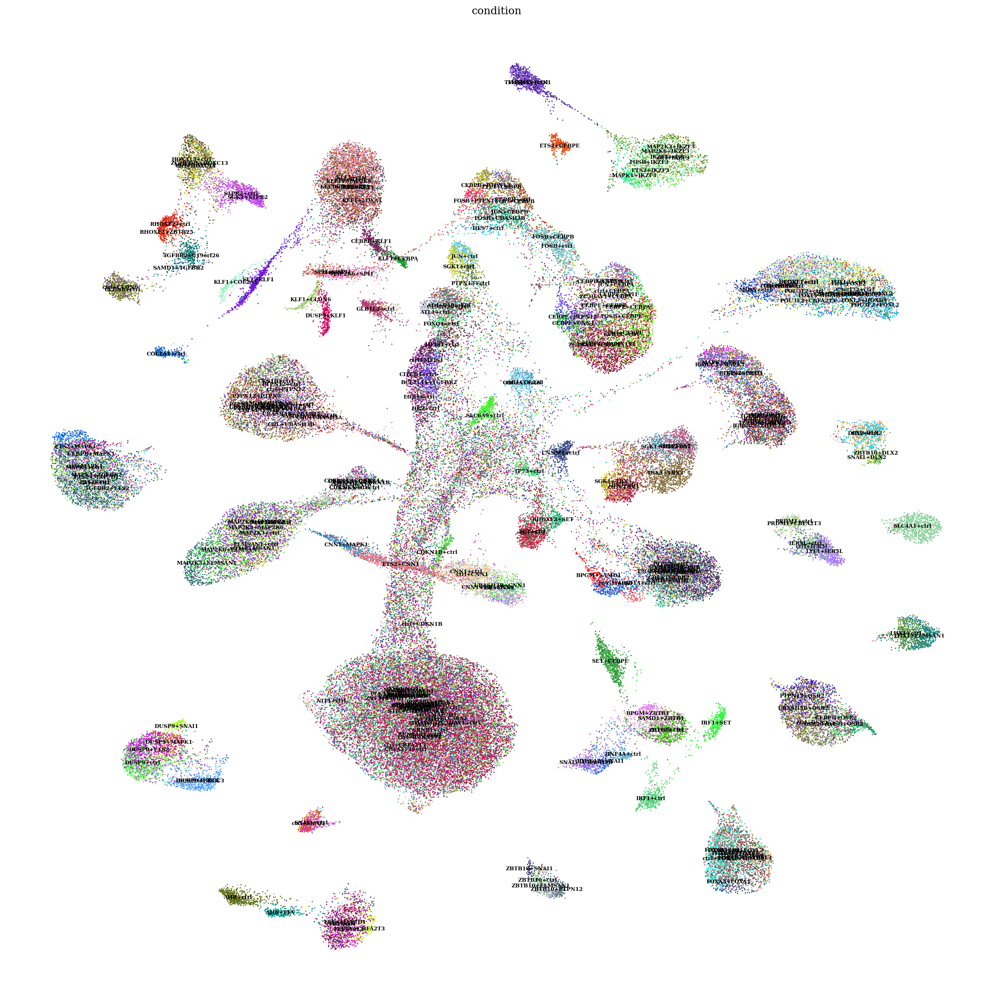

In [12]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()

In [13]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
rsc.utils.anndata_to_GPU(latent)
rsc.pp.neighbors(latent)
rsc.tl.umap(latent)

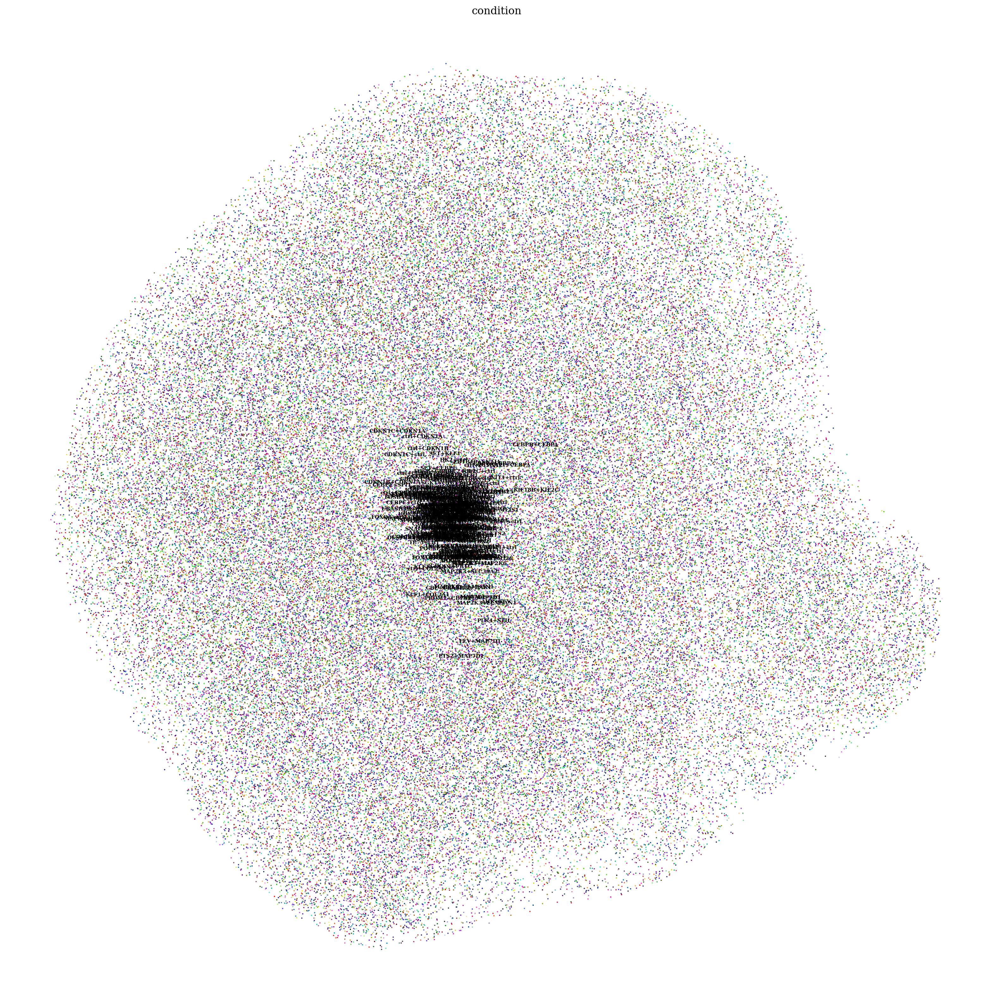

In [14]:
def generate_random_colors(num_colors):
    return ["#"+''.join([np.random.choice(list('0123456789ABCDEF')) for j in range(6)]) for i in range(num_colors)]
unique_cell_types = latent.obs["condition"].unique()
# Generate random colors for each unique cell type
random_colors = generate_random_colors(len(unique_cell_types))
# Create a dictionary to map cell types to colors
color_map = dict(zip(unique_cell_types, random_colors))

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    plt.figure(figsize=(20, 20))
    sc.pl.umap(
        latent, 
        color=["condition"], 
        ncols=1,
        size=8,
        frameon=False,
        palette=color_map,
        legend_loc="on data",
        legend_fontsize=6,
        legend_fontweight='bold',
        ax=plt.gca(),
    show=False
    )
plt.show()